In [54]:
# Importing required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import lasio
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from io import StringIO
import warnings
# Jupyter Notebook Configurations
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Preprocessing and ML Libraries
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GroupKFold
from sklearn.inspection import permutation_importance
from scipy.stats import randint, uniform

# Machine Learning Models
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.ensemble import GradientBoostingRegressor
from xgboost.callback import EarlyStopping
from xgboost import XGBRegressor

# Import RFECV for feature selection
from sklearn.feature_selection import RFECV

# Import PSO optimization libraries
from pyswarms.utils.functions import single_obj as fx
from pyswarms.utils.plotters import plot_cost_history
from pyswarms.utils.plotters.formatters import Mesher, Designer
from pyswarms.single.global_best import GlobalBestPSO
from pyswarms.single import LocalBestPSO
from pyswarms.single import GlobalBestPSO
from pyswarms.single.global_best import GlobalBestPSO

from skopt import BayesSearchCV
from skopt.space import Real, Integer
from sklearn.feature_selection import RFE
from sklearn.neural_network import MLPRegressor
import xgboost as xgb
from pymoo.algorithms.soo.nonconvex.pso import PSO

# Configuring pipeline visualization
from sklearn import set_config
set_config(display='diagram')

### Data Import 

In [ ]:
# Read the first LAS file for Cambriol J31A
df1_J31A = lasio.read("/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/LAS-017811.csv").df()
df1_J31A = df1_J31A[['DEPTH', 'ROP5', 'SWOB', 'HKLA', 'ECD', 'DHAP', 'STOR', 'DHAT', 'RPM', 'SPPA', 'TFLO']]  

# Read the second LAS file and select only needed columns
df2_J31A = lasio.read("/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/LAS-017812.csv").df()
df2_J31A = df2_J31A[['DEPTH', 'ROP5', 'GR_CAL', 'TNPH', 'RHOB']]

# Concatenate the two dataframes and reset index with DEPTH
df_J31A = pd.concat([df1_J31A, df2_J31A], axis=0)
df_J31A.set_index('DEPTH', inplace=True)
df_J31A.reset_index(inplace=True)

# Split data by which columns are NaN and merge on nearest DEPTH
A_J31A = df_J31A[df_J31A['HKLA'].notna()][['DEPTH', 'ROP5', 'SWOB', 'HKLA', 'ECD', 'DHAP', 'STOR', 'DHAT', 'RPM', 'SPPA', 
                                           'TFLO']].sort_values('DEPTH')
B_J31A = df_J31A[df_J31A['GR_CAL'].notna()][['DEPTH', 'GR_CAL', 'TNPH', 'RHOB']].sort_values('DEPTH')

# Drop any rows with null values in DEPTH column before merging
A_J31A = A_J31A.dropna(subset=['DEPTH'])
B_J31A = B_J31A.dropna(subset=['DEPTH'])

# Merge dataframes using nearest DEPTH match
df_J31A = pd.merge_asof(
    A_J31A, B_J31A,
    on='DEPTH',
    direction='nearest', 
    tolerance=0.1  # Tolerance for depth matching
)
# Drop rows where DEPTH is greater than 4333 or DEPTH <= 3374
df_J31A = df_J31A[(df_J31A["DEPTH"] <= 4333) & (df_J31A["DEPTH"] >= 3374)]

# Drop rows where ROP is greater than 100 or ROP <= 0
df_J31A = df_J31A[(df_J31A["ROP5"] > 5) & (df_J31A["ROP5"] <= 100)]

# Drop rows where STOR <= 0
df_J31A = df_J31A[df_J31A["STOR"] > 0]

# Drop rows where HKLA < 0 (if that can happen)
df_J31A = df_J31A[df_J31A["HKLA"] >= 0]
# Suppose your drilling SWOB typically lies between 1 and 20 klbf
df_J31A = df_J31A[(df_J31A["SWOB"] >= 1) & (df_J31A["SWOB"] <= 20)]

# Suppose your drilling RPM typically lies between 50 and 250
df_J31A = df_J31A[(df_J31A["RPM"] >= 50) & (df_J31A["RPM"] <= 250)]

print(df_J31A.info())
print(df_J31A.head())


2025-07-08 14:09:57,786 - lasio.reader - INFO - windows-1252 was found by ad hoc to work but note it might not be the correct encoding
2025-07-08 14:09:57,793 - lasio.reader - INFO - Opening /Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/LAS-017811.csv as windows-1252 and treating errors with "replace"


2025-07-08 14:09:59,565 - lasio.las - INFO - The read substitutions ['run-on(-)']have been removed as this file appears to contain hyphens.
2025-07-08 14:10:11,404 - lasio.reader - INFO - windows-1252 was found by ad hoc to work but note it might not be the correct encoding
2025-07-08 14:10:11,405 - lasio.reader - INFO - Opening /Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/LAS-017812.csv as windows-1252 and treating errors with "replace"
2025-07-08 14:10:11,664 - lasio.las - INFO - The read substitutions ['run-on(-)']have been removed as this file appears to contain hyphens.


<class 'pandas.core.frame.DataFrame'>
Index: 5670 entries, 5178 to 20482
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   DEPTH   5670 non-null   float64
 1   ROP5    5670 non-null   float64
 2   SWOB    5670 non-null   float64
 3   HKLA    5670 non-null   float64
 4   ECD     5670 non-null   float64
 5   DHAP    5670 non-null   float64
 6   STOR    5670 non-null   float64
 7   DHAT    5670 non-null   float64
 8   RPM     5670 non-null   float64
 9   SPPA    5670 non-null   float64
 10  TFLO    5670 non-null   float64
 11  GR_CAL  5603 non-null   float64
 12  TNPH    5438 non-null   float64
 13  RHOB    5438 non-null   float64
dtypes: float64(14)
memory usage: 664.5 KB
None
           DEPTH      ROP5  SWOB       HKLA      ECD      DHAP   STOR  DHAT  \
5178  3374.39990  57.61843  1.11  129.66000  1.81683  597.9823   7.38  60.0   
5181  3374.60010  53.93931  3.56  127.21000  1.81590  597.7065   9.55  60.0   
5187  3374.73999 

In [ ]:
# Read the first LAS file for Cambriol G92
df1_G92 = lasio.read("/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Cambriol G-92/LAS-014440.csv").df()
df1_G92 = df1_G92[['DEPTH', 'ROP5', 'SWOB', 'HKLA', 'ECD', 'DHAP', 'STOR', 'DHAT', 'RPM', 'SPPA', 'TFLO']]     

# Read the second LAS file and select only needed columns
df2_G92 = lasio.read("/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Cambriol G-92/LAS-014439.csv").df()
df2_G92 = df2_G92[['DEPTH', 'ROP5', 'GR_CAL']]

# Concatenate the two dataframes and reset index with DEPTH
df_G92 = pd.concat([df1_G92, df2_G92], axis=0)
df_G92.set_index('DEPTH', inplace=True)
df_G92.reset_index(inplace=True)

# Split data by which columns are NaN and merge on nearest DEPTH
A_G92 = df_G92[df_G92['HKLA'].notna()][['DEPTH', 'ROP5', 'SWOB', 'HKLA', 'ECD', 'DHAP', 'STOR', 'DHAT', 'RPM', 
                                        'SPPA', 'TFLO']].sort_values('DEPTH')
B_G92 = df_G92[df_G92['GR_CAL'].notna()][['DEPTH', 'GR_CAL']].sort_values('DEPTH')

# Drop any rows with null values in DEPTH column before merging
A_G92 = A_G92.dropna(subset=['DEPTH'])
B_G92 = B_G92.dropna(subset=['DEPTH'])

# Merge dataframes using nearest DEPTH match
df_G92 = pd.merge_asof(
    A_G92, B_G92,
    on='DEPTH',
    direction='nearest', 
    tolerance=0.1  # Tolerance for depth matching
)
# Drop rows where DEPTH is greater than 4333 or DEPTH <= 3374
df_G92 = df_G92[(df_G92["DEPTH"] <= 4083) & (df_G92["DEPTH"] >= 3440)]

# Drop rows where ROP is greater than 100 or ROP <= 0
df_G92 = df_G92[(df_G92["ROP5"] > 5) & (df_G92["ROP5"] <= 100)]

# Drop rows where STOR <= 0
df_G92 = df_G92[df_G92["STOR"] > 0]

# Drop rows where HKLA < 0 (if that can happen)
df_G92 = df_G92[df_G92["HKLA"] >= 0]
# Suppose your drilling SWOB typically lies between 1 and 20 klbf
df_G92 = df_G92[(df_G92["SWOB"] >= 1) & (df_G92["SWOB"] <= 20)]

# Suppose your drilling RPM typically lies between 50 and 250
df_G92 = df_G92[(df_G92["RPM"] >= 50) & (df_G92["RPM"] <= 250)]

print(df_G92.info())
print(df_G92.head())


2025-07-08 01:06:36,409 - lasio.reader - INFO - windows-1252 was found by ad hoc to work but note it might not be the correct encoding
2025-07-08 01:06:36,766 - lasio.reader - INFO - Opening /Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Cambriol G-92/LAS-014440.csv as windows-1252 and treating errors with "replace"


2025-07-08 01:06:46,315 - lasio.las - INFO - The read substitutions ['run-on(-)']have been removed as this file appears to contain hyphens.
2025-07-08 01:07:10,055 - lasio.reader - INFO - windows-1252 was found by ad hoc to work but note it might not be the correct encoding
2025-07-08 01:07:10,081 - lasio.reader - INFO - Opening /Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Cambriol G-92/LAS-014439.csv as windows-1252 and treating errors with "replace"


<class 'pandas.core.frame.DataFrame'>
Index: 3964 entries, 29507 to 44997
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   DEPTH   3964 non-null   float64
 1   ROP5    3964 non-null   float64
 2   SWOB    3964 non-null   float64
 3   HKLA    3964 non-null   float64
 4   ECD     3964 non-null   float64
 5   DHAP    3964 non-null   float64
 6   STOR    3964 non-null   float64
 7   DHAT    3964 non-null   float64
 8   RPM     3964 non-null   float64
 9   SPPA    3964 non-null   float64
 10  TFLO    3964 non-null   float64
 11  GR_CAL  3903 non-null   float64
dtypes: float64(12)
memory usage: 402.6 KB
None
            DEPTH     ROP5     SWOB      HKLA      ECD      DHAP      STOR  \
29507  3442.29639  5.61434  2.81890  141.2407  1.80652  607.8418  10.11148   
29529  3442.53809  5.34909  2.15030  141.9093  1.80743  608.1865   8.03665   
29545  3442.74341  5.05775  3.52430  140.5353  1.80690  608.0486   9.58779   
29731  3444.169

In [61]:
# Read the first LAS file for Cappahayden K67Z
df1_K67Z = lasio.read("/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Cappahayden K67Z/LAS-014313.csv").df()
df1_K67Z = df1_K67Z[['DEPTH', 'ROP5', 'SWOB', 'HKLA', 'ECD', 'DHAP', 'STOR', 'DHAT', 'RPM', 'SPPA', 'TFLO']]     

# Read the second LAS file and select only needed columns
df2_K67Z = lasio.read("/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Cappahayden K67Z/LAS-014312.csv").df()
df2_K67Z = df2_K67Z[['DEPTH', 'ROP5', 'GR_CAL']]

# Concatenate the two dataframes and reset index with DEPTH
df_K67Z = pd.concat([df1_K67Z, df2_K67Z], axis=0)
df_K67Z.set_index('DEPTH', inplace=True)
df_K67Z.reset_index(inplace=True)

# Split data by which columns are NaN and merge on nearest DEPTH
A_K67Z = df_K67Z[df_K67Z['HKLA'].notna()][['DEPTH', 'ROP5', 'SWOB', 'HKLA', 'ECD', 'DHAP', 'STOR', 'DHAT', 'RPM', 
                                           'SPPA', 'TFLO']].sort_values('DEPTH')
B_K67Z = df_K67Z[df_K67Z['GR_CAL'].notna()][['DEPTH', 'GR_CAL']].sort_values('DEPTH')

# Drop any rows with null values in DEPTH column before merging
A_K67Z = A_K67Z.dropna(subset=['DEPTH'])
B_K67Z = B_K67Z.dropna(subset=['DEPTH'])

# Merge dataframes using nearest DEPTH match
df_K67Z = pd.merge_asof(
    A_K67Z, B_K67Z,
    on='DEPTH',
    direction='nearest', 
    tolerance=0.1  # Tolerance for depth matching
)
# Drop rows where DEPTH is less than 3155 or DEPTH <= 2093
df_K67Z = df_K67Z[(df_K67Z["DEPTH"] <= 3155) & (df_K67Z["DEPTH"] >= 2093)]

# Drop rows where ROP is greater than 100 or ROP <= 0
df_K67Z = df_K67Z[(df_K67Z["ROP5"] > 5) & (df_K67Z["ROP5"] <= 100)]

# Drop rows where STOR <= 0
df_K67Z = df_K67Z[df_K67Z["STOR"] > 0]

# Drop rows where HKLA < 0 (if that can happen)
df_K67Z = df_K67Z[df_K67Z["HKLA"] >= 0]
# Suppose your drilling SWOB typically lies between 1 and 20 klbf
df_K67Z = df_K67Z[(df_K67Z["SWOB"] >= 1) & (df_K67Z["SWOB"] <= 20)]

# Suppose your drilling RPM typically lies between 50 and 250
df_K67Z = df_K67Z[(df_K67Z["RPM"] >= 50) & (df_K67Z["RPM"] <= 250)]

print(df_K67Z.info())
print(df_K67Z.head())


2025-07-07 21:28:46,176 - lasio.reader - INFO - windows-1252 was found by ad hoc to work but note it might not be the correct encoding
2025-07-07 21:28:46,178 - lasio.reader - INFO - Opening /Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Cappahayden K67Z/LAS-014313.csv as windows-1252 and treating errors with "replace"
2025-07-07 21:28:46,961 - lasio.las - INFO - The read substitutions ['run-on(-)']have been removed as this file appears to contain hyphens.
2025-07-07 21:28:54,734 - lasio.reader - INFO - windows-1252 was found by ad hoc to work but note it might not be the correct encoding
2025-07-07 21:28:54,735 - lasio.reader - INFO - Opening /Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Cappahayden K67Z/LAS-014312.csv as windows-1252 and treating errors with "replace"


<class 'pandas.core.frame.DataFrame'>
Index: 5220 entries, 9633 to 25688
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   DEPTH   5220 non-null   float64
 1   ROP5    5220 non-null   float64
 2   SWOB    5220 non-null   float64
 3   HKLA    5220 non-null   float64
 4   ECD     5220 non-null   float64
 5   DHAP    5220 non-null   float64
 6   STOR    5220 non-null   float64
 7   DHAT    5220 non-null   float64
 8   RPM     5220 non-null   float64
 9   SPPA    5220 non-null   float64
 10  TFLO    5220 non-null   float64
 11  GR_CAL  5210 non-null   float64
dtypes: float64(12)
memory usage: 530.2 KB
None
           DEPTH      ROP5     SWOB       HKLA      ECD      DHAP     STOR  \
9633  2093.02075   9.54088  2.39538   99.61832  1.35411  276.5487  7.85132   
9641  2093.67065   9.02358  1.21810  100.79560  1.35470  276.7556  7.77970   
9651  2094.15820  26.71086  2.67198   99.34172  1.35472  276.8245  8.46788   
9652  2094.38452

In [62]:
# Read the LAS file for Bay du Nord C-78
df_C78 = lasio.read("/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Bay du Nord C-78/LAS-003798.csv").df()
df_C78 = df_C78[['DEPTH', 'ROP5', 'SWOB', 'HKLA', 'ECD', 'DHAP', 'STOR', 'DHAT', 'RPM', 'GR', 'SPPA', 'TFLO']]
# Rename GR column to GR_CAL to match other dataframes
df_C78 = df_C78.rename(columns={'GR': 'GR_CAL'})


# Set DEPTH as index and reset
df_C78.set_index('DEPTH', inplace=True)
df_C78.reset_index(inplace=True)

# Drop rows where DEPTH is greater than 3155 or DEPTH <= 2093
df_C78 = df_C78[(df_C78["DEPTH"] <= 2858) & (df_C78["DEPTH"] >= 1908)]

# Drop rows where ROP is greater than 100 or ROP <= 0
df_C78 = df_C78[(df_C78["ROP5"] > 5) & (df_C78["ROP5"] <= 100)]

# Drop rows where STOR <= 0
df_C78 = df_C78[df_C78["STOR"] > 0]

# Drop rows where HKLA < 0 (if that can happen)
df_C78 = df_C78[df_C78["HKLA"] >= 0]

# Suppose your drilling SWOB typically lies between 1 and 20 klbf
df_C78 = df_C78[(df_C78["SWOB"] >= 1) & (df_C78["SWOB"] <= 20)]

# Suppose your drilling RPM typically lies between 50 and 250
df_C78 = df_C78[(df_C78["RPM"] >= 50) & (df_C78["RPM"] <= 250)]

print(df_C78.info())
print(df_C78.head())


2025-07-07 21:28:55,351 - lasio.reader - INFO - windows-1252 was found by ad hoc to work but note it might not be the correct encoding
2025-07-07 21:28:55,353 - lasio.reader - INFO - Opening /Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Bay du Nord C-78/LAS-003798.csv as windows-1252 and treating errors with "replace"
2025-07-07 21:28:55,517 - lasio.las - INFO - The read substitutions ['run-on(-)']have been removed as this file appears to contain hyphens.


<class 'pandas.core.frame.DataFrame'>
Index: 4185 entries, 1 to 4744
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   DEPTH   4185 non-null   float64
 1   ROP5    4185 non-null   float64
 2   SWOB    4185 non-null   float64
 3   HKLA    4185 non-null   float64
 4   ECD     4142 non-null   float64
 5   DHAP    4142 non-null   float64
 6   STOR    4185 non-null   float64
 7   DHAT    4138 non-null   float64
 8   RPM     4185 non-null   float64
 9   GR_CAL  4138 non-null   float64
 10  SPPA    4185 non-null   float64
 11  TFLO    4185 non-null   float64
dtypes: float64(12)
memory usage: 425.0 KB
None
        DEPTH      ROP5     SWOB      HKLA       ECD      DHAP  STOR  DHAT  \
1  1908.20007  37.26318  1.05488  144.3199  1136.707  21208.27  2.84  24.0   
2  1908.40796  55.93700  1.10033  144.3653  1136.941  21215.17  2.84  24.0   
3  1908.60242  28.79972  3.31239  142.0492  1136.414  21208.27  7.09  24.0   
4  1908.81018  26.03

### Data Cleaning

In machine learning, data cleaning involves correcting or removing inaccurate, missing, or irrelevant data to ensure models learn from high-quality inputs. It includes tasks like handling missing values, fixing formats, removing duplicates, and normalizing data for consistency and accuracy.

In [63]:
# Define lithology labels for J31A well
lithology_J31A = {
    (3370, 4147): 'c',    # Claystone
    (4147, 4153.5): 'm',  # Marl
    (4153.5, 4155.5): 'l', # Limestone
    (4155.5, 4158): 'm',   # Marl
    (4158, 4159.5): 'l',   # Limestone
    (4159.5, 4175): 'c',   # Claystone
    (4175, 4189): 'm',     # Marl
    (4189, 4280.5): 'l',   # Limestone
    (4280.5, 4281): 'm',   # Marl
    (4281, 4281.5): 'c',   # Claystone
    (4281.5, 4282): 'm',   # Marl
    (4282, 4282.5): 'c',   # Claystone
    (4282.5, 4299): 'm', # Marl
    (4299, 4333): 'c'      # Claystone
}

# Create lithology column for J31A
df_J31A['LITHOLOGY'] = None

# Assign lithology values based on depth ranges
for (start, end), lith in lithology_J31A.items():
    mask = (df_J31A['DEPTH'] >= start) & (df_J31A['DEPTH'] < end)
    df_J31A.loc[mask, 'LITHOLOGY'] = lith

# Define lithology labels for G92 well
lithology_G92 = {
    (3440, 3575): 'c',    # Claystone
    (3575, 3577): 's',    # Siltstone
    (3577, 3580.5): 'c',  # Claystone
    (3580.5, 3583): 's',  # Siltstone
    (3583, 3583.5): 'c',  # Claystone
    (3583.5, 3675.5): 'c', # Claystone
    (3675.5, 3676.5): 'l', # Limestone
    (3676.5, 3677): 'c',   # Claystone
    (3677, 3680): 's',     # Siltstone
    (3680, 3686): 'c',     # Claystone
    (3686, 3688): 's',     # Siltstone
    (3688, 3694): 'c',     # Claystone
    (3694, 3696): 'l',     # Limestone
    (3696, 3706): 'c',     # Claystone
    (3706, 3707): 'l',     # Limestone
    (3707, 3739.5): 'c',   # Claystone
    (3739.5, 3742): 's',   # Siltstone
    (3742, 3760): 'c',     # Claystone
    (3760, 3766): 'l',     # Limestone
    (3766, 3788): 'm',     # Marl
    (3788, 3799): 'l',     # Limestone
    (3799, 3801): 'l',     # Limestone
    (3801, 3878): 'l',     # Limestone
    (3878, 3900): 'm',     # Marl
    (3900, 3970): 'c',     # Claystone
    (3970, 3970.5): 'l',   # Limestone
    (3970.5, 3976): 'c',   # Claystone
    (3976, 3976.5): 'l',   # Limestone
    (3976.5, 4067): 'c',   # Claystone
    (4067, 4067.5): 'l',   # Limestone
    (4067.5, 4500): 'c'    # Claystone to end
}

# Create lithology column for G92
df_G92['LITHOLOGY'] = None
df_G92['TNPH'] = None
df_G92['RHOB'] = None

# Assign lithology values based on depth ranges
for (start, end), lith in lithology_G92.items():
    mask = (df_G92['DEPTH'] >= start) & (df_G92['DEPTH'] < end)
    df_G92.loc[mask, 'LITHOLOGY'] = lith
    
    # Add TNPH and RHOB for claystone sections
    if lith == 'c':
        df_G92.loc[mask, 'TNPH'] = np.random.uniform(33.73, 37.89, size=len(df_G92[mask]))
        df_G92.loc[mask, 'RHOB'] = np.random.uniform(2.45, 2.49, size=len(df_G92[mask]))
    elif lith == 'm':
        df_G92.loc[mask, 'TNPH'] = np.random.uniform(15.17, 22.55, size=len(df_G92[mask]))
        df_G92.loc[mask, 'RHOB'] = np.random.uniform(2.60, 2.63, size=len(df_G92[mask]))
    elif lith == 'l':
        df_G92.loc[mask, 'TNPH'] = np.random.uniform(20.44, 26.20, size=len(df_G92[mask]))
        df_G92.loc[mask, 'RHOB'] = np.random.uniform(2.54, 2.58, size=len(df_G92[mask]))
    elif lith == 's':
        df_G92.loc[mask, 'TNPH'] = np.random.uniform(25, 33, size=len(df_G92[mask]))  # Using Q1 to Q3 range
        df_G92.loc[mask, 'RHOB'] = np.random.uniform(2.3, 2.55, size=len(df_G92[mask]))  # Using Q1 to Q3 range

# Define lithology labels for C78 well
lithology_C78 = {
    (1908, 1951.5): 'c',    # Claystone
    (1951.5, 1953.5): 's',  # Siltstone
    (1953.5, 1955): 'l',  # Limestone
    (1955, 1957.5): 'c',    # Claystone
    (1957.5, 1958.5): 's',  # Siltstone
    (1958.5, 1966.5): 'c',  # Claystone
    (1966.5, 1969): 's',    # Siltstone
    (1969, 1970.5): 'c',    # Claystone
    (1970.5, 1973.5): 's',  # Siltstone
    (1973.5, 1974.5): 'c',  # Claystone
    (1974.5, 2019): 'c',    # Claystone
    (2019, 2020): 's',      # Siltstone
    (2020, 2024.5): 'c',    # Claystone
    (2024.5, 2025.5): 's',  # Siltstone
    (2025.5, 2029.5): 'c',  # Claystone
    (2029.5, 2030.5): 's',  # Siltstone
    (2030.5, 2031): 'c',    # Claystone
    (2031, 2031.5): 'l',    # Limestone
    (2031.5, 2107): 'c',    # Claystone
    (2107, 2109.5): 's',    # Siltstone
    (2109.5, 2110.5): 'c',  # Claystone
    (2110.5, 2112.5): 's',  # Siltstone
    (2112.5, 2338): 'c',    # Claystone
    (2338, 2400): 'l',      # Limestone
    (2400, 2408): 'c',      # Claystone
    (2408, 2500): 'l',      # Limestone
    (2500, 2503): 'c',      # Claystone
    (2503, 2510): 'l',      # Limestone
    (2510, 2514): 'c',      # Claystone
    (2514, 2526): 'l',      # Limestone
    (2526, 2527): 'c',      # Claystone
    (2527, 2528): 'l',      # Limestone
    (2528, 2529): 'c',      # Claystone
    (2529, 2530): 'l',      # Limestone
    (2530, 2531): 'c',      # Claystone
    (2531, 2532): 'l',      # Limestone
    (2532, 2533): 'c',      # Claystone
    (2533, 2535): 'l',      # Limestone
    (2535, 2536): 'c',      # Claystone
    (2536, 2537): 'l',      # Limestone
    (2537, 2538): 'c',      # Claystone
    (2538, 2539): 'l',      # Limestone
    (2539, 2541): 'c',      # Claystone
    (2541, 2543): 'l',      # Limestone
    (2543, 2544): 'c',      # Claystone
    (2544, 2545): 'l',      # Limestone
    (2545, 2548): 'c',      # Claystone
    (2548, 2549): 'l',      # Limestone
    (2549, 2550): 'c',      # Claystone
    (2550, 2551): 'l',      # Limestone
    (2551, 2555): 'c',      # Claystone
    (2555, 2556): 'l',      # Limestone
    (2556, 2558): 'c',      # Claystone
    (2558, 2560): 'l',      # Limestone
    (2560, 2562): 'c',      # Claystone
    (2562, 2564): 'l',      # Limestone
    (2564, 2566): 'c',      # Claystone
    (2566, 2568): 'l',      # Limestone
    (2568, 2575): 'c',      # Claystone
    (2575, 2576): 'l',      # Limestone
    (2576, 2597): 'c',      # Claystone
    (2597, 2598): 's',      # Siltstone
    (2598, 2618): 'c',      # Claystone
    (2618, 2619): 's',      # Siltstone
    (2619, 2634): 'c',      # Claystone
    (2634, 2635): 's',      # Siltstone
    (2635, 2637): 'c',      # Claystone
    (2637, 2638): 's',      # Siltstone
    (2638, 2639): 'c',      # Claystone
    (2639, 2659): 'c',      # Claystone
    (2659, 2660): 's',      # Siltstone
    (2660, 2664): 'c',      # Claystone
    (2664, 2665): 's',      # Siltstone
    (2665, 2670): 'c',      # Claystone
    (2670, 2671): 's',      # Siltstone
    (2671, 2672): 'c',      # Claystone
    (2672, 2673): 's',      # Siltstone
    (2673, 2675): 'c',      # Claystone
    (2675, 2688): 'c',      # Claystone
    (2688, 2689): 's',      # Siltstone
    (2689, 2696): 'c',      # Claystone
    (2696, 2697.5): 'c',    # Claystone
    (2697.5, 2698.5): 'c',  # Claystone
    (2698.5, 2699.5): 's',  # Siltstone
    (2699.5, 2700.5): 'c',  # Claystone
    (2700.5, 2702): 's',    # Siltstone
    (2702, 2704): 'c',      # Claystone
    (2704, 2710): 's',      # Siltstone
    (2710, 2724.5): 'c',    # Claystone
    (2724.5, 2727): 's',    # Siltstone
    (2727, 2730): 'c',      # Claystone with marl
    (2730, 2731.5): 's',    # Siltstone
    (2731.5, 2740): 'c',    # Claystone
    (2740, 2741.5): 's',    # Siltstone
    (2741.5, 2745): 'c',    # Claystone
    (2745, 2746.5): 's',    # Siltstone
    (2746, 2754): 'c',      # Claystone
    (2754, 2755): 's',      # Siltstone
    (2755, 2760): 'c',      # Claystone
    (2760, 2761): 's',      # Siltstone
    (2761, 2764): 's',      # Siltstone with marl
    (2764, 2765): 'm',      # Marl
    (2765, 2767): 'c',      # Claystone
    (2767, 2769.5): 's',    # Siltstone
    (2769.5, 2773): 'c',    # Claystone
    (2773, 2773.5): 'm',    # Marl
    (2773.5, 2777.5): 'c',  # Claystone
    (2777.5, 2779): 's',    # Siltstone
    (2779, 2782): 'c',      # Claystone
    (2782, 2783): 'm',      # Marl
    (2783, 2786): 'c',      # Claystone
    (2786, 2787): 'm',      # Marl
    (2787, 2797): 'c',      # Claystone
    (2797, 2799.5): 's',    # Siltstone
    (2799.5, 2800.5): 'c',  # Claystone
    (2800.5, 2801.5): 'm',  # Marl
    (2801.5, 2802.5): 'c',  # Claystone
    (2802.5, 2803.5): 'm',  # Marl
    (2803.5, 2806.5): 'c',  # Claystone
    (2806.5, 2807.5): 'm',  # Marl
    (2807.5, 2808.5): 'c',  # Claystone
    (2808.5, 2809.5): 's',  # Siltstone
    (2809.5, 2810.5): 'c',  # Claystone
    (2810.5, 2811): 'm',    # Marl
    (2811, 2827): 'c',    # Claystone
    (2827, 2828): 'm',      # Marl
    (2828, 2830): 'c',      # Claystone
    (2830, 2831): 'm',      # Marl
    (2831, 2833): 'c',      # Claystone
    (2833, 2834): 'm',      # Marl
    (2834, 2835): 'c',      # Claystone
    (2835, 2836): 'm',      # Marl
    (2836, 2840): 'c',      # Claystone
    (2840, 2841): 'm',      # Marl
    (2841, 3000): 'c'       # Claystone to end
}

# Create lithology column for C78
df_C78['LITHOLOGY'] = None
df_C78['TNPH'] = None
df_C78['RHOB'] = None

# Assign lithology values based on depth ranges
for (start, end), lith in lithology_C78.items():
    mask = (df_C78['DEPTH'] >= start) & (df_C78['DEPTH'] < end)
    df_C78.loc[mask, 'LITHOLOGY'] = lith
    
        # Add TNPH and RHOB for claystone sections
    if lith == 'c':
        df_C78.loc[mask, 'TNPH'] = np.random.uniform(33.73, 37.89, size=len(df_C78[mask]))
        df_C78.loc[mask, 'RHOB'] = np.random.uniform(2.45, 2.49, size=len(df_C78[mask]))
    elif lith == 'm':
        df_C78.loc[mask, 'TNPH'] = np.random.uniform(15.17, 22.55, size=len(df_C78[mask]))
        df_C78.loc[mask, 'RHOB'] = np.random.uniform(2.60, 2.63, size=len(df_C78[mask]))
    elif lith == 'l':
        df_C78.loc[mask, 'TNPH'] = np.random.uniform(20.44, 26.20, size=len(df_C78[mask]))
        df_C78.loc[mask, 'RHOB'] = np.random.uniform(2.54, 2.58, size=len(df_C78[mask]))
    elif lith == 's':
        df_C78.loc[mask, 'TNPH'] = np.random.uniform(25, 33, size=len(df_C78[mask]))  # Using Q1 to Q3 range
        df_C78.loc[mask, 'RHOB'] = np.random.uniform(2.3, 2.55, size=len(df_C78[mask]))  # Using Q1 to Q3 range

# Define lithology intervals for K67Z
lithology_K67Z = {
    (2093, 2119): 'c',      # Claystone
    (2119, 2120): 'l',      # Limestone
    (2120, 2469): 'c',      # Claystone
    (2469, 2470): 'l',      # Limestone
    (2470, 2545): 'c',      # Claystone
    (2545, 2546): 'l',      # Limestone
    (2546, 2837): 'c',      # Claystone
    (2837, 2838): 'l',      # Limestone
    (2838, 2995.5): 'c',    # Claystone
    (2995.5, 2996.5): 'l',  # Limestone
    (2996.5, 3044): 'c',    # Claystone
    (3044, 3045): 'l',      # Limestone
    (3045, 3046): 'c',      # Claystone
    (3046, 3047): 'l',      # Limestone
    (3047, 3091): 'c',      # Claystone
    (3091, 3092): 'l',      # Limestone
    (3092, 3099): 'c',      # Claystone
    (3099, 3100): 'l',      # Limestone
    (3100, 3108): 'c',      # Claystone
    (3108, 3114): 'c',      # Claystone
    (3114, 3155): 'm'       # Marl
}

# Create lithology column for K67Z
df_K67Z['LITHOLOGY'] = None
df_K67Z['TNPH'] = None
df_K67Z['RHOB'] = None

# Assign lithology values based on depth ranges
for (start, end), lith in lithology_K67Z.items():
    mask = (df_K67Z['DEPTH'] >= start) & (df_K67Z['DEPTH'] < end)
    df_K67Z.loc[mask, 'LITHOLOGY'] = lith
    
    # Add TNPH and RHOB for claystone and marl sections
    if lith == 'c':
        df_K67Z.loc[mask, 'TNPH'] = np.random.uniform(33.73, 37.89, size=len(df_K67Z[mask]))
        df_K67Z.loc[mask, 'RHOB'] = np.random.uniform(2.45, 2.49, size=len(df_K67Z[mask]))
    elif lith == 'm':
        df_K67Z.loc[mask, 'TNPH'] = np.random.uniform(15.17, 22.55, size=len(df_K67Z[mask]))
        df_K67Z.loc[mask, 'RHOB'] = np.random.uniform(2.60, 2.63, size=len(df_K67Z[mask]))
    elif lith == 'l':
        df_K67Z.loc[mask, 'TNPH'] = np.random.uniform(20.44, 26.20, size=len(df_K67Z[mask]))
        df_K67Z.loc[mask, 'RHOB'] = np.random.uniform(2.54, 2.58, size=len(df_K67Z[mask]))
    elif lith == 's':
        df_K67Z.loc[mask, 'TNPH'] = np.random.uniform(25, 33, size=len(df_K67Z[mask]))  # Using Q1 to Q3 range
        df_K67Z.loc[mask, 'RHOB'] = np.random.uniform(2.3, 2.55, size=len(df_K67Z[mask]))  # Using Q1 to Q3 range


In [64]:
# Convert ECD from kg/cm^3 to g/cm^3 for C-78 well
df_C78['ECD'] = df_C78['ECD'] / 1000
# Convert DHAP from kPa to bar for C-78 well (1 bar = 100 kPa)
df_C78['DHAP'] = df_C78['DHAP'] / 100
# Convert SPPA from kPa to bar for C-78 well (1 bar = 100 kPa)
df_C78['SPPA'] = df_C78['SPPA'] / 100

# Convert SWOB and HKLA from kgf to kN for J-31A well
df_J31A['SWOB1'] = df_J31A['SWOB'] * 10 / 9.80665  # Convert to kN
df_J31A['HKLA'] = df_J31A['HKLA'] * 10 / 9.80665  # Convert to kN

# Print statistics for SWOB and SWOB1 columns
print("\nSWOB Statistics:")
print(df_J31A['SWOB'].describe())
print("\nSWOB1 Statistics (J31A only):")
print(df_J31A['SWOB1'].describe())

# Print statistics for SWOB and SWOB1 columns
print("\nSWOB Statistics:")
print(df_J31A['SWOB'].describe())
print("\nSWOB1 Statistics (J31A only):")
print(df_J31A['SWOB1'].describe())




SWOB Statistics:
count    5670.000000
mean        9.360713
std         2.726229
min         1.070000
25%         7.422500
50%         9.500000
75%        11.320000
max        17.180000
Name: SWOB, dtype: float64

SWOB1 Statistics (J31A only):
count    5670.000000
mean        9.545270
std         2.779980
min         1.091096
25%         7.568844
50%         9.687304
75%        11.543188
max        17.518725
Name: SWOB1, dtype: float64

SWOB Statistics:
count    5670.000000
mean        9.360713
std         2.726229
min         1.070000
25%         7.422500
50%         9.500000
75%        11.320000
max        17.180000
Name: SWOB, dtype: float64

SWOB1 Statistics (J31A only):
count    5670.000000
mean        9.545270
std         2.779980
min         1.091096
25%         7.568844
50%         9.687304
75%        11.543188
max        17.518725
Name: SWOB1, dtype: float64


In [65]:
# Calculate MSE for G-92 (12.25 inch bit)
bit_diameter = 12.25  # inch
df_G92['MSE'] = (107788 * df_G92['STOR'] * df_G92['RPM'])/(bit_diameter**2 * df_G92['ROP5']) + (2.807 * df_G92['SWOB'])/(bit_diameter**2)
df_J31A['MSE'] = (107788 * df_J31A['STOR'] * df_J31A['RPM'])/(bit_diameter**2 * df_J31A['ROP5']) + (2.807 * df_J31A['SWOB'])/(bit_diameter**2)
df_K67Z['MSE'] = (107788 * df_K67Z['STOR'] * df_K67Z['RPM'])/(bit_diameter**2 * df_K67Z['ROP5']) + (2.807 * df_K67Z['SWOB'])/(bit_diameter**2)
df_C78['MSE'] = (107788 * df_C78['STOR'] * df_C78['RPM'])/(bit_diameter**2 * df_C78['ROP5']) + (2.807 * df_C78['SWOB'])/(bit_diameter**2)
print(df_G92['MSE'].describe())

count      3964.000000
mean      84545.069914
std       59249.770050
min       22948.942163
25%       36790.685457
50%       67491.884863
75%      113118.241034
max      394750.857806
Name: MSE, dtype: float64


In [66]:
# Apply linear interpolation to the columns with missing values in both dataframes
df_G92 = df_G92.interpolate(method='linear')
df_J31A = df_J31A.interpolate(method='linear')
df_K67Z = df_K67Z.interpolate(method='linear')
df_C78 = df_C78.interpolate(method='linear')

# Check if any NaNs remain (e.g., if first/last values were missing)
print("\nRemaining NaNs in G-92:")
print(df_G92.isnull().sum())

print("\nRemaining NaNs in J-31A:")
print(df_J31A.isnull().sum())

print("\nRemaining NaNs in K67Z:")
print(df_K67Z.isnull().sum())

print("\nRemaining NaNs in C-78:")
print(df_C78.isnull().sum())



Remaining NaNs in G-92:
DEPTH        0
ROP5         0
SWOB         0
HKLA         0
ECD          0
DHAP         0
STOR         0
DHAT         0
RPM          0
SPPA         0
TFLO         0
GR_CAL       0
LITHOLOGY    0
TNPH         0
RHOB         0
MSE          0
dtype: int64

Remaining NaNs in J-31A:
DEPTH        0
ROP5         0
SWOB         0
HKLA         0
ECD          0
DHAP         0
STOR         0
DHAT         0
RPM          0
SPPA         0
TFLO         0
GR_CAL       0
TNPH         0
RHOB         0
LITHOLOGY    0
SWOB1        0
MSE          0
dtype: int64

Remaining NaNs in K67Z:
DEPTH        0
ROP5         0
SWOB         0
HKLA         0
ECD          0
DHAP         0
STOR         0
DHAT         0
RPM          0
SPPA         0
TFLO         0
GR_CAL       0
LITHOLOGY    0
TNPH         0
RHOB         0
MSE          0
dtype: int64

Remaining NaNs in C-78:
DEPTH        0
ROP5         0
SWOB         0
HKLA         0
ECD          0
DHAP         0
STOR         0
DHAT         0
RPM  

### Exploratory Data Analysis (EDA)

EDA is the process of visually and statistically examining a dataset to understand its structure, patterns, and relationships before modeling. It helps identify trends, anomalies, correlations, and guides feature selection and preprocessing decisions.

In [27]:
# Statistical Summary of Each Well

print("G-92 Well Statistical Summary:")
print(df_G92.describe())
print("\nJ-31A Well Statistical Summary:")
print(df_J31A.describe())
print("\nK67Z Well Statistical Summary:")
print(df_K67Z.describe())
print("\nC-78 Well Statistical Summary:")
print(df_C78.describe())

G-92 Well Statistical Summary:
             DEPTH         ROP5         SWOB         HKLA          ECD  \
count  3964.000000  3964.000000  3964.000000  3964.000000  3964.000000   
mean   3766.157449    36.032055    10.309626   143.371198     1.790515   
std     185.613717    16.277501     3.862515     5.289975     0.003867   
min    3442.296390     5.003640     1.043930   133.257000     1.779440   
25%    3601.568970    22.967958     7.616660   138.017025     1.788978   
50%    3773.341795    36.190265    10.073000   144.104000     1.790780   
75%    3927.542605    49.070750    13.173360   147.337225     1.793490   
max    4079.907470    75.411270    19.859250   160.561100     1.807430   

              DHAP         STOR         DHAT          RPM         SPPA  \
count  3964.000000  3964.000000  3964.000000  3964.000000  3964.000000   
mean    659.301566    20.911281    83.411958   149.154136   383.840138   
std      32.257831     5.060011     6.938144    19.270035    13.982018   
min   

Drilling Logs

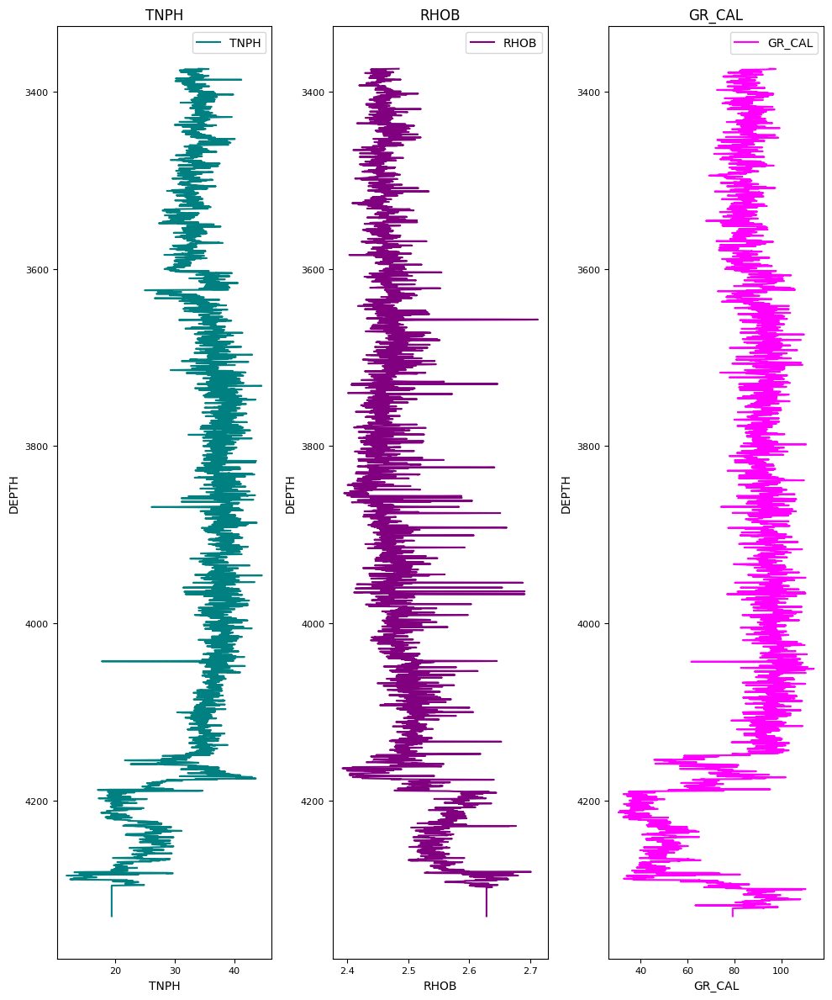

In [155]:
# Plot TNPH, RHOB, and GR_cal vs depth for J31A
logs = ['TNPH', 'RHOB', 'GR_CAL']
colors = ['teal', 'purple', 'magenta']  # Updated colors based on image

fig, axes = plt.subplots(1, len(logs), figsize=(10, 12))

for i, log in enumerate(logs):
    axes[i].plot(df_J31A[log], df_J31A['DEPTH'], 
                 color=colors[i], label=log)
    
    # Add legend
    axes[i].legend(fontsize=10)
    
    # Title and labels
    axes[i].set_title(log, fontsize=12)
    axes[i].set_xlabel(log, fontsize=10)
    axes[i].set_ylabel('DEPTH', fontsize=10)
    
    # Increase tick label font size
    axes[i].tick_params(axis='both', which='major', labelsize=8)
    
    # Invert the y-axis so depth increases downward
    axes[i].invert_yaxis()

plt.tight_layout()
plt.show()



<Figure size 6000x6000 with 0 Axes>

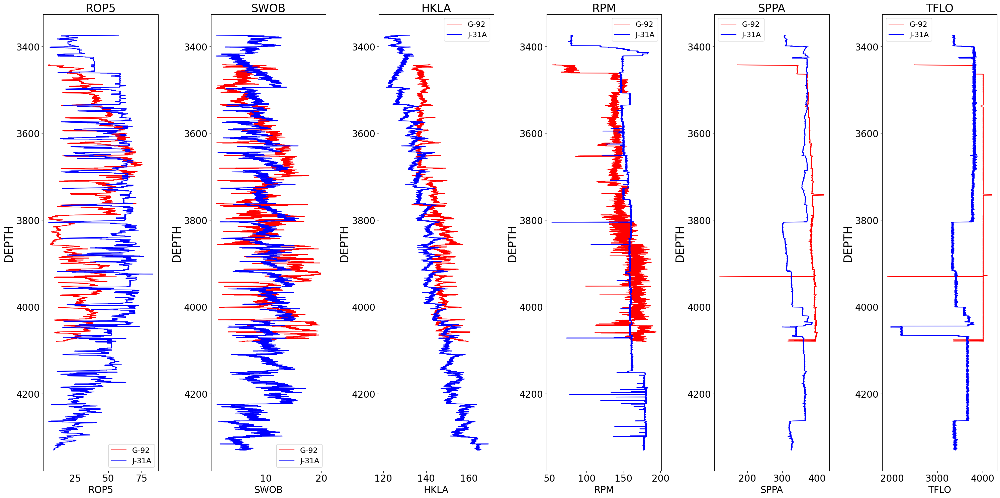

In [38]:
# Specify which columns to plot
logs = ['ROP5', 'SWOB','HKLA', 'RPM', 'SPPA', 'TFLO']
colors = ['red', 'blue']  # One color per well

plt.figure(figsize=(60, 60))

# Create subplots for each log
fig, axes = plt.subplots(1, len(logs), figsize=(30, 15))

for i, log in enumerate(logs):
    # Plot G92 well data
    axes[i].plot(df_G92[log], df_G92['DEPTH'],
            color='red', label='G-92')
    
    # Plot J31A well data
    axes[i].plot(df_J31A[log], df_J31A['DEPTH'],
            color='blue', label='J-31A')
    
    # Add legend
    axes[i].legend(fontsize=16)
    
    # Title and labels
    axes[i].set_title(log, fontsize=24)
    axes[i].set_xlabel(log, fontsize=20)
    axes[i].set_ylabel('DEPTH', fontsize=24)
    
    # Increase tick label font size
    axes[i].tick_params(axis='both', which='major', labelsize=20)
    
    # Invert the y-axis so depth increases downward
    axes[i].invert_yaxis()

plt.tight_layout()
plt.show()


<Figure size 6000x6000 with 0 Axes>

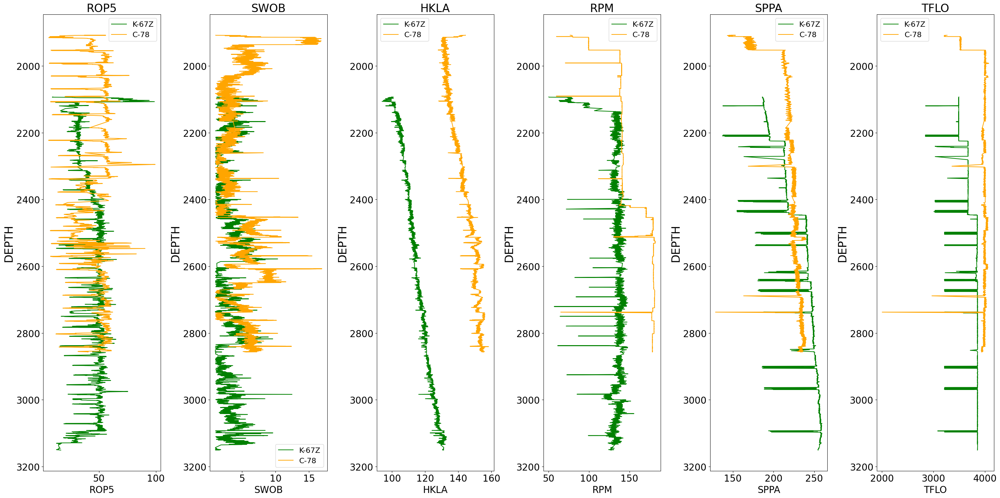

In [85]:
# Specify which columns to plot
logs = ['ROP5', 'SWOB','HKLA', 'RPM', 'SPPA', 'TFLO']
colors = ['green', 'orange']  # One color per well

plt.figure(figsize=(60, 60))

# Create subplots for each log
fig, axes = plt.subplots(1, len(logs), figsize=(30, 15))

for i, log in enumerate(logs):
    # Plot K67Z well data
    axes[i].plot(df_K67Z[log], df_K67Z['DEPTH'],
            color='green', label='K-67Z')
    
    # Plot C78 well data
    axes[i].plot(df_C78[log], df_C78['DEPTH'],
            color='orange', label='C-78')
    
    # Add legend
    axes[i].legend(fontsize=16)
    
    # Title and labels
    axes[i].set_title(log, fontsize=24)
    axes[i].set_xlabel(log, fontsize=20)
    axes[i].set_ylabel('DEPTH', fontsize=24)
    
    # Increase tick label font size
    axes[i].tick_params(axis='both', which='major', labelsize=20)
    
    # Invert the y-axis so depth increases downward
    axes[i].invert_yaxis()

plt.tight_layout()
plt.show()

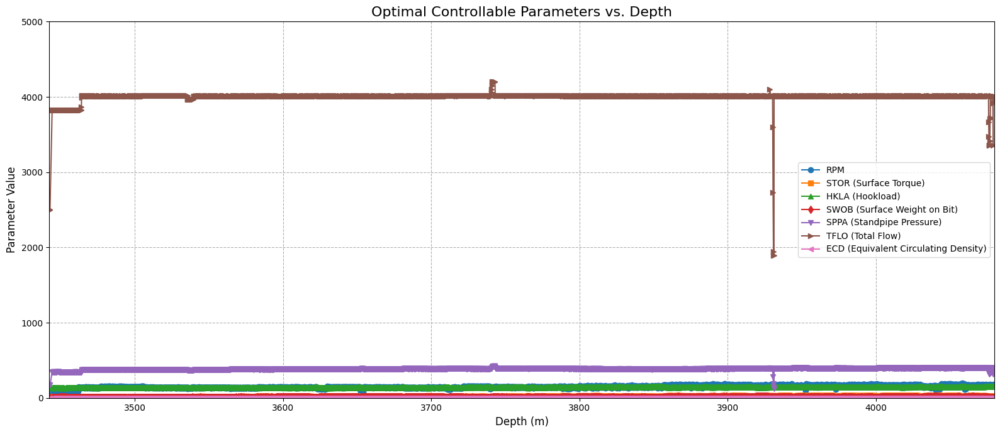

In [55]:
# Create figure and axis
fig, ax = plt.subplots(figsize=(16, 7))

# Define the parameters to plot, along with their specific markers and colors
# This makes it easy to manage the style of each line.
plot_styles = {
    'RPM': {'marker': 'o', 'color': '#1f77b4', 'label': 'RPM'},
    'STOR': {'marker': 's', 'color': '#ff7f0e', 'label': 'STOR (Surface Torque)'},
    'HKLA': {'marker': '^', 'color': '#2ca02c', 'label': 'HKLA (Hookload)'},
    'SWOB': {'marker': 'd', 'color': '#d62728', 'label': 'SWOB (Surface Weight on Bit)'},
    'SPPA': {'marker': 'v', 'color': '#9467bd', 'label': 'SPPA (Standpipe Pressure)'},
    'TFLO': {'marker': '>', 'color': '#8c564b', 'label': 'TFLO (Total Flow)'},
    'ECD': {'marker': '<', 'color': '#e377c2', 'label': 'ECD (Equivalent Circulating Density)'}
}

# Plot all logs on the same axis using the defined styles
for log, style in plot_styles.items():
    ax.plot(df_G92['DEPTH'], df_G92[log],
            marker=style['marker'],
            color=style['color'],
            label=style['label'])

# --- Styling to Match the Image ---

# Add a dashed grid
ax.grid(True, linestyle='--', which='both')

# Set titles and labels
ax.set_title('Optimal Controllable Parameters vs. Depth', fontsize=16)
ax.set_ylabel('Parameter Value', fontsize=12)
ax.set_xlabel('Depth (m)', fontsize=12)

# Set axis limits to match the image
ax.set_ylim(0, 5000)  # Increased y-axis limit to show SPPA values
ax.set_xlim(df_G92['DEPTH'].min(), df_G92['DEPTH'].max())

# Add the legend
ax.legend()

# Ensure a tight layout
plt.tight_layout()
plt.show()

Correlation Matrix

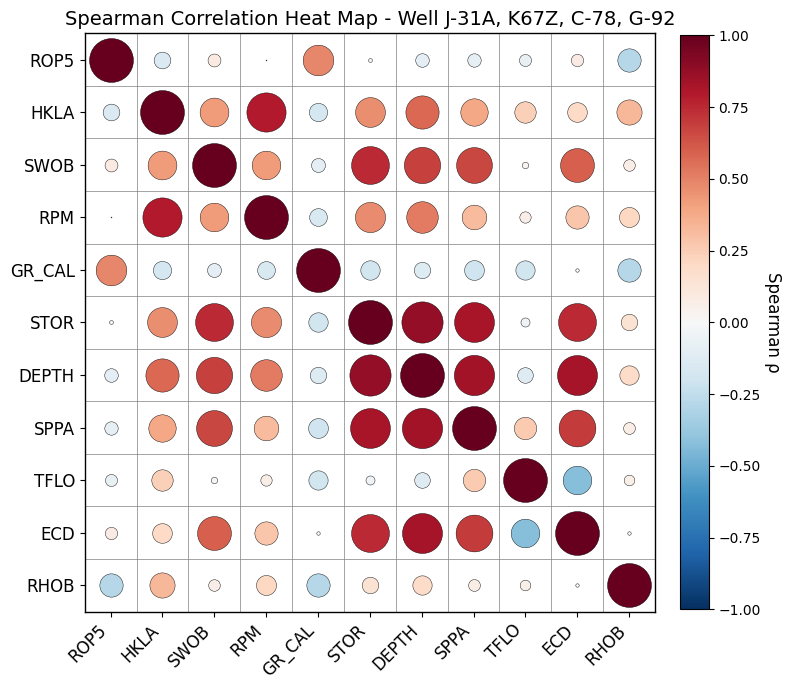

In [25]:
# Select relevant columns for correlation analysis
columns = ['ROP5', 'HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'DEPTH', 'SPPA', 'TFLO', 'ECD', 'RHOB'] 

# Combine data from all wells
combined_df = pd.concat([df_J31A[columns], df_K67Z[columns], df_C78[columns], df_G92[columns]], axis=0)

# Calculate correlation matrix using combined data
corr = combined_df.corr(method='spearman')

# Create correlation plot
fig, ax = plt.subplots(figsize=(8, 7))
cmap = plt.get_cmap('RdBu_r')
n = len(corr.columns)

# Plot circles
for i in range(n-1, -1, -1):
    for j in range(n):
        val = corr.iat[i, j]
        size = np.abs(val) * 1000
        
        ax.scatter(j, n-1-i,
                  s=size,
                  c=[val],
                  cmap=cmap, 
                  vmin=-1, vmax=1,
                  edgecolors='black',
                  linewidths=0.3)

# Add grid lines
ax.set_xticks(np.arange(-0.5, n, 1), minor=True)
ax.set_yticks(np.arange(-0.5, n, 1), minor=True)
ax.grid(which='minor', color='gray', linestyle='-', linewidth=0.5)
ax.tick_params(which='minor', bottom=False, left=False)

# Set axis labels
ax.set_xticks(range(n))
ax.set_yticks(range(n))
ax.set_xticklabels(corr.columns, rotation=45, ha='right', fontsize=12)
ax.set_yticklabels(corr.index[::-1], fontsize=12)

# Add plot frame
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1)

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(-1, 1))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Spearman ρ', rotation=270, labelpad=15, fontsize=12)

# Add title and adjust layout
plt.title('Spearman Correlation Heat Map - Well J-31A, K67Z, C-78, G-92', fontsize=14)
plt.tight_layout()
plt.show()


Density plots

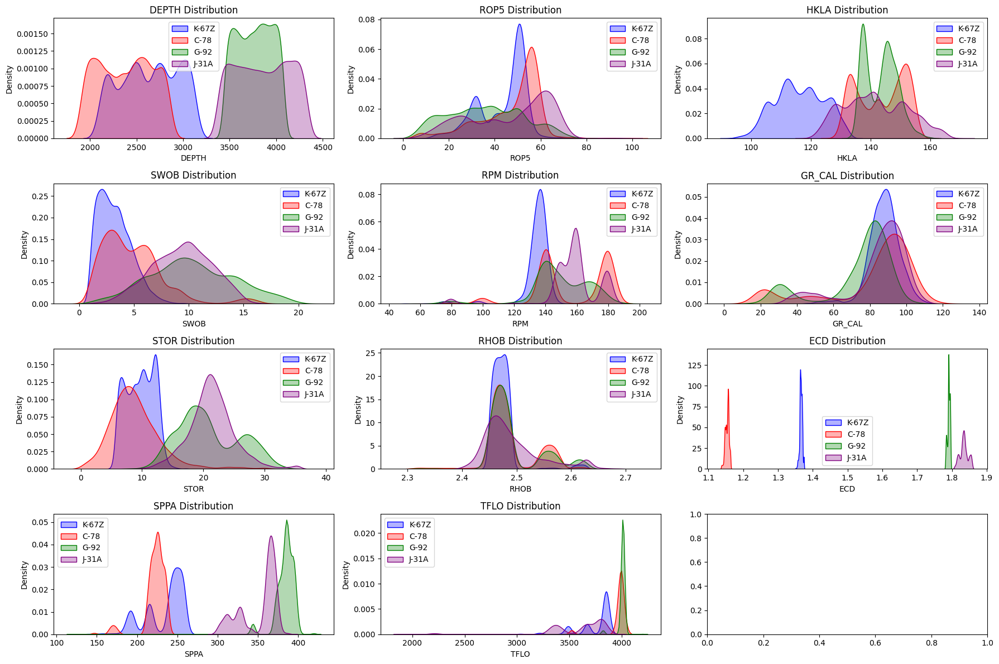

In [27]:
# Create subplots for feature distributions
fig, axes = plt.subplots(4, 3, figsize=(18, 12))
features = ['DEPTH', 'ROP5','HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'RHOB','ECD', 'SPPA', 'TFLO', ]

# Plot distributions for each feature
for idx, feature in enumerate(features):
    row = idx // 3
    col = idx % 3
    
    # Plot distribution for each well
    sns.kdeplot(data=df_K67Z[feature],
                ax=axes[row,col],
                color='blue',
                label='K-67Z',
                fill=True,
                alpha=0.3)
    
    sns.kdeplot(data=df_C78[feature],
                ax=axes[row,col], 
                color='red',
                label='C-78',
                fill=True,
                alpha=0.3)
    
    sns.kdeplot(data=df_G92[feature],
                ax=axes[row,col],
                color='green', 
                label='G-92',
                fill=True,
                alpha=0.3)
    
    sns.kdeplot(data=df_J31A[feature],
                ax=axes[row,col],
                color='purple',
                label='J-31A', 
                fill=True,
                alpha=0.3)
    
    axes[row,col].set_title(f'{feature} Distribution')
    axes[row,col].legend()

plt.tight_layout()
plt.show()

Density plots (Train-Test Split)

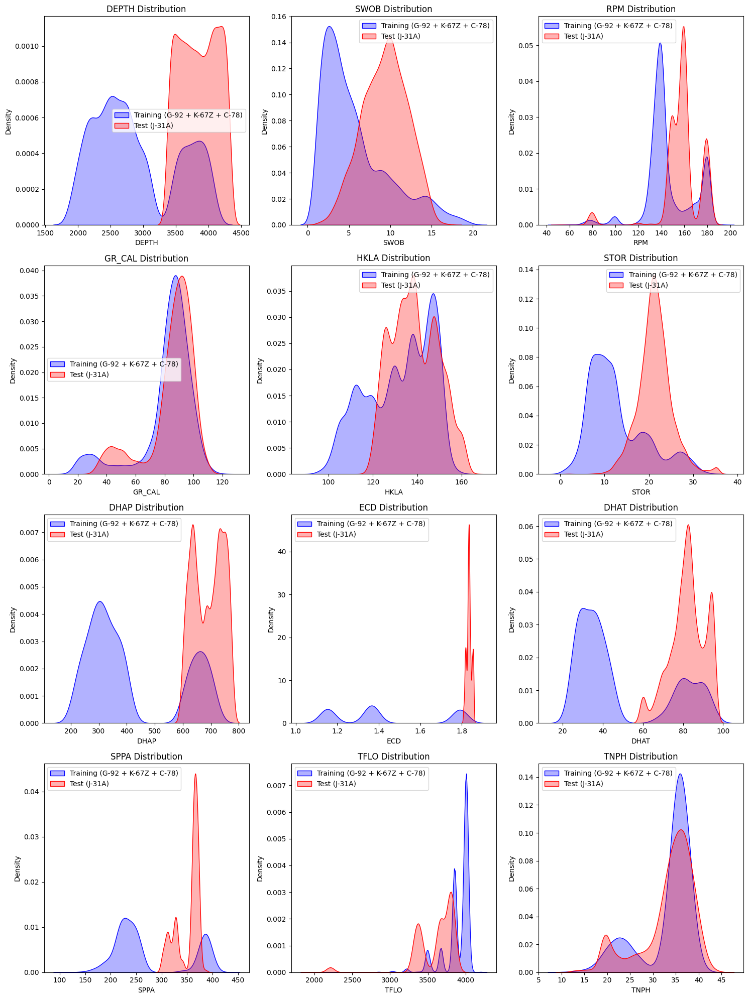

In [70]:
# Create subplots for feature distributions
fig, axes = plt.subplots(4, 3, figsize=(15, 20))
features = ['DEPTH', 'SWOB', 'RPM', 'GR_CAL', 'HKLA', 'STOR', 'DHAP', 'ECD', 'DHAT', 'SPPA', 'TFLO', 'TNPH'] 
# Combine training data (J-31A and K-67Z)
train_data = pd.concat([df_K67Z, df_C78, df_G92], axis=0)

# Plot distributions for each feature
for idx, feature in enumerate(features):
    row = idx // 3
    col = idx % 3
    
    # Plot training data distribution for numeric features
    sns.kdeplot(data=train_data[feature], 
                ax=axes[row,col], 
                color='blue', 
                label='Training (G-92 + K-67Z + C-78)',
                fill=True, 
                alpha=0.3)
    
    # Plot test data distribution for numeric features
    sns.kdeplot(data=df_J31A[feature], 
                ax=axes[row,col], 
                color='red', 
                label='Test (J-31A)',
                fill=True, 
                alpha=0.3)
    
    axes[row,col].set_title(f'{feature} Distribution')
    axes[row,col].legend()

plt.tight_layout()
plt.show()


### FEATURE ENGINEERING
Feature engineering is the process of creating, transforming, or selecting input variables to improve a machine learning model's performance. It involves crafting meaningful features from raw data using domain knowledge, encoding, scaling, and combining variables to better capture underlying patterns.

In [ ]:
# Sort data by depth
df = df.sort_values('DEPTH')

# Define features and target
features = ['DEPTH', 'SWOB', 'RPM', 'GR_CAL','STOR']
target = 'ROP5'

# Initialize lists to store metrics
train_r2_scores = []
test_r2_scores = []
predictions_by_fold = []

# Set up depth-based cross validation
n_splits = 5
window_size = int(len(df) * 0.2)
step_size = int((len(df) - window_size) / (n_splits - 1))

# Perform depth-based cross validation
for i in range(n_splits):
    split_index = window_size + i * step_size
    
    # Split data
    X_train = df.iloc[:split_index][features].values
    y_train = df.iloc[:split_index][target].values
    
    # Ensure test set is not empty
    if split_index >= len(df):
        break
        
    X_test = df.iloc[split_index:][features].values  
    y_test = df.iloc[split_index:][target].values

    # Skip if either set is empty
    if len(X_train) == 0 or len(X_test) == 0:
        continue
    
    # Create and train quantile regression models
    quantiles = [0.1, 0.5, 0.9]
    models = {}
    predictions = {}
    
    for q in quantiles:
        model = GradientBoostingRegressor(
            loss='quantile',
            alpha=q,
            random_state=42,
            n_estimators=500,
            learning_rate=0.1,
            max_depth=5,
            validation_fraction=0.2,
            n_iter_no_change=10,
            tol=0.001,
            subsample=0.8
        )
        model.fit(X_train, y_train)
        models[q] = model
        predictions[q] = model.predict(X_test)
    
    # Calculate R2 scores
    train_r2 = r2_score(y_train, models[0.5].predict(X_train))
    test_r2 = r2_score(y_test, predictions[0.5])
    
    train_r2_scores.append(train_r2)
    test_r2_scores.append(test_r2)
    predictions_by_fold.append(predictions)
    
    print(f"\nFold {i+1}:")
    print(f"Train R² (median): {train_r2:.2f}")
    print(f"Test R² (median): {test_r2:.2f}")
    print(f"10th percentile mean: {predictions[0.1].mean():.2f}")
    print(f"50th percentile mean: {predictions[0.5].mean():.2f}")
    print(f"90th percentile mean: {predictions[0.9].mean():.2f}")

if len(train_r2_scores) > 0:
    print("\nOverall Performance:")
    print(f"Mean Train R²: {np.mean(train_r2_scores):.2f} ± {np.std(train_r2_scores):.2f}")
    print(f"Mean Test R²: {np.mean(test_r2_scores):.2f} ± {np.std(test_r2_scores):.2f}")

    # Plot features vs depth with all splits
    plt.figure(figsize=(15,10))
    for i, col in enumerate(features):
        plt.subplot(4,2,i+1)
        plt.plot(df['DEPTH'], df[col])
        for j in range(n_splits):
            split_index = window_size + j * step_size
            if split_index < len(df):
                plt.axvline(df['DEPTH'].iloc[split_index], color='red', linestyle='--', alpha=0.3)
        plt.title(f'{col} over Depth')
        plt.xlabel('Depth')
        plt.ylabel(col)
        plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot predictions vs actual ROP for final split
    if len(predictions_by_fold) > 0:
        plt.figure(figsize=(15,8))
        final_split = window_size + (len(predictions_by_fold)-1) * step_size
        plt.plot(df['DEPTH'].iloc[final_split:], df[target].iloc[final_split:], label='True ROP')
        plt.plot(df['DEPTH'].iloc[final_split:], predictions_by_fold[-1][0.5], label='Predicted ROP')
        plt.fill_between(df['DEPTH'].iloc[final_split:],
                        predictions_by_fold[-1][0.1],
                        predictions_by_fold[-1][0.9],
                        alpha=0.2,
                        label='80% Prediction Interval')
        plt.xlabel('Depth')
        plt.ylabel('ROP')
        plt.title('ROP Prediction vs Depth (Final Split)')
        plt.legend()
        plt.grid(True)
        plt.show()

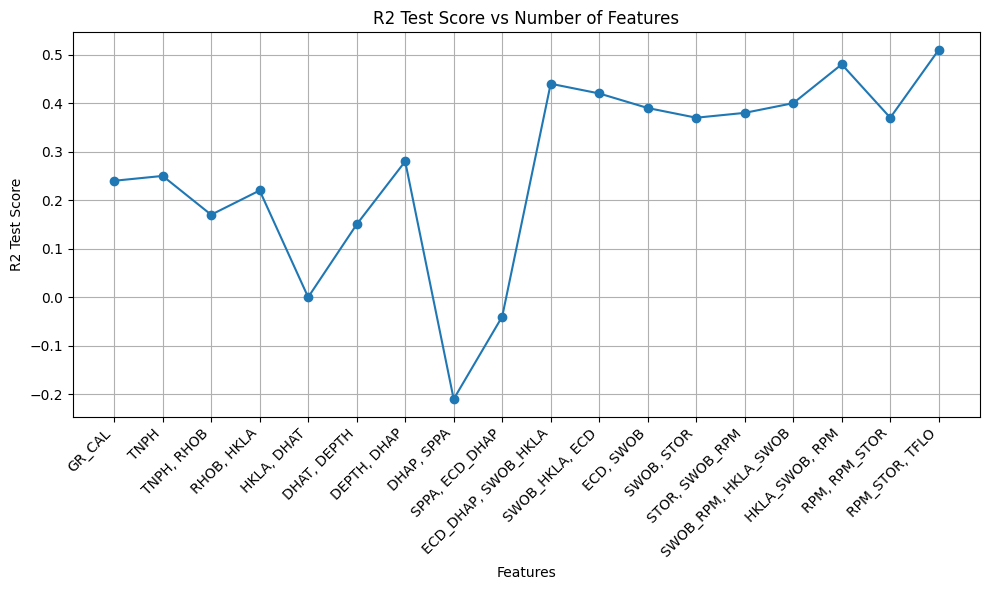

In [18]:
features = [
    ['GR_CAL'],
    ['TNPH'],
    ['TNPH', 'RHOB'],
    ['RHOB', 'HKLA'],
    ['HKLA', 'DHAT'],
    ['DHAT', 'DEPTH'],
    ['DEPTH', 'DHAP'],
    ['DHAP', 'SPPA'],
    ['SPPA', 'ECD_DHAP'],
    ['ECD_DHAP', 'SWOB_HKLA'],
    ['SWOB_HKLA', 'ECD'],
    ['ECD', 'SWOB'],
    ['SWOB', 'STOR'],
    ['STOR', 'SWOB_RPM'],
    ['SWOB_RPM', 'HKLA_SWOB'],
    ['HKLA_SWOB', 'RPM'],
    ['RPM', 'RPM_STOR'],
    ['RPM_STOR', 'TFLO']
]
r2_test = [0.24, 0.25, 0.17, 0.22, -0.00, 0.15, 0.28, -0.21, -0.04, 0.44, 0.42, 0.39, 0.37, 0.38, 0.40, 0.48, 0.37, 0.51]

# Plot
plt.figure(figsize=(10, 6))
plt.plot(range(len(features)), r2_test, marker='o')
plt.xticks(range(len(features)), [', '.join(f) for f in features], rotation=45, ha='right')
plt.xlabel('Features')
plt.ylabel('R2 Test Score')
plt.title('R2 Test Score vs Number of Features')
plt.grid(True)
plt.tight_layout()
plt.show()

#### Training on C-78, Testing on K-67Z & ViceVersa: Train R² (median): 0.58 & Test R² (median): -0.14


Training on C-78, Testing on K-67Z:
Train R² (tuned model): 0.58
Test R² (tuned model): -0.14

Training on K-67Z, Testing on C-78:
Train R² (tuned model): 0.70
Test R² (tuned model): -1.19


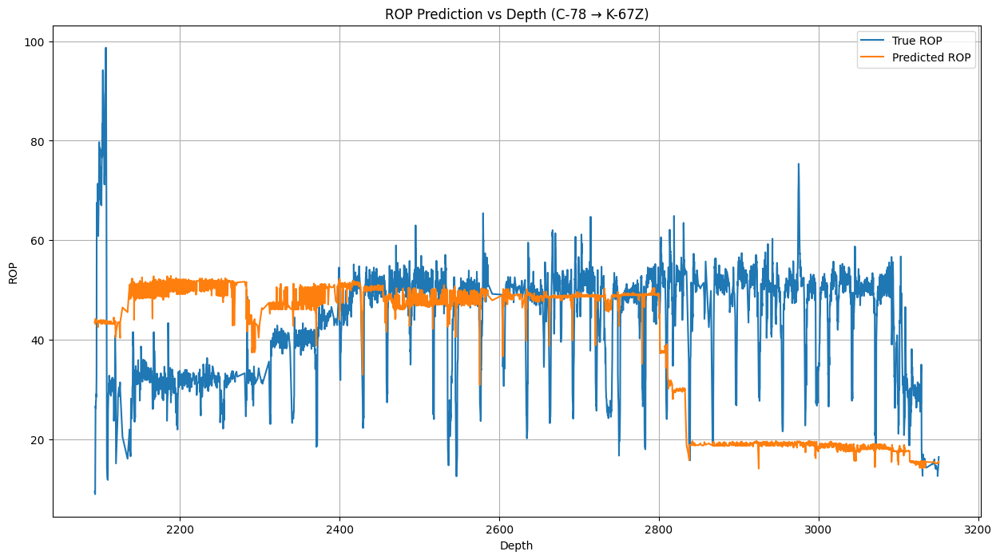

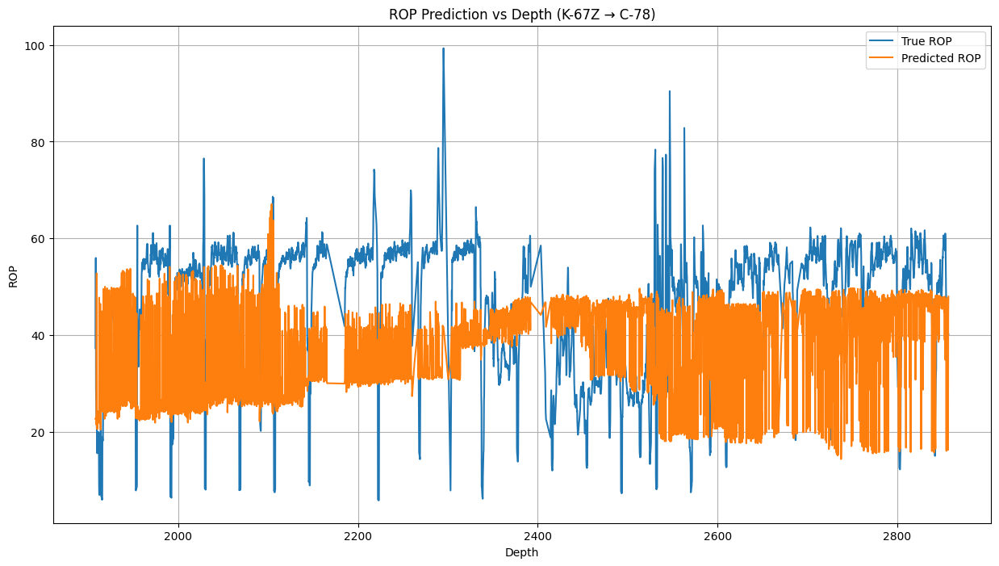

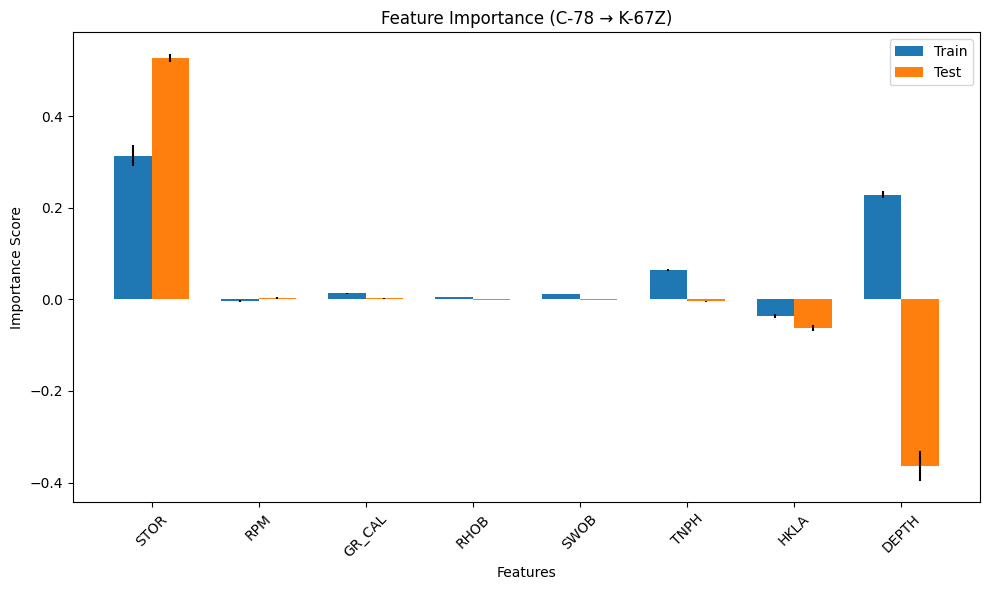

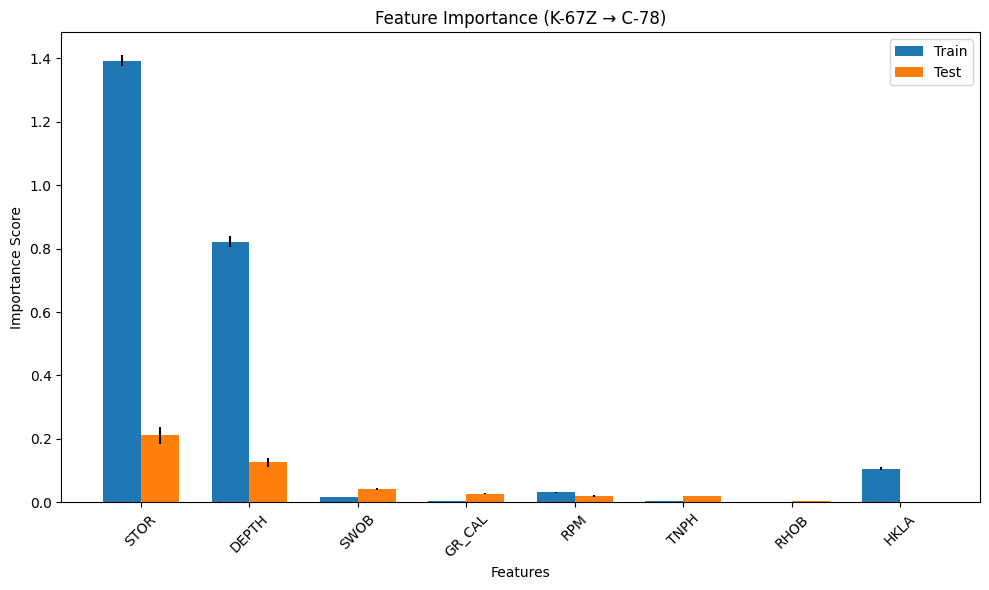

In [87]:
# Sort data by depth for all wells
df_K67Z = df_K67Z.sort_values('DEPTH')
df_C78 = df_C78.sort_values('DEPTH')

# Define initial features and target
features = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR',  'DEPTH', 'TNPH', 'RHOB']
target = 'ROP5'

# First case: Train on C78, test on K67Z
X_train_1 = df_C78[features]
y_train_1 = df_C78[target]
X_test_1 = df_K67Z[features]
y_test_1 = df_K67Z[target]

# Second case: Train on K67Z, test on C78
X_train_2 = df_K67Z[features]
y_train_2 = df_K67Z[target]
X_test_2 = df_C78[features]
y_test_2 = df_C78[target]

# Standardize numerical features for both cases
scaler_1 = StandardScaler()
X_train_processed_1 = scaler_1.fit_transform(X_train_1)
X_test_processed_1 = scaler_1.transform(X_test_1)

scaler_2 = StandardScaler()
X_train_processed_2 = scaler_2.fit_transform(X_train_2)
X_test_processed_2 = scaler_2.transform(X_test_2)

# Initialize model with best parameters found
best_gbr = GradientBoostingRegressor(
    learning_rate=0.017,
    max_depth=4,
    min_samples_leaf=19,
    n_estimators=204,
    subsample=0.8,
    random_state=42
)

# Case 1: Train on C78, test on K67Z
best_gbr.fit(X_train_processed_1, y_train_1)
train_r2_1 = best_gbr.score(X_train_processed_1, y_train_1)
test_r2_1 = best_gbr.score(X_test_processed_1, y_test_1)

print("\nTraining on C-78, Testing on K-67Z:")
print(f"Train R² (tuned model): {train_r2_1:.2f}")
print(f"Test R² (tuned model): {test_r2_1:.2f}")

# Case 2: Train on K67Z, test on C78
best_gbr.fit(X_train_processed_2, y_train_2)
train_r2_2 = best_gbr.score(X_train_processed_2, y_train_2)
test_r2_2 = best_gbr.score(X_test_processed_2, y_test_2)

print("\nTraining on K-67Z, Testing on C-78:")
print(f"Train R² (tuned model): {train_r2_2:.2f}")
print(f"Test R² (tuned model): {test_r2_2:.2f}")

# Permutation Feature Importance Analysis for both cases
from sklearn.inspection import permutation_importance

# Case 1: C78 -> K67Z
r_train_1 = permutation_importance(best_gbr, X_train_processed_1, y_train_1,
                               n_repeats=10, random_state=42)
r_test_1 = permutation_importance(best_gbr, X_test_processed_1, y_test_1,
                              n_repeats=10, random_state=42)

# Case 2: K67Z -> C78
r_train_2 = permutation_importance(best_gbr, X_train_processed_2, y_train_2,
                               n_repeats=10, random_state=42)
r_test_2 = permutation_importance(best_gbr, X_test_processed_2, y_test_2,
                              n_repeats=10, random_state=42)

# Create feature importance dictionaries for both cases
feature_importance_1 = {}
feature_importance_2 = {}
for idx, feature in enumerate(features):
    feature_importance_1[feature] = {
        'train_importance': r_train_1.importances_mean[idx],
        'train_std': r_train_1.importances_std[idx],
        'test_importance': r_test_1.importances_mean[idx],
        'test_std': r_test_1.importances_std[idx]
    }
    feature_importance_2[feature] = {
        'train_importance': r_train_2.importances_mean[idx],
        'train_std': r_train_2.importances_std[idx],
        'test_importance': r_test_2.importances_mean[idx],
        'test_std': r_test_2.importances_std[idx]
    }

# Sort features by test importance for both cases
sorted_features_1 = sorted(feature_importance_1.items(),
                       key=lambda x: x[1]['test_importance'],
                       reverse=True)
sorted_features_2 = sorted(feature_importance_2.items(),
                       key=lambda x: x[1]['test_importance'],
                       reverse=True)

# Get predictions for plotting both cases
y_pred_1 = best_gbr.predict(X_test_processed_1)
y_pred_2 = best_gbr.predict(X_test_processed_2)

# Plot predictions vs actual ROP for both cases
plt.figure(figsize=(15,8))
plt.plot(df_K67Z['DEPTH'], df_K67Z[target], label='True ROP')
plt.plot(df_K67Z['DEPTH'], y_pred_1, label='Predicted ROP')
plt.xlabel('Depth')
plt.ylabel('ROP')
plt.title('ROP Prediction vs Depth (C-78 → K-67Z)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(15,8))
plt.plot(df_C78['DEPTH'], df_C78[target], label='True ROP')
plt.plot(df_C78['DEPTH'], y_pred_2, label='Predicted ROP')
plt.xlabel('Depth')
plt.ylabel('ROP')
plt.title('ROP Prediction vs Depth (K-67Z → C-78)')
plt.legend()
plt.grid(True)
plt.show()

# Plot feature importances for both cases
plt.figure(figsize=(10,6))
x = np.arange(len(features))
width = 0.35

plt.bar(x - width/2, [scores['train_importance'] for _, scores in sorted_features_1],
        width, label='Train', yerr=[scores['train_std'] for _, scores in sorted_features_1])
plt.bar(x + width/2, [scores['test_importance'] for _, scores in sorted_features_1],
        width, label='Test', yerr=[scores['test_std'] for _, scores in sorted_features_1])

plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importance (C-78 → K-67Z)')
plt.xticks(x, [f[0] for f in sorted_features_1], rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
x = np.arange(len(features))
width = 0.35

plt.bar(x - width/2, [scores['train_importance'] for _, scores in sorted_features_2],
        width, label='Train', yerr=[scores['train_std'] for _, scores in sorted_features_2])
plt.bar(x + width/2, [scores['test_importance'] for _, scores in sorted_features_2],
        width, label='Test', yerr=[scores['test_std'] for _, scores in sorted_features_2])

plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importance (K-67Z → C-78)')
plt.xticks(x, [f[0] for f in sorted_features_2], rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

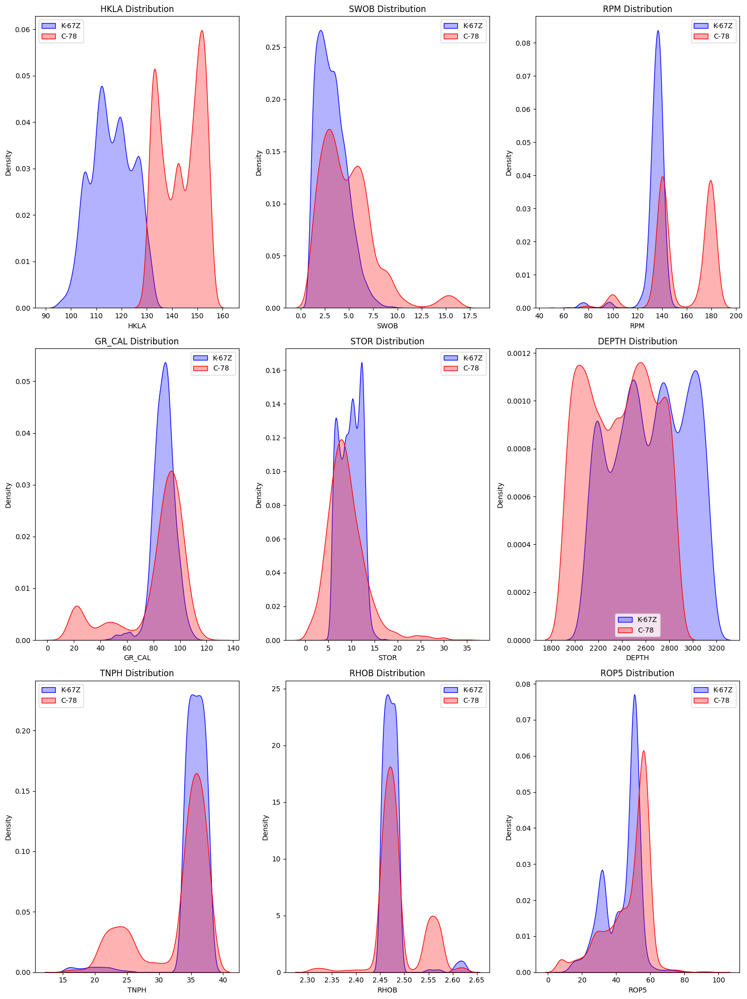

In [89]:
# Create subplots for feature distributions
fig, axes = plt.subplots(3, 3, figsize=(15, 20))
features = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR',  'DEPTH', 'TNPH', 'RHOB', 'ROP5']

# Plot distributions for each feature
for idx, feature in enumerate(features):
    row = idx // 3
    col = idx % 3
    
    # Plot distribution for each well
    sns.kdeplot(data=df_K67Z[feature],
                ax=axes[row,col],
                color='blue',
                label='K-67Z',
                fill=True,
                alpha=0.3)
    
    sns.kdeplot(data=df_C78[feature],
                ax=axes[row,col], 
                color='red',
                label='C-78',
                fill=True,
                alpha=0.3)
    
    axes[row,col].set_title(f'{feature} Distribution')
    axes[row,col].legend()

plt.tight_layout()
plt.show()

#### Training on G-92, Testing on J-31A: Train R² (median): 0.99 & Test R² (median): 0.23


Training on G-92, Testing on J-31A:
Train R²: 1.00
Test R²: -0.84

Training on J-31A, Testing on G-92:
Train R²: 0.99
Test R²: 0.23


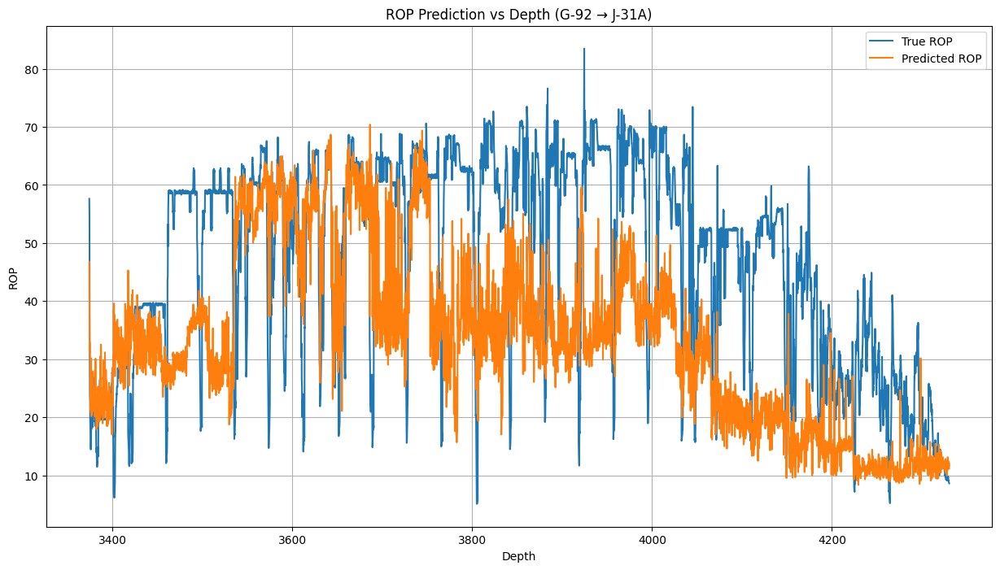

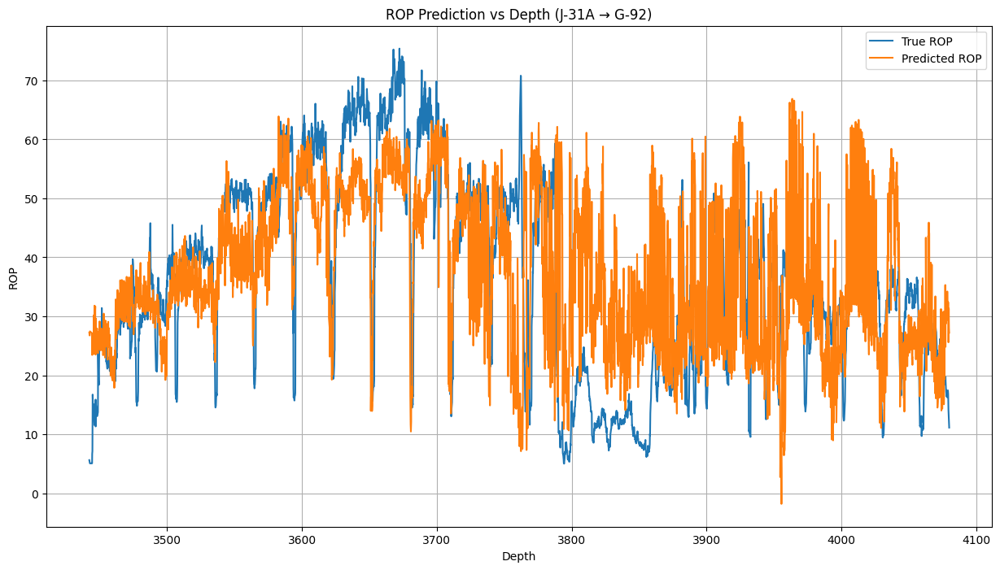

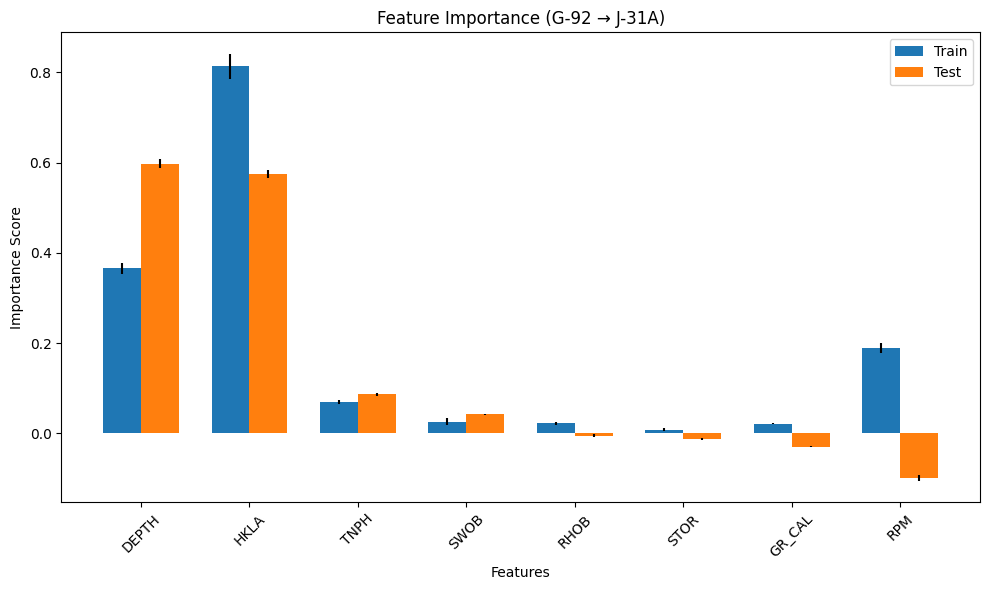

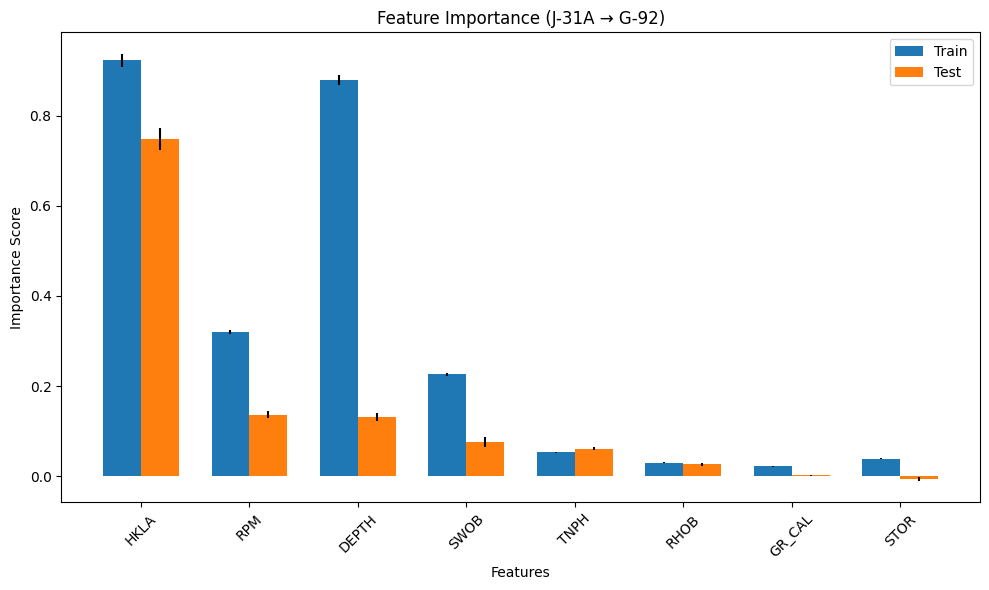

In [90]:
# Sort data by depth for all wells
df_G92 = df_G92.sort_values('DEPTH')
df_J31A = df_J31A.sort_values('DEPTH')

# Define initial features and target
features = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR',  'DEPTH', 'TNPH', 'RHOB']
target = 'ROP5'

# First case: Train on G92, test on J31A
X_train_1 = df_G92[features]
y_train_1 = df_G92[target]
X_test_1 = df_J31A[features]
y_test_1 = df_J31A[target]

# Second case: Train on J31A, test on G92
X_train_2 = df_J31A[features]
y_train_2 = df_J31A[target]
X_test_2 = df_G92[features]
y_test_2 = df_G92[target]

# Standardize numerical features for both cases
scaler_1 = StandardScaler()
X_train_processed_1 = scaler_1.fit_transform(X_train_1)
X_test_processed_1 = scaler_1.transform(X_test_1)

scaler_2 = StandardScaler()
X_train_processed_2 = scaler_2.fit_transform(X_train_2)
X_test_processed_2 = scaler_2.transform(X_test_2)

# Initialize model with best parameters found
best_gbr = GradientBoostingRegressor(
    learning_rate=0.1,
    max_depth=7,
    min_samples_leaf=19,
    n_estimators=500,
    subsample=0.8,
    random_state=42
)

# Case 1: Train on G92, test on J31A
best_gbr.fit(X_train_processed_1, y_train_1)
train_r2_1 = best_gbr.score(X_train_processed_1, y_train_1)
test_r2_1 = best_gbr.score(X_test_processed_1, y_test_1)

print("\nTraining on G-92, Testing on J-31A:")
print(f"Train R²: {train_r2_1:.2f}")
print(f"Test R²: {test_r2_1:.2f}")

# Case 2: Train on J31A, test on G92
best_gbr.fit(X_train_processed_2, y_train_2)
train_r2_2 = best_gbr.score(X_train_processed_2, y_train_2)
test_r2_2 = best_gbr.score(X_test_processed_2, y_test_2)

print("\nTraining on J-31A, Testing on G-92:")
print(f"Train R²: {train_r2_2:.2f}")
print(f"Test R²: {test_r2_2:.2f}")

# Permutation Feature Importance Analysis for both cases
from sklearn.inspection import permutation_importance

# Case 1: G92 -> J31A
r_train_1 = permutation_importance(best_gbr, X_train_processed_1, y_train_1,
                               n_repeats=10, random_state=42)
r_test_1 = permutation_importance(best_gbr, X_test_processed_1, y_test_1,
                              n_repeats=10, random_state=42)

# Case 2: J31A -> G92
r_train_2 = permutation_importance(best_gbr, X_train_processed_2, y_train_2,
                               n_repeats=10, random_state=42)
r_test_2 = permutation_importance(best_gbr, X_test_processed_2, y_test_2,
                              n_repeats=10, random_state=42)

# Create feature importance dictionaries for both cases
feature_importance_1 = {}
feature_importance_2 = {}
for idx, feature in enumerate(features):
    feature_importance_1[feature] = {
        'train_importance': r_train_1.importances_mean[idx],
        'train_std': r_train_1.importances_std[idx],
        'test_importance': r_test_1.importances_mean[idx],
        'test_std': r_test_1.importances_std[idx]
    }
    feature_importance_2[feature] = {
        'train_importance': r_train_2.importances_mean[idx],
        'train_std': r_train_2.importances_std[idx],
        'test_importance': r_test_2.importances_mean[idx],
        'test_std': r_test_2.importances_std[idx]
    }

# Sort features by test importance for both cases
sorted_features_1 = sorted(feature_importance_1.items(),
                       key=lambda x: x[1]['test_importance'],
                       reverse=True)
sorted_features_2 = sorted(feature_importance_2.items(),
                       key=lambda x: x[1]['test_importance'],
                       reverse=True)

# Get predictions for plotting both cases
y_pred_1 = best_gbr.predict(X_test_processed_1)
y_pred_2 = best_gbr.predict(X_test_processed_2)

# Plot predictions vs actual ROP for both cases
plt.figure(figsize=(15,8))
plt.plot(df_J31A['DEPTH'], df_J31A[target], label='True ROP')
plt.plot(df_J31A['DEPTH'], y_pred_1, label='Predicted ROP')
plt.xlabel('Depth')
plt.ylabel('ROP')
plt.title('ROP Prediction vs Depth (G-92 → J-31A)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(15,8))
plt.plot(df_G92['DEPTH'], df_G92[target], label='True ROP')
plt.plot(df_G92['DEPTH'], y_pred_2, label='Predicted ROP')
plt.xlabel('Depth')
plt.ylabel('ROP')
plt.title('ROP Prediction vs Depth (J-31A → G-92)')
plt.legend()
plt.grid(True)
plt.show()

# Plot feature importances for both cases
plt.figure(figsize=(10,6))
x = np.arange(len(features))
width = 0.35

plt.bar(x - width/2, [scores['train_importance'] for _, scores in sorted_features_1],
        width, label='Train', yerr=[scores['train_std'] for _, scores in sorted_features_1])
plt.bar(x + width/2, [scores['test_importance'] for _, scores in sorted_features_1],
        width, label='Test', yerr=[scores['test_std'] for _, scores in sorted_features_1])

plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importance (G-92 → J-31A)')
plt.xticks(x, [f[0] for f in sorted_features_1], rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
x = np.arange(len(features))
width = 0.35

plt.bar(x - width/2, [scores['train_importance'] for _, scores in sorted_features_2],
        width, label='Train', yerr=[scores['train_std'] for _, scores in sorted_features_2])
plt.bar(x + width/2, [scores['test_importance'] for _, scores in sorted_features_2],
        width, label='Test', yerr=[scores['test_std'] for _, scores in sorted_features_2])

plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importance (J-31A → G-92)')
plt.xticks(x, [f[0] for f in sorted_features_2], rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

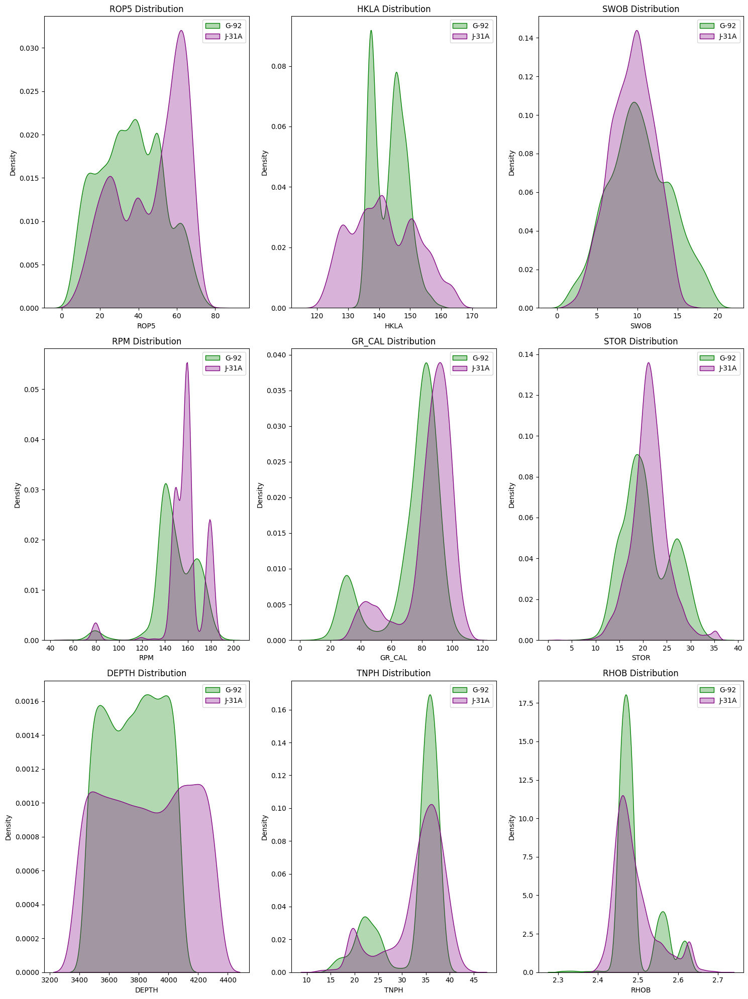

In [92]:
# Create subplots for feature distributions
fig, axes = plt.subplots(3, 3, figsize=(15, 20))
features = ['ROP5', 'HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR',  'DEPTH', 'TNPH', 'RHOB']

# Plot distributions for each feature
for idx, feature in enumerate(features):
    row = idx // 3
    col = idx % 3
    
    # Plot distribution for each well
    sns.kdeplot(data=df_G92[feature],
                ax=axes[row,col],
                color='green', 
                label='G-92',
                fill=True,
                alpha=0.3)
    
    sns.kdeplot(data=df_J31A[feature],
                ax=axes[row,col],
                color='purple',
                label='J-31A', 
                fill=True,
                alpha=0.3)
    
    axes[row,col].set_title(f'{feature} Distribution')
    axes[row,col].legend()

plt.tight_layout()
plt.show()

Leave-out-Well

Length of X: 19039
Length of y: 19039
Length of groups: 19039

Fold 1 (Testing on J31A):
Train R² (median): 0.69
Test R² (median): 0.37

Fold 2 (Testing on K67Z):
Train R² (median): 0.74
Test R² (median): -0.81

Fold 3 (Testing on C78):
Train R² (median): 0.78
Test R² (median): -2.01

Fold 4 (Testing on G92):
Train R² (median): 0.63
Test R² (median): 0.21

Overall Leave-One-Well-Out CV Results:
Average Train R²: 0.71 ± 0.05
Average Test R²: -0.56 ± 0.95


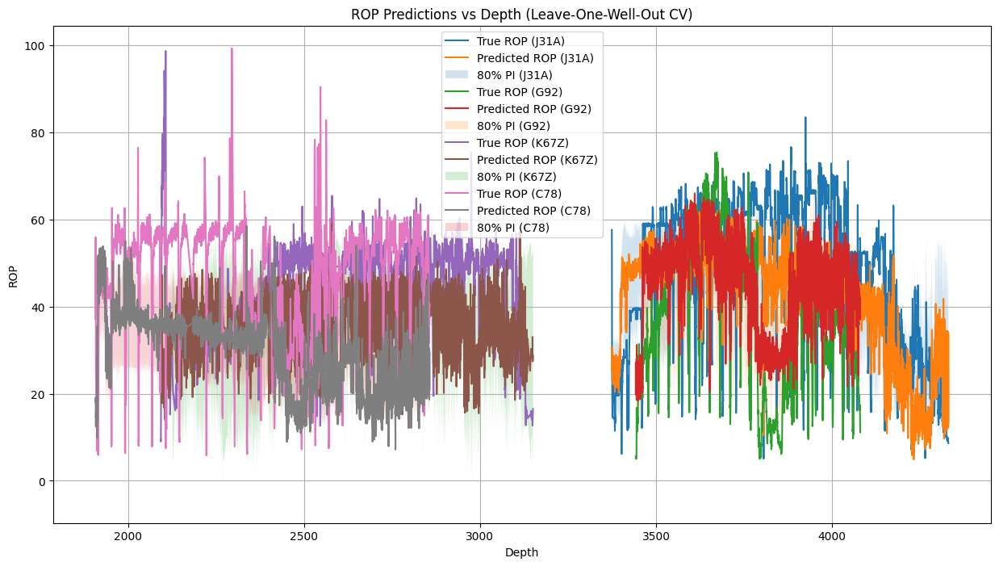

<Figure size 1000x600 with 0 Axes>

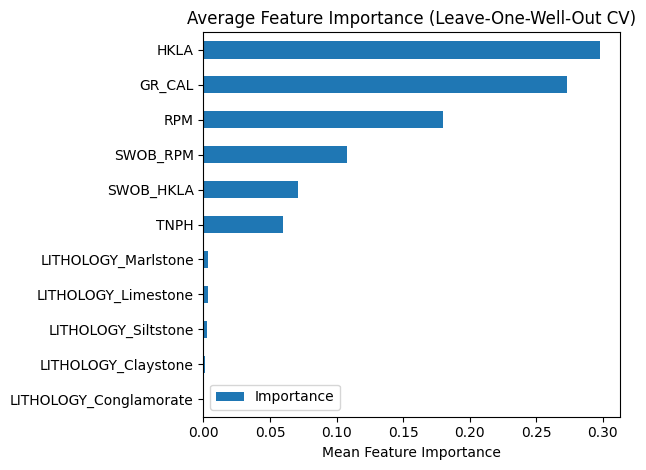

In [72]:
# Sort data by depth for all wells
df_J31A = df_J31A.sort_values('DEPTH')
df_G92 = df_G92.sort_values('DEPTH')
df_K67Z = df_K67Z.sort_values('DEPTH')
df_C78 = df_C78.sort_values('DEPTH')

# Concatenate data from all wells
df_all = pd.concat([df_J31A, df_G92, df_K67Z, df_C78], ignore_index=True)

# Define features and target
features = ['HKLA', 'RPM', 'GR_CAL', 'SWOB_RPM', 'SWOB_HKLA', 'TNPH', 'LITHOLOGY']
target = 'ROP5'
X = df_all[features]
y = df_all[target]

# Define groups
if 'well' in df_all.columns:
    groups = df_all['well']
else:
    groups = pd.Series(np.concatenate([
        np.full(len(df_J31A), 'J31A'),
        np.full(len(df_G92), 'G92'),
        np.full(len(df_K67Z), 'K67Z'),
        np.full(len(df_C78), 'C78')
    ]))

# Verify lengths
print(f"Length of X: {len(X)}")
print(f"Length of y: {len(y)}")
print(f"Length of groups: {len(groups)}")

# Initialize GroupKFold for Leave-One-Well-Out CV
n_wells = 4  # Updated for 4 wells
group_kfold = GroupKFold(n_splits=n_wells)

# Initialize lists to store metrics and predictions
train_r2_scores = []
test_r2_scores = []
all_predictions = {}
feature_importances = []

# Perform Leave-One-Well-Out CV
for fold, (train_idx, test_idx) in enumerate(group_kfold.split(X, y, groups)):
    X_train = X.iloc[train_idx]
    y_train = y.iloc[train_idx]
    X_test = X.iloc[test_idx]
    y_test = y.iloc[test_idx]
    test_well = groups[test_idx[0]]  # Get first well name from test indices
    
    # Convert lithology to numeric using one-hot encoding
    X_train_encoded = pd.get_dummies(X_train, columns=['LITHOLOGY'])
    X_test_encoded = pd.get_dummies(X_test, columns=['LITHOLOGY'])
    
    # Ensure test has same columns as train
    for col in X_train_encoded.columns:
        if col not in X_test_encoded.columns:
            X_test_encoded[col] = 0
    X_test_encoded = X_test_encoded[X_train_encoded.columns]
    
    # Standardize numerical features
    numeric_features = [f for f in X_train_encoded.columns if not f.startswith('LITHOLOGY')]
    scaler = StandardScaler()
    X_train_encoded[numeric_features] = scaler.fit_transform(X_train_encoded[numeric_features])
    X_test_encoded[numeric_features] = scaler.transform(X_test_encoded[numeric_features])
    
    # Train quantile regression models
    quantiles = [0.1, 0.5, 0.9]
    fold_predictions = {}
    
    for q in quantiles:
        model = GradientBoostingRegressor(
            loss='quantile',
            alpha=q,
            random_state=42,
            n_estimators=500,
            learning_rate=0.1,
            max_depth=7,
            validation_fraction=0.2,
            n_iter_no_change=10,
            tol=0.001,
            subsample=0.8
        )
        model.fit(X_train_encoded, y_train)
        
        # Make predictions for current quantile
        test_pred = model.predict(X_test_encoded)
        fold_predictions[q] = test_pred
        
        if q == 0.5:  # Store median model metrics
            train_pred = model.predict(X_train_encoded)
            train_r2 = r2_score(y_train, train_pred)
            test_r2 = r2_score(y_test, test_pred)
            train_r2_scores.append(train_r2)
            test_r2_scores.append(test_r2)
            
            # Store feature importance for median model
            feature_importances.append(
                pd.Series(model.feature_importances_, index=X_train_encoded.columns)
            )
    
    all_predictions[test_well] = fold_predictions
    print(f"\nFold {fold+1} (Testing on {test_well}):")
    print(f"Train R² (median): {train_r2:.2f}")
    print(f"Test R² (median): {test_r2:.2f}")

# Print average metrics
print("\nOverall Leave-One-Well-Out CV Results:")
print(f"Average Train R²: {np.mean(train_r2_scores):.2f} ± {np.std(train_r2_scores):.2f}")
print(f"Average Test R²: {np.mean(test_r2_scores):.2f} ± {np.std(test_r2_scores):.2f}")

# Plot predictions for each well
plt.figure(figsize=(15, 8))
for well in ['J31A', 'G92', 'K67Z', 'C78']:
    well_data = df_all[df_all.index.isin(np.where(groups == well)[0])]
    plt.plot(well_data['DEPTH'], well_data[target], label=f'True ROP ({well})')
    plt.plot(well_data['DEPTH'], all_predictions[well][0.5], label=f'Predicted ROP ({well})')
    plt.fill_between(well_data['DEPTH'],
                     all_predictions[well][0.1],
                     all_predictions[well][0.9],
                     alpha=0.2,
                     label=f'80% PI ({well})')

plt.xlabel('Depth')
plt.ylabel('ROP')
plt.title('ROP Predictions vs Depth (Leave-One-Well-Out CV)')
plt.legend()
plt.grid(True)
plt.show()

# Plot average feature importances
plt.figure(figsize=(10, 6))
mean_importances = pd.concat(feature_importances, axis=1).mean(axis=1)
importances = pd.DataFrame(mean_importances, columns=['Importance']).sort_values('Importance', ascending=True)

importances.plot(kind='barh')
plt.title('Average Feature Importance (Leave-One-Well-Out CV)')
plt.xlabel('Mean Feature Importance')
plt.tight_layout()
plt.show()

### XGBoost
features = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'DEPTH', 'SPPA', 'TFLO', 'ECD', 'TNPH', 'RHOB'] 

/Users/cristianlopez/Documents/MUN/Capstone/910B/Cursor/xgb_env/lib/python3.13/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


Model trained successfully!

ROP5 Model R² scores:
Training: 0.94
Testing: 0.81

ROP5 Model MSE scores:
Training: 14.97
Testing: 45.37


/Users/cristianlopez/Documents/MUN/Capstone/910B/Cursor/xgb_env/lib/python3.13/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


MSE Model trained successfully!

MSE Model R² scores:
Training: 0.94
Testing: 0.85


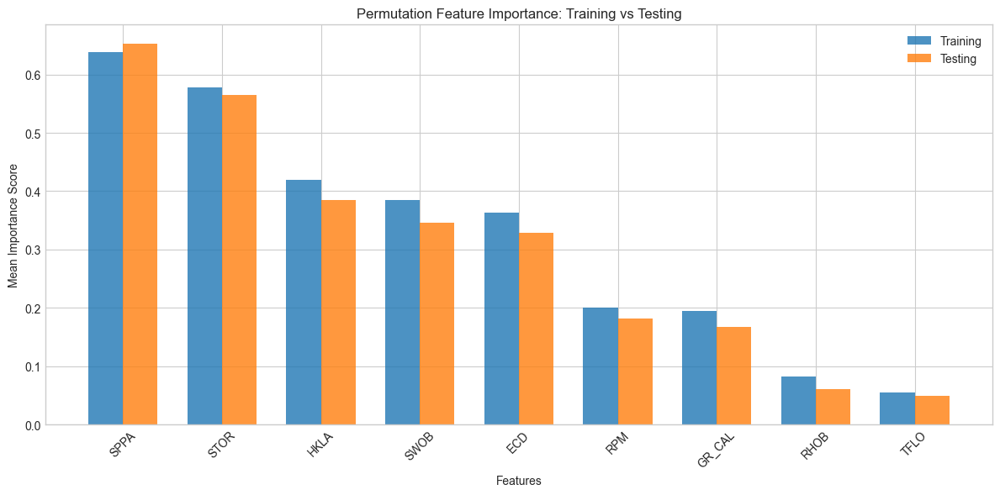

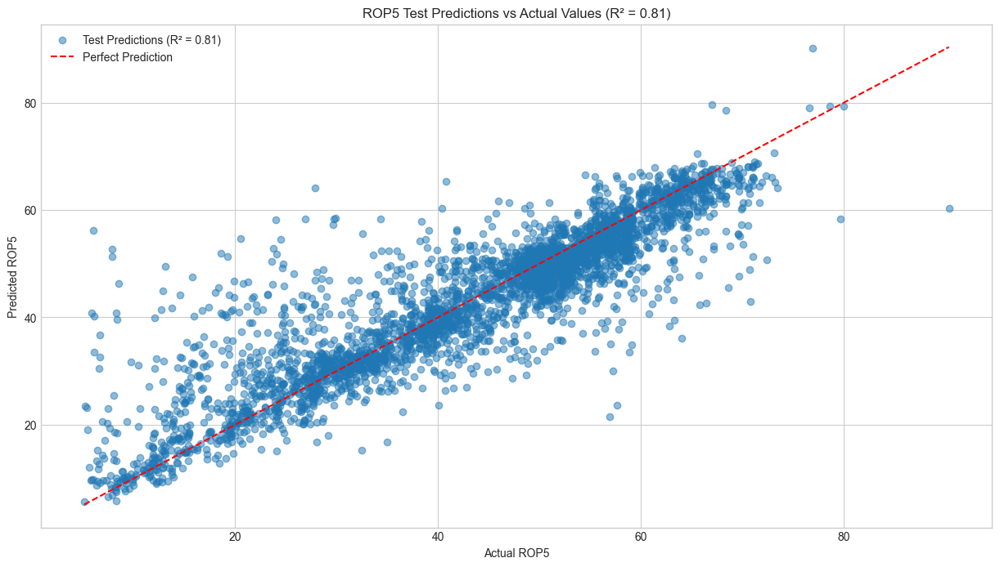

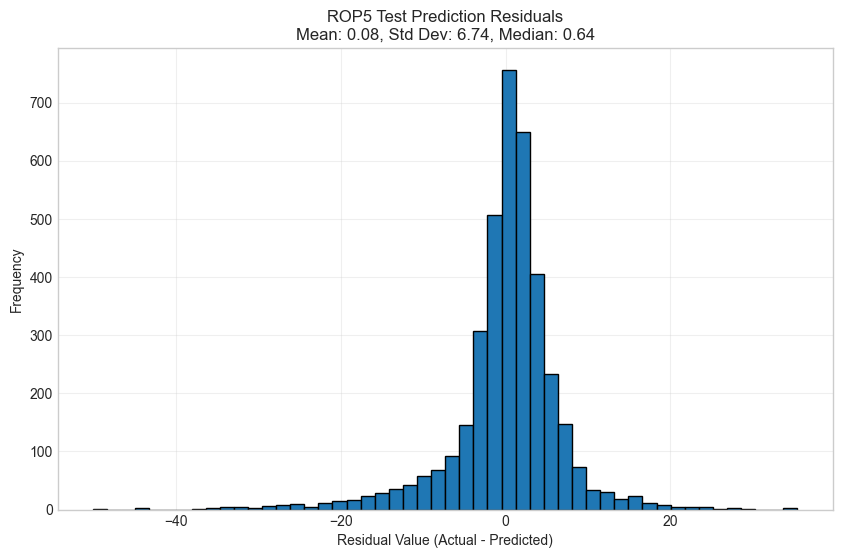


ROP5 Test Residual Statistics:
Mean: 0.08
Std Dev: 6.74
Median: 0.64


In [77]:
# Sort data by depth for all wells
df_J31A = df_J31A.sort_values('DEPTH')
df_G92 = df_G92.sort_values('DEPTH')
df_K67Z = df_K67Z.sort_values('DEPTH')
df_C78 = df_C78.sort_values('DEPTH')

# Define features and targets
features = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB'] 
target = 'ROP5'

# Combine all wells into one dataset
X = pd.concat([df_J31A[features], df_G92[features], df_K67Z[features], df_C78[features]])
y_rop = pd.concat([df_J31A['ROP5'], df_G92['ROP5'], df_K67Z['ROP5'], df_C78['ROP5']])

# Split data into train and test sets
X_train, X_test, y_rop_train, y_rop_test = train_test_split(
    X, y_rop, test_size=0.2, random_state=42
)

# Scale numerical features
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Further split training data to create a validation set
X_train_sub, X_val, y_rop_train_sub, y_rop_val = train_test_split(
    X_train_processed, y_rop_train, test_size=0.2, random_state=42
)

# Create sample weights for the training subset
sample_weights_sub = np.ones(len(y_rop_train_sub))
high_rop_mask_sub = y_rop_train_sub > 60
sample_weights_sub[high_rop_mask_sub] = 1.5  # Apply 1.5x weight to high ROP samples

# Train ROP5 model with improved parameters
rop_model = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=7,
    reg_lambda=0.7,
    reg_alpha=0.1,
    subsample=0.9,
    colsample_bytree=0.7,
    random_state=42
)

# Fit the model with the validation set for early stopping
rop_model.fit(
    X_train_sub,
    y_rop_train_sub,
    sample_weight=sample_weights_sub,
    eval_set=[(X_val, y_rop_val)],
    early_stopping_rounds=25,
    verbose=False
)

print("Model trained successfully!")

# Get predictions for training and test sets
rop_train_pred = rop_model.predict(X_train_processed)
rop_test_pred = rop_model.predict(X_test_processed)

# Calculate R2 scores for training and test sets
rop_train_r2 = r2_score(y_rop_train, rop_train_pred)
rop_test_r2 = r2_score(y_rop_test, rop_test_pred)

# Calculate MSE scores for training and test sets
rop_train_mse = mean_squared_error(y_rop_train, rop_train_pred)
rop_test_mse = mean_squared_error(y_rop_test, rop_test_pred)

print("\nROP5 Model R² scores:")
print(f"Training: {rop_train_r2:.2f}")
print(f"Testing: {rop_test_r2:.2f}")

print("\nROP5 Model MSE scores:")
print(f"Training: {rop_train_mse:.2f}")
print(f"Testing: {rop_test_mse:.2f}")

# Get feature importance scores for training and testing
# Train separate models for test set to get unbiased feature importance
rop_model_test = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=7,
    reg_lambda=2.0,
    reg_alpha=0.5,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
rop_model_test.fit(X_test_processed, y_rop_test)

train_importance = rop_model.feature_importances_
test_importance = rop_model_test.feature_importances_

# Define MSE model with same hyperparameters as ROP model
mse_model = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.05, 
    max_depth=6,
    reg_lambda=0.566,
    reg_alpha=0.678,
    subsample=0.9,
    colsample_bytree=0.7,
    random_state=42
)

# Create MSE target variable
y_mse = pd.concat([df_J31A['MSE'], df_G92['MSE'], df_K67Z['MSE'], df_C78['MSE']])

# Split MSE data same way as ROP data
_, _, y_mse_train, y_mse_test = train_test_split(X, y_mse, test_size=0.2, random_state=42)

# Create MSE training subset similar to ROP subset
_, _, y_mse_train_sub, y_mse_val = train_test_split(
    y_mse_train, y_mse_train, test_size=0.2, random_state=42
)

# Fit MSE model with validation set for early stopping
mse_model.fit(
    X_train_sub,
    y_mse_train_sub,
    sample_weight=sample_weights_sub,
    eval_set=[(X_val, y_mse_val)],
    early_stopping_rounds=25,
    verbose=False
)

print("MSE Model trained successfully!")

# Get predictions for training and test sets
mse_train_pred = mse_model.predict(X_train_processed)
mse_test_pred = mse_model.predict(X_test_processed)

# Calculate R2 scores
mse_train_r2 = r2_score(y_mse_train, mse_train_pred)
mse_test_r2 = r2_score(y_mse_test, mse_test_pred)

print("\nMSE Model R² scores:")
print(f"Training: {mse_train_r2:.2f}")
print(f"Testing: {mse_test_r2:.2f}")


# Calculate permutation importance for training and test sets
from sklearn.inspection import permutation_importance

# Calculate permutation importance on training set
train_perm_importance = permutation_importance(rop_model, X_train_processed, y_rop_train, 
                                             n_repeats=10, random_state=42)
train_importance_mean = train_perm_importance.importances_mean

# Calculate permutation importance on test set  
test_perm_importance = permutation_importance(rop_model, X_test_processed, y_rop_test,
                                            n_repeats=10, random_state=42)
test_importance_mean = test_perm_importance.importances_mean

# Sort features by average importance
avg_importance = (train_importance_mean + test_importance_mean) / 2
sorted_indices = np.argsort(avg_importance)[::-1]

# Plot feature importance comparison
plt.figure(figsize=(12, 6))
x = np.arange(len(features))
width = 0.35

plt.bar(x - width/2, train_importance_mean[sorted_indices], width, label='Training', alpha=0.8)
plt.bar(x + width/2, test_importance_mean[sorted_indices], width, label='Testing', alpha=0.8)

plt.xticks(x, np.array(features)[sorted_indices], rotation=45)
plt.title('Permutation Feature Importance: Training vs Testing')
plt.xlabel('Features') 
plt.ylabel('Mean Importance Score')
plt.legend()
plt.tight_layout()
plt.show()

# Plot ROP5 predictions vs actual
plt.figure(figsize=(15, 8))
plt.scatter(y_rop_test, rop_test_pred, alpha=0.5, label=f'Test Predictions (R² = {rop_test_r2:.2f})')
plt.plot([min(y_rop_test), max(y_rop_test)], [min(y_rop_test), max(y_rop_test)], 'r--', label='Perfect Prediction')
plt.xlabel('Actual ROP5')
plt.ylabel('Predicted ROP5')
plt.title(f'ROP5 Test Predictions vs Actual Values (R² = {rop_test_r2:.2f})')
plt.legend()
plt.grid(True)
plt.show()

# Calculate residuals
rop_residuals = y_rop_test - rop_test_pred

# Plot ROP5 residuals histogram
plt.figure(figsize=(10, 6))
plt.hist(rop_residuals, bins=50, edgecolor='black')
plt.title('ROP5 Test Prediction Residuals\n' + 
         f'Mean: {np.mean(rop_residuals):.2f}, Std Dev: {np.std(rop_residuals):.2f}, Median: {np.median(rop_residuals):.2f}')
plt.xlabel('Residual Value (Actual - Predicted)')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)
plt.show()

# Print residual statistics
print("\nROP5 Test Residual Statistics:")
print(f"Mean: {np.mean(rop_residuals):.2f}")
print(f"Std Dev: {np.std(rop_residuals):.2f}")
print(f"Median: {np.median(rop_residuals):.2f}")

J31A & G92

/Users/cristianlopez/Documents/MUN/Capstone/910B/Cursor/xgb_env/lib/python3.13/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


Model trained successfully!

ROP5 Model R² scores:
Training: 0.98
Testing: 0.89


/Users/cristianlopez/Documents/MUN/Capstone/910B/Cursor/xgb_env/lib/python3.13/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


MSE Model trained successfully!

MSE Model R² scores:
Training: 0.95
Testing: 0.83


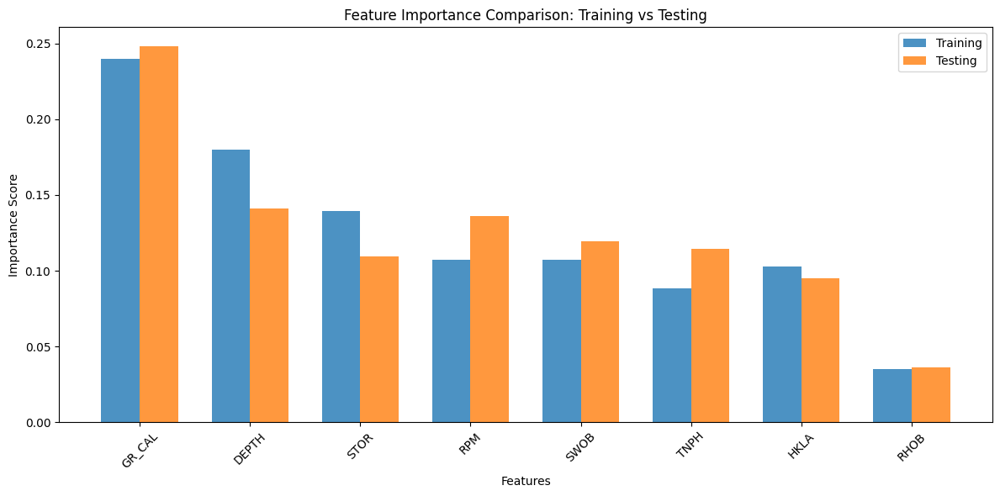

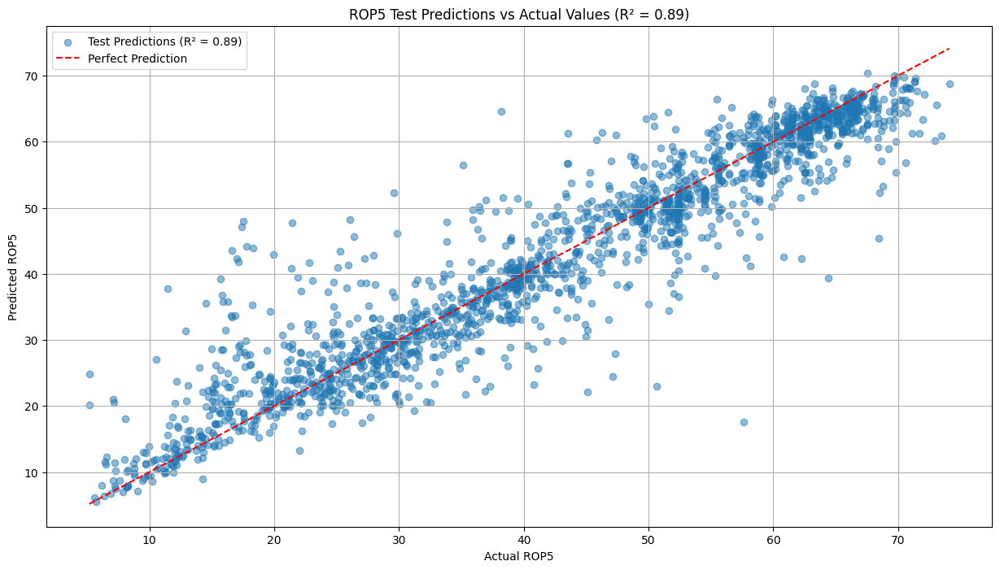

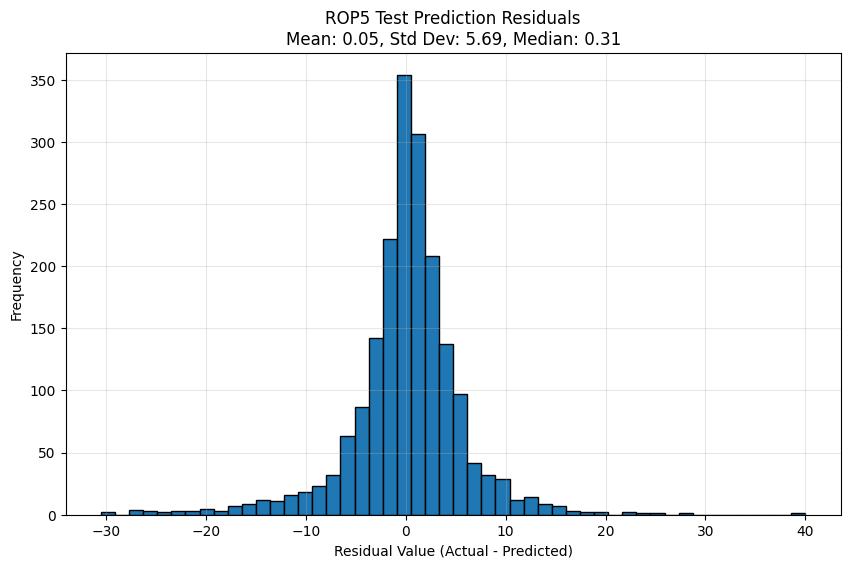


ROP5 Test Residual Statistics:
Mean: 0.05
Std Dev: 5.69
Median: 0.31


In [43]:
# Sort data by depth for wells G92 and J31A
df_J31A = df_J31A.sort_values('DEPTH')
df_G92 = df_G92.sort_values('DEPTH')

# Define features and targets
features = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'DEPTH', 'TNPH', 'RHOB'] 
target = 'ROP5'

# Combine G92 and J31A wells into one dataset
X = pd.concat([df_J31A[features], df_G92[features]])
y_rop = pd.concat([df_J31A['ROP5'], df_G92['ROP5']])

# Split data into train and test sets
X_train, X_test, y_rop_train, y_rop_test = train_test_split(
    X, y_rop, test_size=0.2, random_state=42
)

# Scale numerical features
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Further split training data to create a validation set
X_train_sub, X_val, y_rop_train_sub, y_rop_val = train_test_split(
    X_train_processed, y_rop_train, test_size=0.2, random_state=42
)

# Create sample weights for the training subset
sample_weights_sub = np.ones(len(y_rop_train_sub))
high_rop_mask_sub = y_rop_train_sub > 60
sample_weights_sub[high_rop_mask_sub] = 1.5  # Apply 1.5x weight to high ROP samples

# Train ROP5 model with improved parameters
rop_model = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=7,
    reg_lambda=0.7,
    reg_alpha=0.1,
    subsample=0.9,
    colsample_bytree=0.7,
    random_state=42
)

# Fit the model with the validation set for early stopping
rop_model.fit(
    X_train_sub,
    y_rop_train_sub,
    sample_weight=sample_weights_sub,
    eval_set=[(X_val, y_rop_val)],
    early_stopping_rounds=25,
    verbose=False
)

print("Model trained successfully!")

# Get predictions for training and test sets
rop_train_pred = rop_model.predict(X_train_processed)
rop_test_pred = rop_model.predict(X_test_processed)

# Calculate R2 scores for training and test sets
rop_train_r2 = r2_score(y_rop_train, rop_train_pred)
rop_test_r2 = r2_score(y_rop_test, rop_test_pred)

print("\nROP5 Model R² scores:")
print(f"Training: {rop_train_r2:.2f}")
print(f"Testing: {rop_test_r2:.2f}")

# Get feature importance scores for training and testing
# Train separate models for test set to get unbiased feature importance
rop_model_test = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=7,
    reg_lambda=2.0,
    reg_alpha=0.5,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
rop_model_test.fit(X_test_processed, y_rop_test)

train_importance = rop_model.feature_importances_
test_importance = rop_model_test.feature_importances_

# Define MSE model with same hyperparameters as ROP model
mse_model = XGBRegressor(
    n_estimators=1000,
    learning_rate=0.05, 
    max_depth=6,
    reg_lambda=0.566,
    reg_alpha=0.678,
    subsample=0.9,
    colsample_bytree=0.7,
    random_state=42
)

# Create MSE target variable
y_mse = pd.concat([df_J31A['MSE'], df_G92['MSE']])

# Split MSE data same way as ROP data
_, _, y_mse_train, y_mse_test = train_test_split(X, y_mse, test_size=0.2, random_state=42)

# Create MSE training subset similar to ROP subset
_, _, y_mse_train_sub, y_mse_val = train_test_split(
    y_mse_train, y_mse_train, test_size=0.2, random_state=42
)

# Fit MSE model with validation set for early stopping
mse_model.fit(
    X_train_sub,
    y_mse_train_sub,
    sample_weight=sample_weights_sub,
    eval_set=[(X_val, y_mse_val)],
    early_stopping_rounds=25,
    verbose=False
)

print("MSE Model trained successfully!")

# Get predictions for training and test sets
mse_train_pred = mse_model.predict(X_train_processed)
mse_test_pred = mse_model.predict(X_test_processed)

# Calculate R2 scores
mse_train_r2 = r2_score(y_mse_train, mse_train_pred)
mse_test_r2 = r2_score(y_mse_test, mse_test_pred)

print("\nMSE Model R² scores:")
print(f"Training: {mse_train_r2:.2f}")
print(f"Testing: {mse_test_r2:.2f}")

# Create dictionary with both importance scores
feature_importance_dict = {
    'features': features,
    'train_importance': train_importance,
    'test_importance': test_importance
}

# Sort features by average importance
avg_importance = (train_importance + test_importance) / 2
sorted_indices = np.argsort(avg_importance)[::-1]

# Plot feature importance comparison
plt.figure(figsize=(12, 6))
x = np.arange(len(features))
width = 0.35

plt.bar(x - width/2, train_importance[sorted_indices], width, label='Training', alpha=0.8)
plt.bar(x + width/2, test_importance[sorted_indices], width, label='Testing', alpha=0.8)

plt.xticks(x, np.array(features)[sorted_indices], rotation=45)
plt.title('Feature Importance Comparison: Training vs Testing')
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.legend()
plt.tight_layout()
plt.show()

# Plot ROP5 predictions vs actual
plt.figure(figsize=(15, 8))
plt.scatter(y_rop_test, rop_test_pred, alpha=0.5, label=f'Test Predictions (R² = {rop_test_r2:.2f})')
plt.plot([min(y_rop_test), max(y_rop_test)], [min(y_rop_test), max(y_rop_test)], 'r--', label='Perfect Prediction')
plt.xlabel('Actual ROP5')
plt.ylabel('Predicted ROP5')
plt.title(f'ROP5 Test Predictions vs Actual Values (R² = {rop_test_r2:.2f})')
plt.legend()
plt.grid(True)
plt.show()

# Calculate residuals
rop_residuals = y_rop_test - rop_test_pred

# Plot ROP5 residuals histogram
plt.figure(figsize=(10, 6))
plt.hist(rop_residuals, bins=50, edgecolor='black')
plt.title('ROP5 Test Prediction Residuals\n' + 
         f'Mean: {np.mean(rop_residuals):.2f}, Std Dev: {np.std(rop_residuals):.2f}, Median: {np.median(rop_residuals):.2f}')
plt.xlabel('Residual Value (Actual - Predicted)')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)
plt.show()

# Print residual statistics
print("\nROP5 Test Residual Statistics:")
print(f"Mean: {np.mean(rop_residuals):.2f}")
print(f"Std Dev: {np.std(rop_residuals):.2f}")
print(f"Median: {np.median(rop_residuals):.2f}")

### GBR

Training on G-92, K67Z and C78, Testing on J-31A:
Train R² (median): 0.68
Test R² (median): 0.37

Training Quantile Regression models...
Training complete.

--- Model Performance ---
Training on G-92, K67Z and C78, Testing on J-31A:
Train R² (median): 0.76
Test R² (median): 0.48
10th percentile mean prediction: 43.01
50th percentile mean prediction: 47.52
90th percentile mean prediction: 51.39

Calculating permutation importance on the test set...

--- Feature Importances (from Median Model) ---

Train Feature Importances (Impurity-based):
feature  importance
 GR_CAL    0.251071
   HKLA    0.229587
    ECD    0.126589
   SPPA    0.124626
   STOR    0.105137
    RPM    0.090321
   SWOB    0.072669

Test Feature Importances (Permutation-based):
feature  importance
   HKLA    0.236399
   STOR    0.151037
    RPM    0.145163
 GR_CAL    0.134527
   SWOB    0.042363
    ECD    0.000000
   SPPA   -0.001973


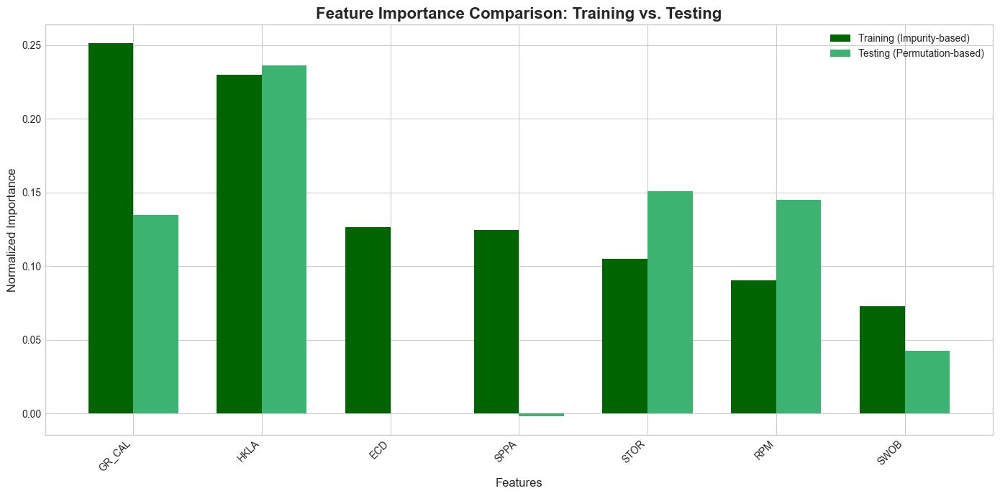

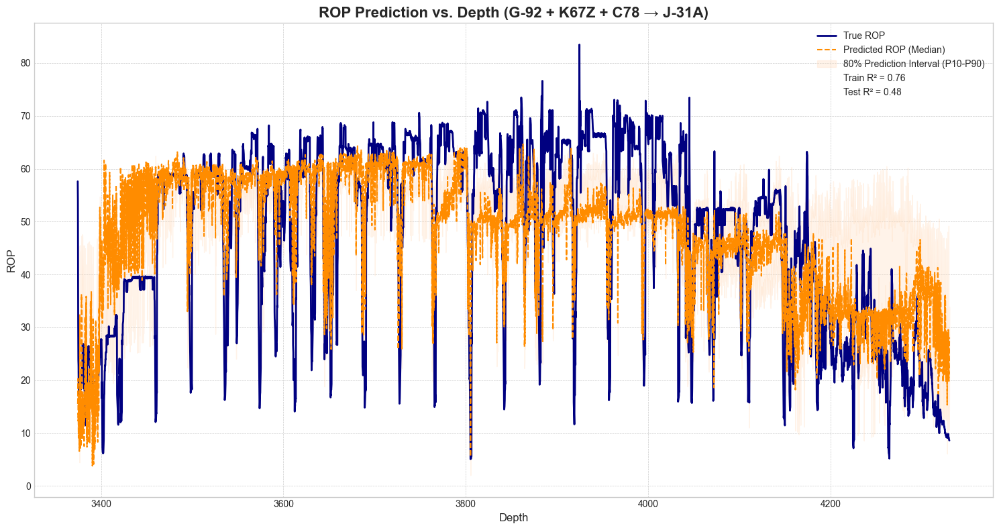

In [75]:
# Sort data by depth for all wells
df_J31A = df_J31A.sort_values('DEPTH')
df_G92 = df_G92.sort_values('DEPTH')
df_K67Z = df_K67Z.sort_values('DEPTH')
df_C78 = df_C78.sort_values('DEPTH')

# Define initial features and target
features = ['HKLA', 'SWOB','RPM', 'GR_CAL', 'STOR', 'ECD', 'SPPA']
target = 'ROP5'

# Use G92, K67Z and C78 for training, test on J31A
# Get training data from G92, K67Z and C78
X_train = pd.concat([df_G92[features], df_K67Z[features], df_C78[features]], ignore_index=True)
y_train = pd.concat([df_G92[target], df_K67Z[target], df_C78[target]], ignore_index=True)
X_test = df_J31A[features].reset_index(drop=True)
y_test = df_J31A[target].reset_index(drop=True)

# Standardize features
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Convert back to DataFrame to preserve column names
X_train_processed = pd.DataFrame(X_train_processed, columns=features)
X_test_processed = pd.DataFrame(X_test_processed, columns=features)

# Create and train quantile regression models
quantiles = [0.1, 0.5, 0.9]
models = {}
predictions = {}

print("Training Quantile Regression models...")
for q in quantiles:
    model = GradientBoostingRegressor(
        loss='quantile',
        alpha=q,
        random_state=42,
        n_estimators=500,
        learning_rate=0.1,
        max_depth=7,
        validation_fraction=0.2,
        n_iter_no_change=10,
        tol=0.001,
        subsample=0.8
    )
    
    model.fit(X_train_processed, y_train)
    models[q] = model
    predictions[q] = model.predict(X_test_processed)
print("Training complete.")

# Save predictions to a new DataFrame for comparison
df_ROP_Comparison = pd.DataFrame({
    'DEPTH': df_J31A['DEPTH'].reset_index(drop=True),
    'ROP_Actual': y_test,
    'ROP_Pred_P10': predictions[0.1],
    'ROP_Pred_P50': predictions[0.5],
    'ROP_Pred_P90': predictions[0.9]
})


# Calculate R2 scores for the median model (P50)
train_r2 = r2_score(y_train, models[0.5].predict(X_train_processed))
test_r2 = r2_score(y_test, predictions[0.5])

print("\n--- Model Performance ---")
print("Training on G-92, K67Z and C78, Testing on J-31A:")
print(f"Train R² (median): {train_r2:.2f}")
print(f"Test R² (median): {test_r2:.2f}")
print(f"10th percentile mean prediction: {predictions[0.1].mean():.2f}")
print(f"50th percentile mean prediction: {predictions[0.5].mean():.2f}")
print(f"90th percentile mean prediction: {predictions[0.9].mean():.2f}")

# --- Feature Importance Calculation ---

# Get feature importances from the median model (impurity-based)
train_feature_importance = pd.DataFrame({
    'feature': X_train_processed.columns,
    'importance': models[0.5].feature_importances_
}).sort_values('importance', ascending=False)

# Calculate permutation feature importance on the test set
print("\nCalculating permutation importance on the test set...")
test_importance_vals = []
baseline_mae = np.mean(np.abs(y_test - predictions[0.5]))

for feature in X_test_processed.columns:
    X_test_shuffled = X_test_processed.copy()
    # Shuffle the values of a single feature column
    X_test_shuffled[feature] = np.random.permutation(X_test_shuffled[feature])
    shuffled_predictions = models[0.5].predict(X_test_shuffled)
    shuffled_mae = np.mean(np.abs(y_test - shuffled_predictions))
    # Calculate importance as the relative increase in error
    importance = (shuffled_mae - baseline_mae) / baseline_mae
    test_importance_vals.append(importance)

test_feature_importance = pd.DataFrame({
    'feature': X_test_processed.columns,
    'importance': test_importance_vals
}).sort_values('importance', ascending=False)

# Print feature importance results
print("\n--- Feature Importances (from Median Model) ---")
print("\nTrain Feature Importances (Impurity-based):")
print(train_feature_importance.to_string(index=False))

print("\nTest Feature Importances (Permutation-based):")
print(test_feature_importance.to_string(index=False))


# --- Plotting ---

# Align test feature importance with training feature importance order for correct plotting.
test_feature_importance_aligned = test_feature_importance.set_index('feature').reindex(train_feature_importance['feature']).reset_index()


# Create combined bar plot for feature importance
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(figsize=(14, 7))

x = np.arange(len(train_feature_importance))
width = 0.35

ax.bar(x - width/2, train_feature_importance['importance'], width, label='Training (Impurity-based)', color='darkgreen')
ax.bar(x + width/2, test_feature_importance_aligned['importance'], width, label='Testing (Permutation-based)', color='mediumseagreen')

ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Normalized Importance', fontsize=12)
ax.set_title('Feature Importance Comparison: Training vs. Testing', fontsize=16, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(train_feature_importance['feature'], rotation=45, ha='right')
ax.legend()
fig.tight_layout()
plt.show()


# Plot predictions vs actual ROP using depth
fig, ax = plt.subplots(figsize=(15, 8))

ax.plot(df_ROP_Comparison['DEPTH'], df_ROP_Comparison['ROP_Actual'], label='True ROP', color='navy', linewidth=2)
ax.plot(df_ROP_Comparison['DEPTH'], df_ROP_Comparison['ROP_Pred_P50'], label='Predicted ROP (Median)', color='darkorange', linestyle='--')
ax.fill_between(df_ROP_Comparison['DEPTH'],
                df_ROP_Comparison['ROP_Pred_P10'],
                df_ROP_Comparison['ROP_Pred_P90'],
                color='peachpuff',
                alpha=0.3,
                label='80% Prediction Interval (P10-P90)')

# Add R-squared scores to the plot legend
handles, labels = ax.get_legend_handles_labels()
handles.append(plt.Rectangle((0,0),1,1, fc="white", ec="white", lw=0, alpha=0))
labels.append(f'Train R² = {train_r2:.2f}')
handles.append(plt.Rectangle((0,0),1,1, fc="white", ec="white", lw=0, alpha=0))
labels.append(f'Test R² = {test_r2:.2f}')

ax.set_xlabel('Depth', fontsize=12)
ax.set_ylabel('ROP', fontsize=12)
ax.set_title('ROP Prediction vs. Depth (G-92 + K67Z + C78 → J-31A)', fontsize=16, fontweight='bold')
ax.legend(handles=handles, labels=labels)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
fig.tight_layout()
plt.show()

In [13]:
# Calculate average k between depths 3340-4100 for G92
depth_range_g92 = df_G92[(df_G92['DEPTH'] >= 3440) & (df_G92['DEPTH'] <= 3675)]
# Combine the data
depth_range = pd.concat([depth_range_g92])

k_values = (depth_range['ROP5'] / 18.288) / (depth_range['RPM'] * (((depth_range['SWOB']) * 0.00220462) / (2000 * 12.25))**2)
avg_k = k_values.mean()

print(f"\nAverage k between depths 3340-4100 for C78, G92 and K67Z:")
print(f"k = {avg_k:.2f}")


Average k between depths 3340-4100 for C78, G92 and K67Z:
k = 54138688038.85



Training on G-92, K67Z and C78, Testing on J-31A:
Train R² (median): 0.76
Test R² (median): 0.29
10th percentile mean: 48.06
50th percentile mean: 51.66
90th percentile mean: 52.34

Train Feature Importances:
GR_CAL: 0.2511
HKLA: 0.2296
ECD: 0.1266
SPPA: 0.1246
STOR: 0.1051
RPM: 0.0903
SWOB: 0.0727

Test Feature Importances:
STOR: 0.2119
RPM: 0.1542
SWOB: 0.0408
GR_CAL: 0.0352
HKLA: 0.0081
ECD: 0.0000
SPPA: -0.0036


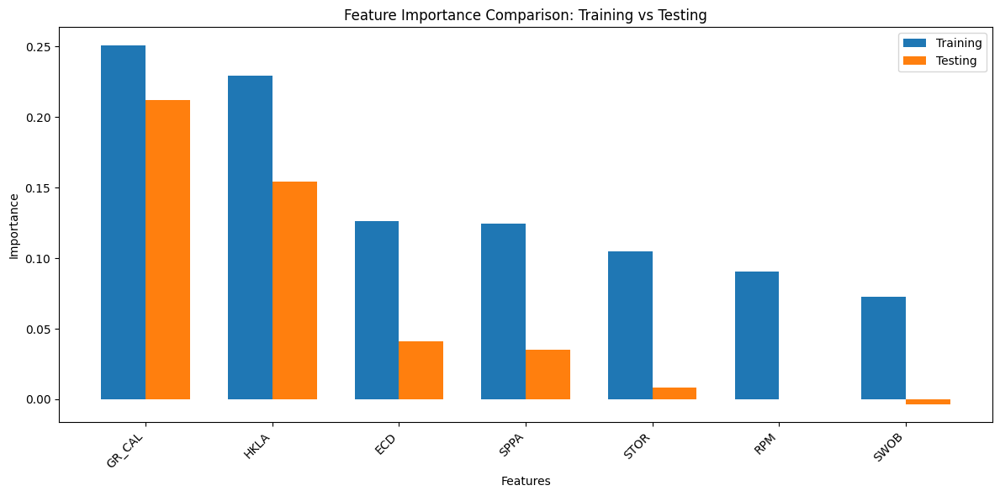

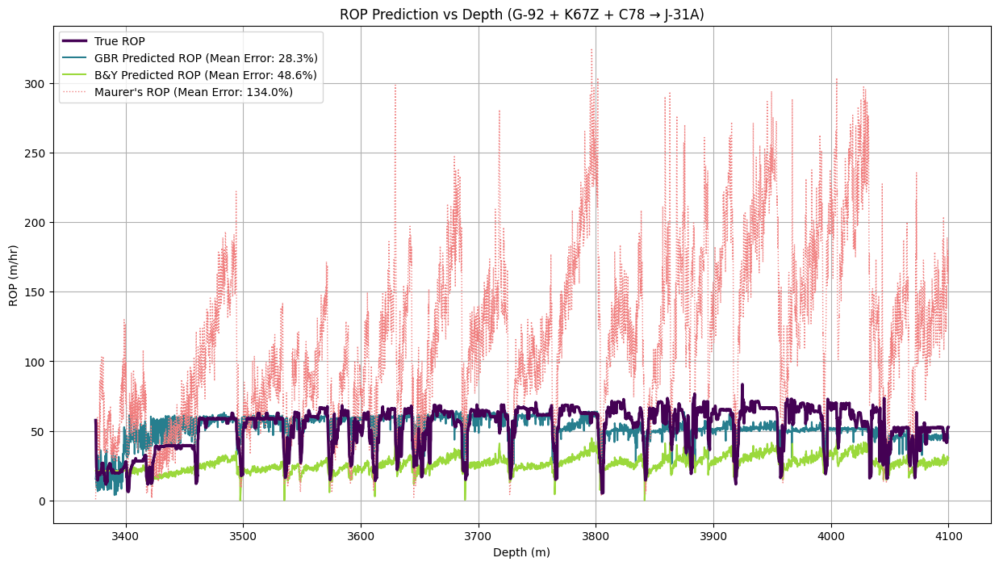

In [48]:
# Sort data by depth for all wells
df_J31A = df_J31A.sort_values('DEPTH')

# Filter J31A data for depth range 3350-4330
df_J31A = df_J31A[(df_J31A['DEPTH'] >= 3350) & (df_J31A['DEPTH'] <= 4100)]

df_G92 = df_G92.sort_values('DEPTH')
df_K67Z = df_K67Z.sort_values('DEPTH')
df_C78 = df_C78.sort_values('DEPTH')

# Define initial features and target
features = ['HKLA', 'SWOB','RPM', 'GR_CAL', 'STOR', 'ECD', 'SPPA']
target = 'ROP5'

# Use G92, K67Z and C78 for training, test on J31A
# Get training data from G92, K67Z and C78
X_train = pd.concat([df_G92[features], df_K67Z[features], df_C78[features]])
y_train = pd.concat([df_G92[target], df_K67Z[target], df_C78[target]])
X_test = df_J31A[features]
y_test = df_J31A[target]

# Create groups for cross validation
groups = np.concatenate([
    np.full(len(df_G92), 'G92'),
    np.full(len(df_K67Z), 'K67Z'),
    np.full(len(df_C78), 'C78')
])

# Standardize features
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Convert back to DataFrame to preserve column names
X_train_processed = pd.DataFrame(X_train_processed, columns=features)
X_test_processed = pd.DataFrame(X_test_processed, columns=features)

# Create and train quantile regression models
quantiles = [0.1, 0.5, 0.9]
models = {}
predictions = {}

for q in quantiles:
    model = GradientBoostingRegressor(
        loss='quantile',
        alpha=q,
        random_state=42,
        n_estimators=500,
        learning_rate=0.1,
        max_depth=7,
        validation_fraction=0.2,
        n_iter_no_change=10,
        tol=0.001,
        subsample=0.8
    )
    
    model.fit(X_train_processed, y_train)
    models[q] = model
    predictions[q] = model.predict(X_test_processed)

# Save predictions to df_ROP_Comparison
df_ROP_Comparison = pd.DataFrame()
df_ROP_Comparison['ROP_PreGBR'] = predictions[0.5]

# Calculate R2 scores
train_r2 = r2_score(y_train, models[0.5].predict(X_train_processed))
test_r2 = r2_score(y_test, predictions[0.5])

print("\nTraining on G-92, K67Z and C78, Testing on J-31A:")
print(f"Train R² (median): {train_r2:.2f}")
print(f"Test R² (median): {test_r2:.2f}")
print(f"10th percentile mean: {predictions[0.1].mean():.2f}")
print(f"50th percentile mean: {predictions[0.5].mean():.2f}")
print(f"90th percentile mean: {predictions[0.9].mean():.2f}")

# Get feature importances from the median model for both train and test
train_feature_importance = pd.DataFrame({
    'feature': X_train_processed.columns,
    'importance': models[0.5].feature_importances_
}).sort_values('importance', ascending=False)

test_predictions = models[0.5].predict(X_test_processed)
test_residuals = np.abs(y_test - test_predictions)

# Calculate feature importance on test set based on residuals
test_importance = []
baseline_mae = np.mean(test_residuals)

for feature in X_test_processed.columns:
    X_test_shuffled = X_test_processed.copy()
    X_test_shuffled[feature] = np.random.permutation(X_test_shuffled[feature])
    shuffled_predictions = models[0.5].predict(X_test_shuffled)
    shuffled_mae = np.mean(np.abs(y_test - shuffled_predictions))
    importance = (shuffled_mae - baseline_mae) / baseline_mae
    test_importance.append(importance)

test_feature_importance = pd.DataFrame({
    'feature': X_test_processed.columns,
    'importance': test_importance
}).sort_values('importance', ascending=False)

# Print feature importance results
print("\nTrain Feature Importances:")
for idx, row in train_feature_importance.iterrows():
    print(f"{row['feature']}: {row['importance']:.4f}")

print("\nTest Feature Importances:")
for idx, row in test_feature_importance.iterrows():
    print(f"{row['feature']}: {row['importance']:.4f}")

# Create combined bar plot
plt.figure(figsize=(12, 6))

x = np.arange(len(train_feature_importance))
width = 0.35

plt.bar(x - width/2, train_feature_importance['importance'], width, label='Training')
plt.bar(x + width/2, test_feature_importance['importance'], width, label='Testing')

plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance Comparison: Training vs Testing')
plt.xticks(x, train_feature_importance['feature'], rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate percentage errors
gbr_percent_error = np.abs(predictions[0.5] - y_test) / y_test * 100
gbr_mean_percent_error = np.mean(gbr_percent_error)

# Calculate Maurer's ROP model using J31A data
d = 12.25  # bit size in inches
k = 54138688038.85 # drilling coefficient  
s = 2000   # rock strength (psi)

# Calculate Maurer's ROP (already converted to m/hr)
maurers_rop = (k * df_J31A['RPM'] * (((df_J31A['SWOB']) * 0.00220462) / (s * d))**2) * 18.288

# Calculate Maurer's percentage error
maurers_percent_error = np.abs(maurers_rop - y_test) / y_test * 100
maurers_mean_percent_error = np.mean(maurers_percent_error)

# Read B&Y ROP data and filter for depth range
by_data = pd.read_excel('/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Burgoyne & Young - Optimized version.xlsx')
by_data = by_data[(by_data['DEPTH      m'] >= 3400) & (by_data['DEPTH      m'] <= 4100)]
by_rop = by_data['B & Y ROP ft/hr'] * 0.3048  # Convert ft/hr to m/hr

# Ensure all data arrays have same length by using df_test's depth as reference
depth = df_J31A['DEPTH'].values
y_test_aligned = y_test.values
predictions_aligned = {q: predictions[q][:len(depth)] for q in predictions}

# Interpolate B&Y data to match depth points
by_depth = by_data['DEPTH      m'].values
by_rop_interp = np.interp(depth, by_depth, by_rop)

# Calculate B&Y percentage error
by_percent_error = np.abs(by_rop_interp - y_test_aligned) / y_test_aligned * 100
by_mean_percent_error = np.mean(by_percent_error)

# Get 3 distinct, high-contrast colors from a quality colormap for your main data
colors = cm.viridis(np.linspace(0, 0.85, 3))

# Plot predictions vs actual ROP using depth
plt.figure(figsize=(15,8))

# Plot the main data with the new colors
# Make 'True ROP' thicker and ensure it's plotted on top with zorder
plt.plot(depth, y_test_aligned, label='True ROP', color=colors[0], linewidth=2.5, zorder=10)
plt.plot(depth, predictions_aligned[0.5], 
         label=f'GBR Predicted ROP (Mean Error: {gbr_mean_percent_error:.1f}%)', 
         color=colors[1], linewidth=1.5)
plt.plot(depth, by_rop_interp, 
         label=f'B&Y Predicted ROP (Mean Error: {by_mean_percent_error:.1f}%)', 
         color=colors[2], linewidth=1.5)

# De-emphasize the noisy Maurer's ROP line
plt.plot(depth, maurers_rop, 
         label=f"Maurer's ROP (Mean Error: {maurers_mean_percent_error:.1f}%)", 
         color='lightcoral',  # A light gray color
         linewidth=1,     # Thin line
         linestyle=':', # Dotted line to further reduce visual weight
         )   

plt.legend()
plt.grid(True)
plt.title('ROP Prediction vs Depth (G-92 + K67Z + C78 → J-31A)')
plt.xlabel('Depth (m)')
plt.ylabel('ROP (m/hr)')
plt.show()

Starting model training and prediction...
Training model for quantile: 0.1
Training model for quantile: 0.5
Training model for quantile: 0.9
...Training complete.

Training on G-92, K67Z and C78, Testing on J-31A:
Train R² (median): 0.03
Test R² (median): 0.00
10th percentile mean: -4.24
50th percentile mean: 0.01
90th percentile mean: 2.43

Train Feature Importances:
SWOB: 0.1058
SWOB_lag1: 0.0965
GR_CAL_lag1: 0.0896
SPPA: 0.0779
GR_CAL: 0.0692
STOR: 0.0673
HKLA: 0.0673
ECD_lag1: 0.0653
SPPA_lag1: 0.0650
STOR_lag1: 0.0633
RPM_lag1: 0.0629
HKLA_lag1: 0.0591
RPM: 0.0582
ECD: 0.0527

Test Feature Importances:
SWOB: 0.0284
SWOB_lag1: 0.0180
SPPA_lag1: 0.0009
HKLA_lag1: 0.0004
GR_CAL_lag1: 0.0002
RPM_lag1: 0.0002
ECD: 0.0000
ECD_lag1: 0.0000
STOR: -0.0000
SPPA: -0.0001
HKLA: -0.0001
STOR_lag1: -0.0001
RPM: -0.0002
GR_CAL: -0.0002


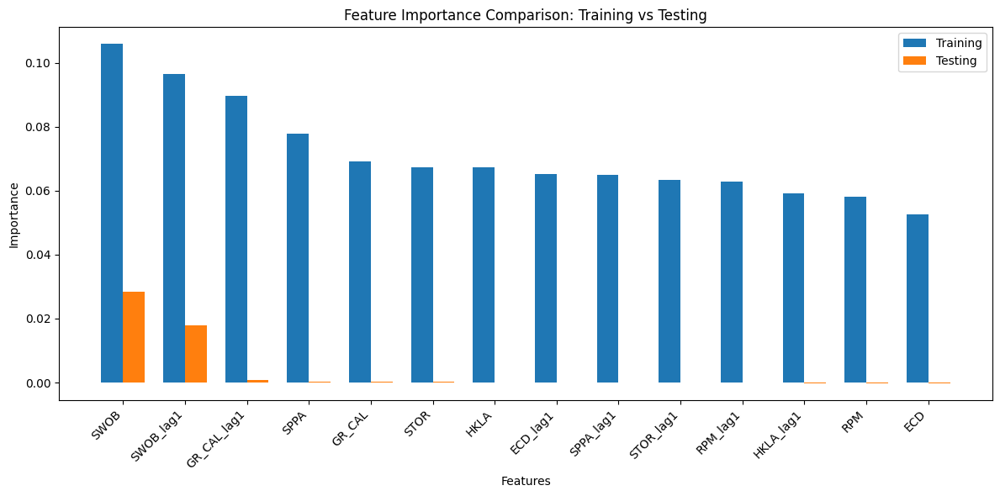

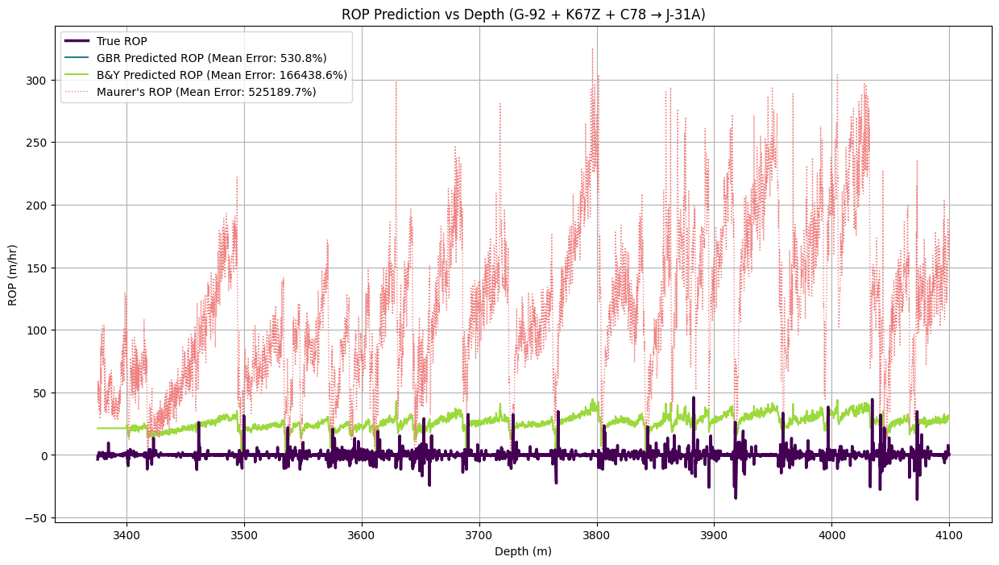

In [39]:
# --- Helper function to process each dataframe ---
def process_well_data(df, features_to_lag, depth_range=None):
    """Sorts, filters, and creates lagged features for a well dataframe."""
    df = df.sort_values('DEPTH').copy()

    # 1. (FIX) FILTER BY DEPTH FIRST to avoid data leakage
    if depth_range:
        df = df[(df['DEPTH'] >= depth_range[0]) & (df['DEPTH'] <= depth_range[1])]

    # 2. Create lagged features
    for feature in features_to_lag:
        df[f'{feature}_lag1'] = df[feature].shift(1)

    # 3. Calculate the target variable (change in ROP)
    df['delta_ROP'] = df['ROP5'] - df['ROP5_lag1']

    # 4. Drop rows with NaN values created by the shift operation
    df = df.dropna()
    
    return df

# --- Data Processing ---
features_to_lag = ['HKLA', 'SWOB','RPM', 'GR_CAL', 'STOR',  'ECD', 'SPPA', 'ROP5']

# Process each well using the helper function
df_J31A = process_well_data(df_J31A, features_to_lag, depth_range=[3350, 4100])
df_G92 = process_well_data(df_G92, features_to_lag)
df_K67Z = process_well_data(df_K67Z, features_to_lag)
df_C78 = process_well_data(df_C78, features_to_lag)

# --- Feature Engineering and Data Splitting ---
# Define features and the target for the model
features = ['HKLA', 'SWOB','RPM', 'GR_CAL', 'STOR',  'ECD', 'SPPA',
           'HKLA_lag1', 'SWOB_lag1', 'RPM_lag1', 'GR_CAL_lag1', 'STOR_lag1', 'ECD_lag1', 'SPPA_lag1']
target = 'delta_ROP'

# Get training data from G92, K67Z and C78
X_train = pd.concat([df_G92[features], df_K67Z[features], df_C78[features]], ignore_index=True)
y_train = pd.concat([df_G92[target], df_K67Z[target], df_C78[target]], ignore_index=True)

# Get test data from J31A
X_test = df_J31A[features]
y_test = df_J31A[target]

# Create groups for cross validation
groups = np.concatenate([
    np.full(len(df_G92), 'G92'),
    np.full(len(df_K67Z), 'K67Z'),
    np.full(len(df_C78), 'C78')
])

# --- Model Training ---
# Standardize features
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Convert back to DataFrame to preserve column names
X_train_processed = pd.DataFrame(X_train_processed, columns=features)
X_test_processed = pd.DataFrame(X_test_processed, columns=features)

# Create and train quantile regression models
quantiles = [0.1, 0.5, 0.9]
models = {}
predictions = {}

print("Starting model training and prediction...")
for q in quantiles:
    print(f"Training model for quantile: {q}")
    model = GradientBoostingRegressor(
        loss='quantile',
        alpha=q,
        random_state=42,
        n_estimators=500,
        learning_rate=0.1,
        max_depth=7,
        validation_fraction=0.2,
        n_iter_no_change=10,
        tol=0.001,
        subsample=0.8
    )
    
    model.fit(X_train_processed, y_train)
    models[q] = model
    predictions[q] = model.predict(X_test_processed)

print("...Training complete.")

# Calculate R2 scores
train_r2 = r2_score(y_train, models[0.5].predict(X_train_processed))
test_r2 = r2_score(y_test, predictions[0.5])

print("\nTraining on G-92, K67Z and C78, Testing on J-31A:")
print(f"Train R² (median): {train_r2:.2f}")
print(f"Test R² (median): {test_r2:.2f}")
print(f"10th percentile mean: {predictions[0.1].mean():.2f}")
print(f"50th percentile mean: {predictions[0.5].mean():.2f}")
print(f"90th percentile mean: {predictions[0.9].mean():.2f}")

# Get feature importances from the median model for both train and test
train_feature_importance = pd.DataFrame({
    'feature': X_train_processed.columns,
    'importance': models[0.5].feature_importances_
}).sort_values('importance', ascending=False)

test_predictions = models[0.5].predict(X_test_processed)
test_residuals = np.abs(y_test - test_predictions)

# Calculate feature importance on test set based on residuals
test_importance = []
baseline_mae = np.mean(test_residuals)

for feature in X_test_processed.columns:
    X_test_shuffled = X_test_processed.copy()
    X_test_shuffled[feature] = np.random.permutation(X_test_shuffled[feature])
    shuffled_predictions = models[0.5].predict(X_test_shuffled)
    shuffled_mae = np.mean(np.abs(y_test - shuffled_predictions))
    importance = (shuffled_mae - baseline_mae) / baseline_mae
    test_importance.append(importance)

test_feature_importance = pd.DataFrame({
    'feature': X_test_processed.columns,
    'importance': test_importance
}).sort_values('importance', ascending=False)

# Print feature importance results
print("\nTrain Feature Importances:")
for idx, row in train_feature_importance.iterrows():
    print(f"{row['feature']}: {row['importance']:.4f}")

print("\nTest Feature Importances:")
for idx, row in test_feature_importance.iterrows():
    print(f"{row['feature']}: {row['importance']:.4f}")

# Create combined bar plot
plt.figure(figsize=(12, 6))

x = np.arange(len(train_feature_importance))
width = 0.35

plt.bar(x - width/2, train_feature_importance['importance'], width, label='Training')
plt.bar(x + width/2, test_feature_importance['importance'], width, label='Testing')

plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance Comparison: Training vs Testing')
plt.xticks(x, train_feature_importance['feature'], rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate percentage errors
gbr_percent_error = np.abs(predictions[0.5] - y_test) / y_test * 100
gbr_mean_percent_error = np.mean(gbr_percent_error)

# Calculate Maurer's ROP model using J31A data
d = 12.25  # bit size in inches
k = 54138688038.85 # drilling coefficient  
s = 2000   # rock strength (psi)

# Calculate Maurer's ROP (already converted to m/hr)
maurers_rop = (k * df_J31A['RPM'] * (((df_J31A['SWOB']) * 0.00220462) / (s * d))**2) * 18.288

# Calculate Maurer's percentage error
maurers_percent_error = np.abs(maurers_rop - y_test) / y_test * 100
maurers_mean_percent_error = np.mean(maurers_percent_error)

# Read B&Y ROP data and filter for depth range
by_data = pd.read_excel('/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Burgoyne & Young - Optimized version.xlsx')
by_data = by_data[(by_data['DEPTH      m'] >= 3400) & (by_data['DEPTH      m'] <= 4100)]
by_rop = by_data['B & Y ROP ft/hr'] * 0.3048  # Convert ft/hr to m/hr

# Ensure all data arrays have same length by using df_test's depth as reference
depth = df_J31A['DEPTH'].values
y_test_aligned = y_test.values
predictions_aligned = {q: predictions[q][:len(depth)] for q in predictions}

# Interpolate B&Y data to match depth points
by_depth = by_data['DEPTH      m'].values
by_rop_interp = np.interp(depth, by_depth, by_rop)

# Calculate B&Y percentage error
by_percent_error = np.abs(by_rop_interp - y_test_aligned) / y_test_aligned * 100
by_mean_percent_error = np.mean(by_percent_error)

# Get 3 distinct, high-contrast colors from a quality colormap for your main data
colors = cm.viridis(np.linspace(0, 0.85, 3))

# Plot predictions vs actual ROP using depth
plt.figure(figsize=(15,8))

# Plot the main data with the new colors
# Make 'True ROP' thicker and ensure it's plotted on top with zorder
plt.plot(depth, y_test_aligned, label='True ROP', color=colors[0], linewidth=2.5, zorder=10)
plt.plot(depth, predictions_aligned[0.5], 
         label=f'GBR Predicted ROP (Mean Error: {gbr_mean_percent_error:.1f}%)', 
         color=colors[1], linewidth=1.5)
plt.plot(depth, by_rop_interp, 
         label=f'B&Y Predicted ROP (Mean Error: {by_mean_percent_error:.1f}%)', 
         color=colors[2], linewidth=1.5)

# De-emphasize the noisy Maurer's ROP line
plt.plot(depth, maurers_rop, 
         label=f"Maurer's ROP (Mean Error: {maurers_mean_percent_error:.1f}%)", 
         color='lightcoral',  # A light gray color
         linewidth=1,     # Thin line
         linestyle=':', # Dotted line to further reduce visual weight
         )   

plt.legend()
plt.grid(True)
plt.title('ROP Prediction vs Depth (G-92 + K67Z + C78 → J-31A)')
plt.xlabel('Depth (m)')
plt.ylabel('ROP (m/hr)')
plt.show()

### ANN

Quantile Regression Neural Network (QRNN): Test R² (median prediction): -0.047

Training model for quantile: 0.1
Training model for quantile: 0.5
Training model for quantile: 0.9

Test R² (median prediction): -0.047


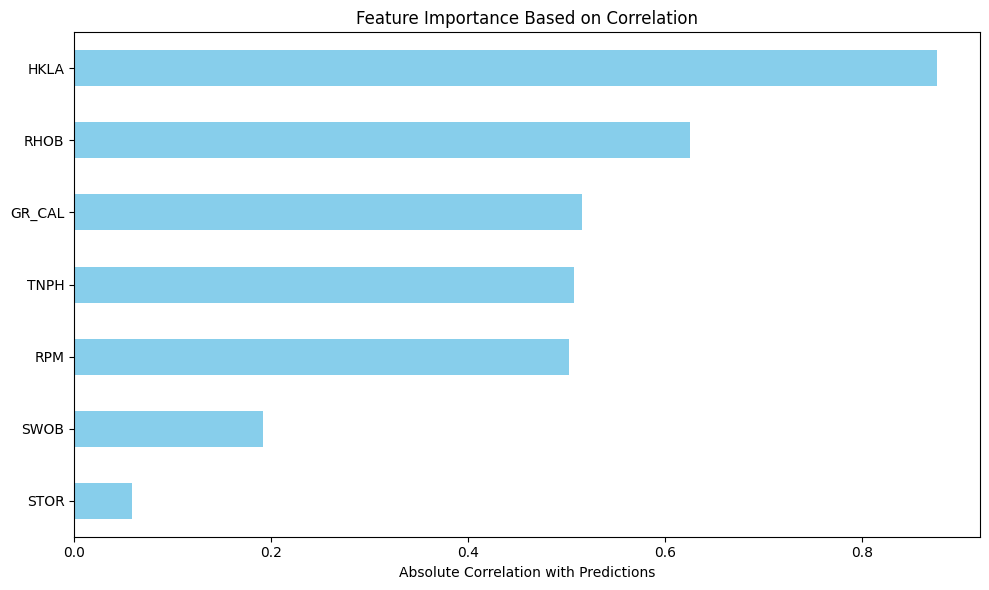

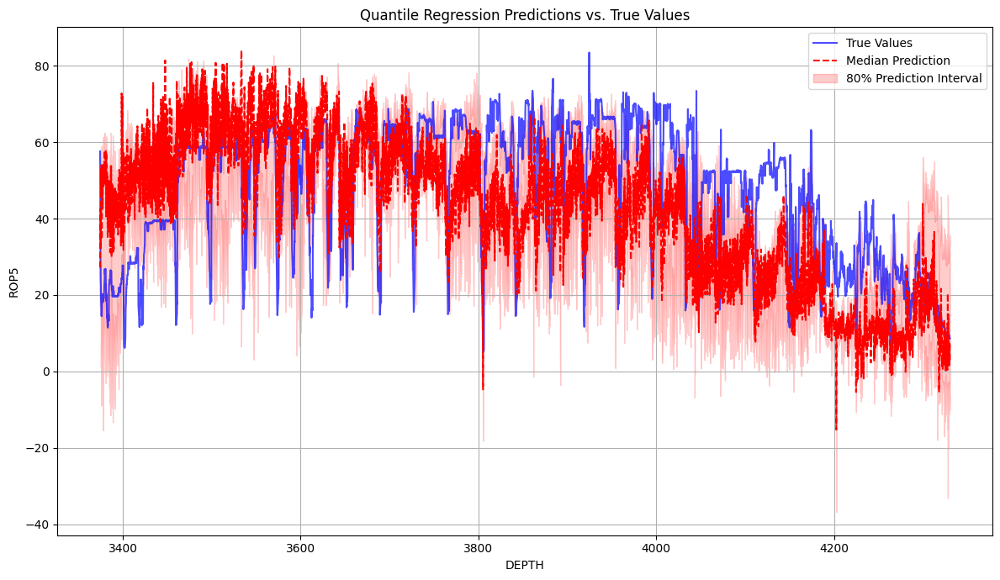

In [114]:
# Sort data by depth for all wells
df_J31A = df_J31A.sort_values('DEPTH')
df_G92 = df_G92.sort_values('DEPTH')
df_K67Z = df_K67Z.sort_values('DEPTH')
df_C78 = df_C78.sort_values('DEPTH')

# Define features and target
features = ['HKLA', 'SWOB', 'RPM', 'STOR', 'GR_CAL', 'TNPH', 'RHOB']
target = 'ROP5'
plot_axis = 'DEPTH'

# Create training and testing sets
df_train = pd.concat([df_G92, df_K67Z, df_C78])
df_test = df_J31A

X_train = df_train[features]
y_train = df_train[target]
X_test = df_test[features]
y_test = df_test[target]

# --- NEW SCALING CODE ---
# 1. Create a scaler for features
feature_scaler = StandardScaler()
X_train_processed = feature_scaler.fit_transform(X_train)
X_test_processed = feature_scaler.transform(X_test)

# 2. Create a SEPARATE scaler for the target
target_scaler = StandardScaler()
# Note: y_train.values.reshape(-1, 1) is needed because scaler expects a 2D array
y_train_processed = target_scaler.fit_transform(y_train.values.reshape(-1, 1))
y_test_processed = target_scaler.transform(y_test.values.reshape(-1, 1))

# Convert to PyTorch Tensors
X_train_tensor = torch.FloatTensor(X_train_processed)
# Use the new scaled target
y_train_tensor = torch.FloatTensor(y_train_processed)
X_test_tensor = torch.FloatTensor(X_test_processed)
# Use the new scaled target
y_test_tensor = torch.FloatTensor(y_test_processed)

# 3. MODEL AND LOSS FUNCTION DEFINITION
def pinball_loss(y_pred, y_true, quantile):
    """Calculates the pinball loss for a given quantile."""
    diff = y_true - y_pred
    return torch.mean(torch.max(quantile * diff, (quantile - 1) * diff))

class QuantileNet(nn.Module):
    """A robust neural network with BatchNorm."""
    def __init__(self, input_dim, hidden_dim1=64, hidden_dim2=32):
        super(QuantileNet, self).__init__()
        self.layer1 = nn.Linear(input_dim, hidden_dim1)
        self.bn1 = nn.BatchNorm1d(hidden_dim1)
        self.layer2 = nn.Linear(hidden_dim1, hidden_dim2)
        self.bn2 = nn.BatchNorm1d(hidden_dim2)
        self.output_layer = nn.Linear(hidden_dim2, 1)

    def forward(self, x):
        x = F.relu(self.bn1(self.layer1(x)))
        x = F.relu(self.bn2(self.layer2(x)))
        x = self.output_layer(x)
        return x

    def predict(self, X):
        self.eval()
        with torch.no_grad():
            X_tensor = torch.FloatTensor(X)
            # The model now predicts SCALED values
            scaled_predictions = self(X_tensor)
            return scaled_predictions.numpy()

# 4. MODEL TRAINING
quantiles = [0.1, 0.5, 0.9]  # Lower, median, and upper quantiles
models = {}
predictions = {}

for q in quantiles:
    print(f"Training model for quantile: {q}")
    model = QuantileNet(input_dim=X_train_tensor.shape[1])
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    # Training loop
    for epoch in range(1000):
        model.train()
        optimizer.zero_grad()
        y_pred = model(X_train_tensor)
        loss = pinball_loss(y_pred, y_train_tensor, q)
        loss.backward()
        optimizer.step()

    # Store model and generate predictions on the test set
    models[q] = model
    predictions[q] = model.predict(X_test_processed)

# 5. EVALUATION
# Inverse transform the predictions to get them back to the original ROP5 scale
final_predictions = {}
for q in quantiles:
    # Use the target_scaler we created earlier
    final_predictions[q] = target_scaler.inverse_transform(predictions[q])

# Now calculate R-squared on the ORIGINAL scales
# y_test is the original, un-scaled test data
test_r2 = r2_score(y_test, final_predictions[0.5])
print(f"\nTest R² (median prediction): {test_r2:.3f}")

# 6. FEATURE IMPORTANCE
# Calculate feature importance using correlation coefficients
feature_importance = []
for i, feature in enumerate(features):
    # Reshape predictions to match X_test_processed shape for correlation calculation
    pred_reshaped = predictions[0.5].reshape(-1)
    correlation = np.corrcoef(X_test_processed[:, i], pred_reshaped)[0,1]
    feature_importance.append(abs(correlation))

importances = pd.Series(feature_importance, index=features).sort_values()

# Plot feature importances
plt.figure(figsize=(10, 6))
importances.plot(kind='barh', color='skyblue')
plt.xlabel("Absolute Correlation with Predictions")
plt.title("Feature Importance Based on Correlation")
plt.tight_layout()
plt.show()

# 6. VISUALIZATION (Plot the original-scale data)
plt.figure(figsize=(12, 7))

plot_x_axis_data = df_test[plot_axis]
# Plot the TRUE original values
plt.plot(plot_x_axis_data, y_test, label='True Values', color='blue', alpha=0.7)
# Plot the INVERSE-TRANSFORMED predictions
plt.plot(plot_x_axis_data, final_predictions[0.5], label='Median Prediction', color='red', linestyle='--')

plt.fill_between(
    plot_x_axis_data,
    final_predictions[0.1].flatten(), # flatten() to ensure 1D shape
    final_predictions[0.9].flatten(),
    color='red',
    alpha=0.2,
    label='80% Prediction Interval'
)

plt.xlabel(plot_axis)
plt.ylabel(target)
plt.title(f'Quantile Regression Predictions vs. True Values')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


MLPRegressor -- Training on G-92, K67Z, C78, Testing on J-31A:
Train R² (median): 0.54
Test R² (median): 0.37


Random 80-20 Split Results:
Train R² (median): 0.61
Test R² (median): 0.58


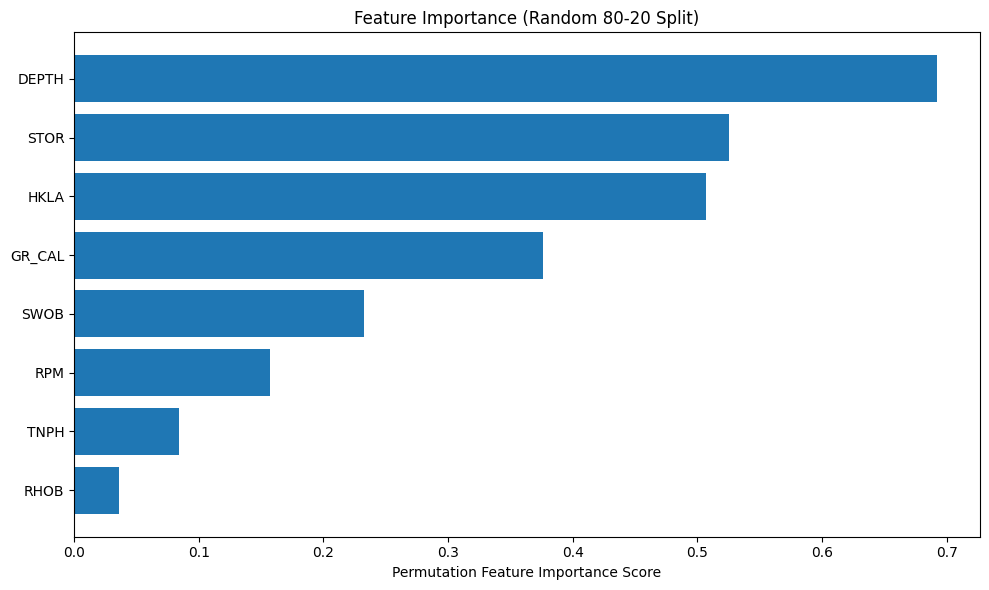

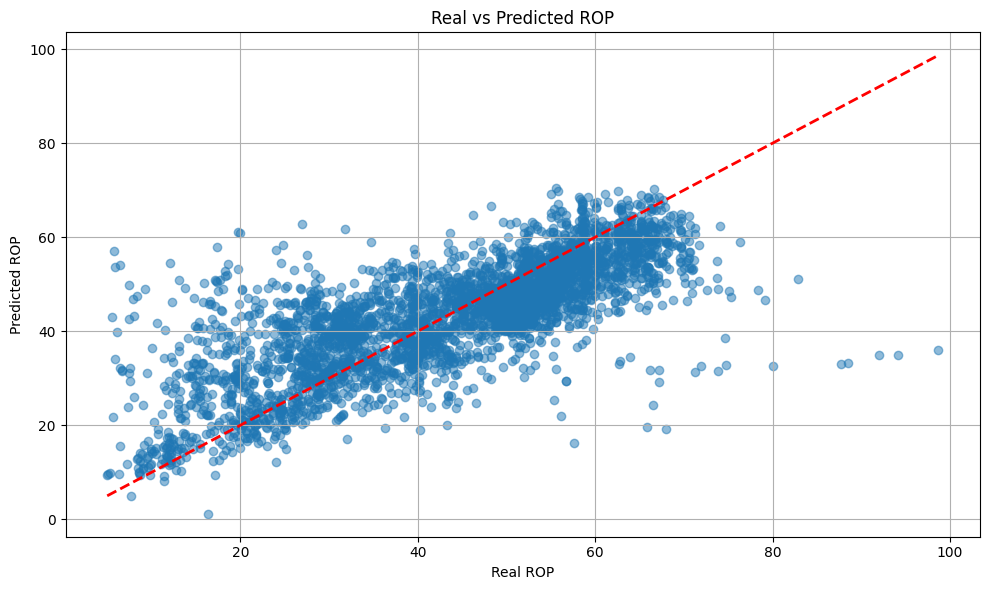

In [115]:
# Combine all data
df_combined = pd.concat([df_J31A, df_G92, df_K67Z, df_C78])
df_combined = df_combined.sort_values('DEPTH')

# Define features and target
features = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'TNPH', 'RHOB', 'DEPTH']
target = 'ROP5'

# Split into train (80%) and test (20%) randomly
from sklearn.model_selection import train_test_split
X = df_combined[features]
y = df_combined[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features - fit only on training data
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Create and train MLP models for different quantiles
from sklearn.neural_network import MLPRegressor

quantiles = [0.1, 0.5, 0.9]
models = {}
predictions = {}

for q in quantiles:
    # Create MLP model with simplified architecture - single hidden layer with fewer neurons
    model = MLPRegressor(
        hidden_layer_sizes=(20,),  # Single hidden layer with 20 neurons
        activation='relu',
        solver='adam',
        alpha=0.001,  # L2 regularization term
        learning_rate_init=0.001,
        max_iter=1000,
        early_stopping=True,
        validation_fraction=0.2,
        random_state=42
    )
    
    # For quantile regression, modify the target values
    if q == 0.1:
        y_train_adjusted = y_train * 0.9  # Lower bound
    elif q == 0.9:
        y_train_adjusted = y_train * 1.1  # Upper bound
    else:
        y_train_adjusted = y_train  # Median prediction
        
    # Train model
    model.fit(X_train_processed, y_train_adjusted)
    
    models[q] = model
    predictions[q] = model.predict(X_test_processed)

# Calculate R2 scores
train_r2 = r2_score(y_train, models[0.5].predict(X_train_processed))
test_r2 = r2_score(y_test, predictions[0.5])

print("\nRandom 80-20 Split Results:")
print(f"Train R² (median): {train_r2:.2f}")
print(f"Test R² (median): {test_r2:.2f}")

# Get feature importances using permutation importance
from sklearn.inspection import permutation_importance

result = permutation_importance(models[0.5], X_test_processed, y_test, n_repeats=10, random_state=42)
importances = result.importances_mean

# Plot feature importances
plt.figure(figsize=(10,6))
importance_df = pd.DataFrame({'features': features, 'importance': importances})
importance_df = importance_df.sort_values('importance', ascending=True)

plt.barh(importance_df['features'], importance_df['importance'])
plt.xlabel('Permutation Feature Importance Score')
plt.title('Feature Importance (Random 80-20 Split)')
plt.tight_layout()
plt.show()

# Plot real vs predicted ROP
plt.figure(figsize=(10,6))
plt.scatter(y_test, predictions[0.5], alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Real ROP')
plt.ylabel('Predicted ROP')
plt.title('Real vs Predicted ROP')
plt.grid(True)
plt.tight_layout()
plt.show()


Training on G-92, K67Z, C78, Testing on J-31A:
Train R² (median): 0.65
Test R² (median): 0.04


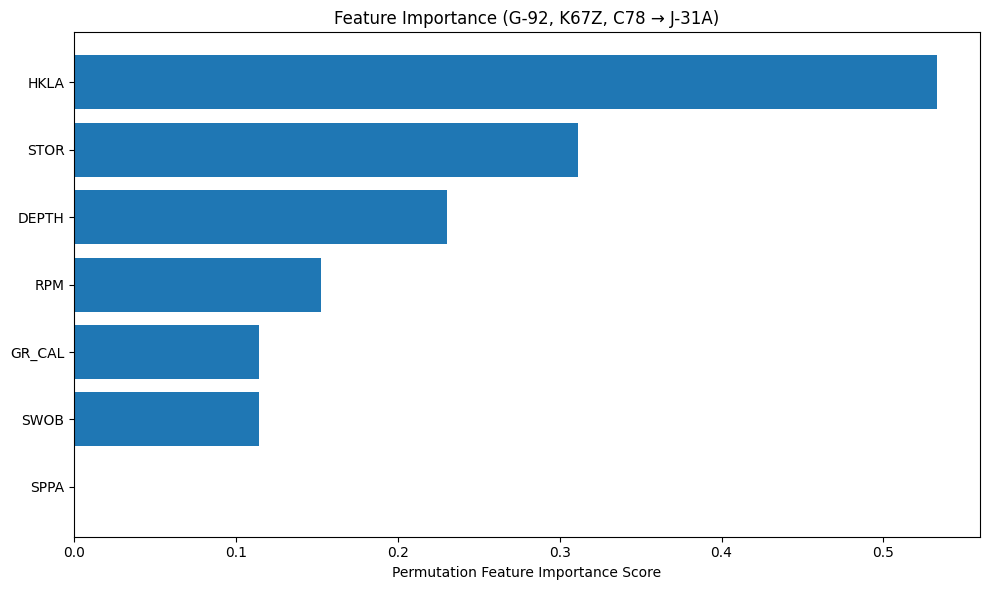

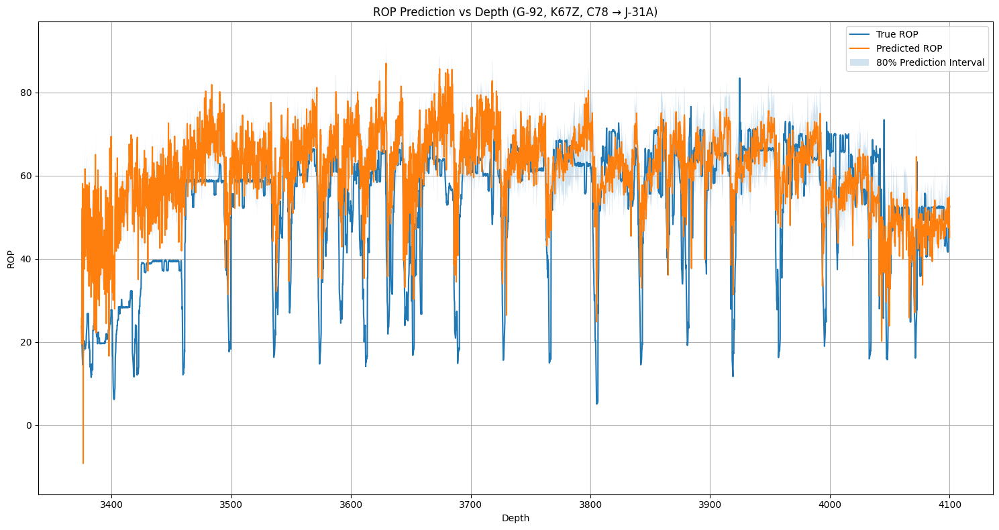

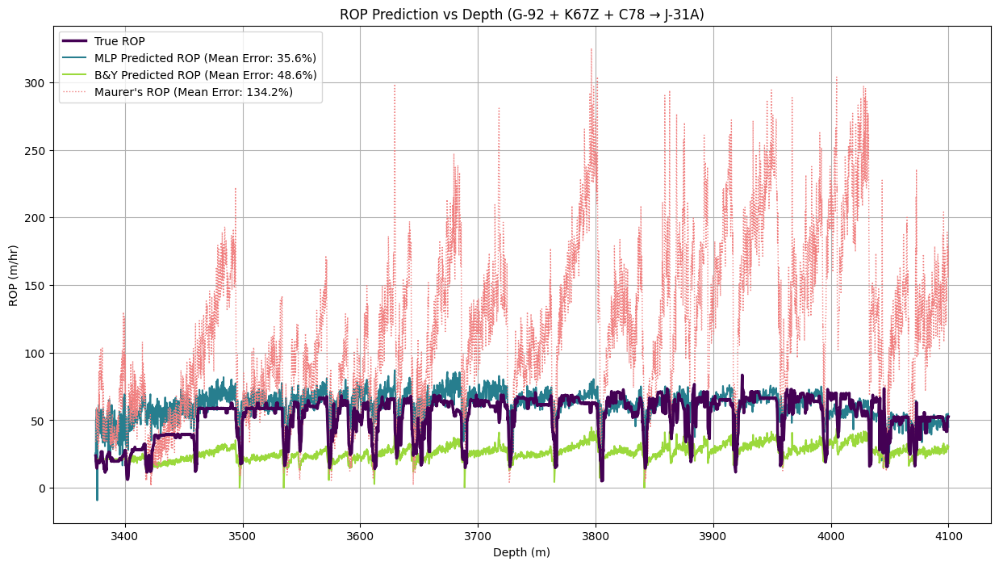

In [37]:
# Sort data by depth for all wells
df_J31A = df_J31A.sort_values('DEPTH')
df_G92 = df_G92.sort_values('DEPTH')
df_K67Z = df_K67Z.sort_values('DEPTH')
df_C78 = df_C78.sort_values('DEPTH')

# Define features and target
features = ['HKLA', 'SWOB','RPM', 'GR_CAL', 'STOR', 'DEPTH', 'SPPA']
target = 'ROP5'

# Train on G92, K67Z, C78, test on J31A
X_train = pd.concat([df_G92[features], df_K67Z[features], df_C78[features]])
y_train = pd.concat([df_G92[target], df_K67Z[target], df_C78[target]])
X_test = df_J31A[features]
y_test = df_J31A[target]

# Standardize features - fit only on training data
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Create and train MLP models for different quantiles
from sklearn.neural_network import MLPRegressor

quantiles = [0.1, 0.5, 0.9]
models_g92_j31 = {}
predictions_g92_j31 = {}

for q in quantiles:
    # Create MLP model with simplified architecture - single hidden layer with fewer neurons
    model = MLPRegressor(
        hidden_layer_sizes=(20,),  # Single hidden layer with 20 neurons
        activation='relu',
        solver='adam',
        alpha=0.001,  # L2 regularization term
        learning_rate_init=0.001,
        max_iter=1000,
        early_stopping=True,
        validation_fraction=0.2,
        random_state=42
    )
    
    
    # For quantile regression, modify the target values
    if q == 0.1:
        y_train_adjusted = y_train * 0.9  # Lower bound
    elif q == 0.9:
        y_train_adjusted = y_train * 1.1  # Upper bound
    else:
        y_train_adjusted = y_train  # Median prediction
        
    # Train model
    model.fit(X_train_processed, y_train_adjusted)
    
    models_g92_j31[q] = model
    predictions_g92_j31[q] = model.predict(X_test_processed)

# Calculate R2 scores for G92,K67Z,C78->J31A
train_r2_g92_j31 = r2_score(y_train, models_g92_j31[0.5].predict(X_train_processed))
test_r2_g92_j31 = r2_score(y_test, predictions_g92_j31[0.5])

print("\nTraining on G-92, K67Z, C78, Testing on J-31A:")
print(f"Train R² (median): {train_r2_g92_j31:.2f}")
print(f"Test R² (median): {test_r2_g92_j31:.2f}")

# Get feature importances using permutation importance
from sklearn.inspection import permutation_importance

result = permutation_importance(models_g92_j31[0.5], X_test_processed, y_test, n_repeats=10, random_state=42)
importances = result.importances_mean

# Plot feature importances
plt.figure(figsize=(10,6))
importance_df = pd.DataFrame({'features': features, 'importance': importances})
importance_df = importance_df.sort_values('importance', ascending=True)

plt.barh(importance_df['features'], importance_df['importance'])
plt.xlabel('Permutation Feature Importance Score')
plt.title('Feature Importance (G-92, K67Z, C78 → J-31A)')
plt.tight_layout()
plt.show()

# Plot predictions vs actual ROP
plt.figure(figsize=(15,8))

plt.plot(df_J31A['DEPTH'], df_J31A[target], label='True ROP')
plt.plot(df_J31A['DEPTH'], predictions_g92_j31[0.5], label='Predicted ROP')
plt.fill_between(df_J31A['DEPTH'],
                predictions_g92_j31[0.1],
                predictions_g92_j31[0.9],
                alpha=0.2,
                label='80% Prediction Interval')
plt.xlabel('Depth')
plt.ylabel('ROP')
plt.title('ROP Prediction vs Depth (G-92, K67Z, C78 → J-31A)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Calculate percentage errors for MLP predictions
mlp_percent_error = np.abs(predictions_g92_j31[0.5] - y_test) / y_test * 100
mlp_mean_percent_error = np.mean(mlp_percent_error)

# Calculate Maurer's ROP model using J31A data
d = 12.25  # bit size in inches
k = 54138688038.85 # drilling coefficient  
s = 2000   # rock strength (psi)

# Calculate Maurer's ROP (already converted to m/hr)
maurers_rop = (k * df_J31A['RPM'] * (((df_J31A['SWOB']) * 0.00220462) / (s * d))**2) * 18.288

# Calculate Maurer's percentage error
maurers_percent_error = np.abs(maurers_rop - y_test) / y_test * 100
maurers_mean_percent_error = np.mean(maurers_percent_error)

# Read B&Y ROP data and filter for depth range
by_data = pd.read_excel('/Users/cristianlopez/Documents/MUN/Capstone/Drilling Data/910B/Burgoyne & Young - Optimized version.xlsx')
by_data = by_data[(by_data['DEPTH      m'] >= 3400) & (by_data['DEPTH      m'] <= 4100)]
by_rop = by_data['B & Y ROP ft/hr'] * 0.3048  # Convert ft/hr to m/hr

# Ensure all data arrays have same length by using df_J31A's depth as reference
depth = df_J31A['DEPTH'].values
y_test_aligned = y_test.values

# Interpolate B&Y data to match depth points
by_depth = by_data['DEPTH      m'].values
by_rop_interp = np.interp(depth, by_depth, by_rop)

# Calculate B&Y percentage error
by_percent_error = np.abs(by_rop_interp - y_test_aligned) / y_test_aligned * 100
by_mean_percent_error = np.mean(by_percent_error)

# Get 3 distinct, high-contrast colors from a quality colormap for your main data
colors = cm.viridis(np.linspace(0, 0.85, 3))

# Plot predictions vs actual ROP using depth
plt.figure(figsize=(15,8))

# Plot the main data with the new colors
plt.plot(depth, y_test_aligned, label='True ROP', color=colors[0], linewidth=2.5, zorder=10)
plt.plot(depth, predictions_g92_j31[0.5], 
         label=f'MLP Predicted ROP (Mean Error: {mlp_mean_percent_error:.1f}%)', 
         color=colors[1], linewidth=1.5)
plt.plot(depth, by_rop_interp, 
         label=f'B&Y Predicted ROP (Mean Error: {by_mean_percent_error:.1f}%)', 
         color=colors[2], linewidth=1.5)
plt.plot(depth, maurers_rop, 
         label=f"Maurer's ROP (Mean Error: {maurers_mean_percent_error:.1f}%)", 
         color='lightcoral',
         linewidth=1,
         linestyle=':')

plt.legend()
plt.grid(True)
plt.title('ROP Prediction vs Depth (G-92 + K67Z + C78 → J-31A)')
plt.xlabel('Depth (m)')
plt.ylabel('ROP (m/hr)')
plt.show()

LSTM - Train R^2 0.14 & Test R^2 0.30

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Sort data by depth (already done in your code)
df_J31A = df_J31A.sort_values('DEPTH')
df_G92 = df_G92.sort_values('DEPTH')
df_K67Z = df_K67Z.sort_values('DEPTH')
df_C78 = df_C78.sort_values('DEPTH')

# Define features and target
features = ['HKLA', 'GR_CAL', 'RPM', 'STOR']
target = 'ROP5'

# Train on G92, K67Z, C78, test on J31A
X_train = pd.concat([df_G92[features], df_K67Z[features], df_C78[features]])
y_train = pd.concat([df_G92[target], df_K67Z[target], df_C78[target]])
X_test = df_J31A[features]
y_test = df_J31A[target]

# Handle missing values (example: fill with mean)
X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_test.mean())
y_train = y_train.fillna(y_train.mean())
y_test = y_test.fillna(y_test.mean())

# Standardize features
scaler = StandardScaler()
X_train_processed = scaler.fit_transform(X_train)
X_test_processed = scaler.transform(X_test)

# Reshape for LSTM
sequence_length = 10  # Try 5, 15, or 20 later
X_train_seq, y_train_seq, X_test_seq, y_test_seq = [], [], [], []

for i in range(len(X_train_processed) - sequence_length):
    X_train_seq.append(X_train_processed[i:i+sequence_length])
    y_train_seq.append(y_train.iloc[i+sequence_length])

for i in range(len(X_test_processed) - sequence_length):
    X_test_seq.append(X_test_processed[i:i+sequence_length])
    y_test_seq.append(y_test.iloc[i+sequence_length])

X_train_seq = np.array(X_train_seq)
y_train_seq = np.array(y_train_seq)
X_test_seq = np.array(X_test_seq)
y_test_seq = np.array(y_test_seq)

# Custom quantile loss (pinball loss)
def quantile_loss(q, y_true, y_pred):
    error = y_true - y_pred
    return tf.reduce_mean(tf.maximum(q * error, (q - 1) * error))

# Train models for different quantiles
quantiles = [0.1, 0.5, 0.9]
models_g92_j31 = {}
predictions_g92_j31 = {}

for q in quantiles:
    # Simplified model
    model = Sequential([
        LSTM(32, activation='relu', input_shape=(sequence_length, len(features))),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dense(1)
    ])
    
    # Compile with appropriate loss
    if q != 0.5:
        model.compile(optimizer=Adam(learning_rate=0.0005), 
                     loss=lambda y_true, y_pred: quantile_loss(q, y_true, y_pred))
    else:
        model.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')
    
    # Early stopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    
    # Train
    model.fit(X_train_seq, y_train_seq, 
              epochs=100, 
              batch_size=64, 
              validation_split=0.2, 
              callbacks=[early_stopping], 
              verbose=0)
    
    models_g92_j31[q] = model
    predictions_g92_j31[q] = model.predict(X_test_seq)

# Evaluate
train_r2 = r2_score(y_train_seq, models_g92_j31[0.5].predict(X_train_seq))
test_r2 = r2_score(y_test_seq, predictions_g92_j31[0.5])
print(f"\nTraining on G-92, K67Z, C78, Testing on J-31A:")
print(f"Train R² (median): {train_r2:.2f}")
print(f"Test R² (median): {test_r2:.2f}")

# Plot predictions
plt.figure(figsize=(15, 8))
plot_indices = df_J31A['DEPTH'].iloc[sequence_length:]
plt.plot(plot_indices, y_test_seq, label='True ROP')
plt.plot(plot_indices, predictions_g92_j31[0.5], label='Predicted ROP')
plt.fill_between(plot_indices, 
                 predictions_g92_j31[0.1].flatten(), 
                 predictions_g92_j31[0.9].flatten(), 
                 alpha=0.2, 
                 label='80% Prediction Interval')
plt.xlabel('Depth')
plt.ylabel('ROP')
plt.title('ROP Prediction vs Depth (G-92, K67Z, C78 → J-31A)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Optimization

In [41]:
# Filter G92 data for Limestone (GR < 45)
limestone_g92 = df_G92[df_G92['GR_CAL'] < 45]

# Get min, max and median values for the parameters in limestone sections
constant_params = {
    'HKLA': {'min': limestone_g92['HKLA'].min(), 'max': limestone_g92['HKLA'].max(), 'median': limestone_g92['HKLA'].median()},
    'GR_CAL': {'min': limestone_g92['GR_CAL'].min(), 'max': limestone_g92['GR_CAL'].max(), 'median': limestone_g92['GR_CAL'].median()},
    'STOR': {'min': limestone_g92['STOR'].min(), 'max': limestone_g92['STOR'].max(), 'median': limestone_g92['STOR'].median()},
    'TNPH': {'min': limestone_g92['TNPH'].min(), 'max': limestone_g92['TNPH'].max(), 'median': limestone_g92['TNPH'].median()},
    'RHOB': {'min': limestone_g92['RHOB'].min(), 'max': limestone_g92['RHOB'].max(), 'median': limestone_g92['RHOB'].median()},
    'DEPTH': {'min': limestone_g92['DEPTH'].min(), 'max': limestone_g92['DEPTH'].max(), 'median': limestone_g92['DEPTH'].median()}
}

print("\nParameters from G-92 limestone sections:")
for param, values in constant_params.items():
    print(f"{param}:")
    print(f"  Min: {values['min']:.2f}")
    print(f"  Max: {values['max']:.2f}") 
    print(f"  Median: {values['median']:.2f}")


Parameters from G-92 limestone sections:
HKLA:
  Min: 133.30
  Max: 157.17
  Median: 148.09
GR_CAL:
  Min: 11.65
  Max: 44.90
  Median: 30.93
STOR:
  Min: 12.63
  Max: 31.51
  Median: 20.93
TNPH:
  Min: 15.63
  Max: 26.20
  Median: 23.24
RHOB:
  Min: 2.54
  Max: 2.63
  Median: 2.56
DEPTH:
  Min: 3762.24
  Max: 3890.46
  Median: 3830.46


ROP Heatmap with TFLO & SPPA

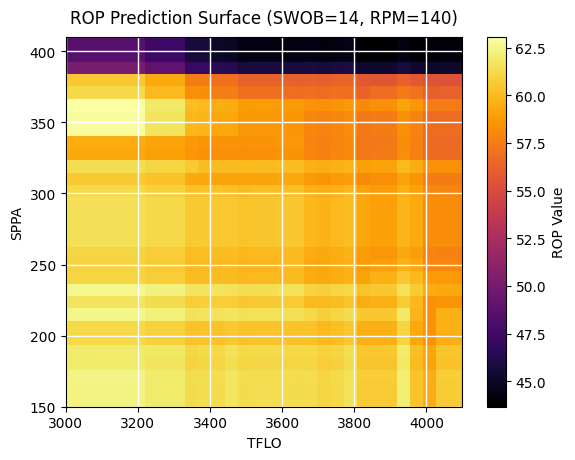

In [30]:
def predict(model, scaler, HKLA, SWOB, RPM, GR_CAL, STOR, RHOB, DEPTH, SPPA, TFLO):
    """
    This function now correctly scales the input data before making a prediction.
    """
    # Define the feature order to match the training data
    feature_order = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'DEPTH', 'SPPA', 'TFLO', 'ECD', 'RHOB'] 
    
    # Create a DataFrame with the raw input data
    X_raw = pd.DataFrame([[HKLA, SWOB, RPM, GR_CAL, STOR, DEPTH, SPPA, TFLO, 1.85, RHOB]], 
                        columns=feature_order)
    
    # Scale the data using the SAME scaler from training
    X_scaled = scaler.transform(X_raw)
    
    # Make the prediction on the scaled data
    rop_prediction = model.predict(X_scaled)[0]
    
    return rop_prediction

def plot_space(model, scaler, SPPA_vals, TFLO_vals, constant_inputs):
    """
    Generates a 'clean' ROP prediction surface with smooth gradients for SPPA and TFLO
    """
    # Unpack constant values
    HKLA = constant_inputs['HKLA']
    GR_CAL = constant_inputs['GR_CAL'] 
    STOR = constant_inputs['STOR']
    RHOB = constant_inputs['RHOB']
    DEPTH = constant_inputs['DEPTH']
    SWOB = 14  # Fixed SWOB value
    RPM = 140  # Fixed RPM value
    
    # Create the matrix to hold ROP predictions
    N_matrix = np.empty((len(SPPA_vals), len(TFLO_vals)))
    
    # Loop through the grid and predict ROP for each point
    for i, sppa in enumerate(SPPA_vals):
        for j, tflo in enumerate(TFLO_vals):
            N_matrix[i, j] = predict(model, scaler, HKLA, SWOB, RPM, GR_CAL, STOR, RHOB, DEPTH, sppa, tflo)

    # --- PLOTTING SECTION FOR A CLEAN/SMOOTH LOOK ---
    
    # Plot the heatmap
    plt.imshow(N_matrix, origin='lower', aspect='auto', cmap='inferno',
               extent=(min(TFLO_vals), max(TFLO_vals), min(SPPA_vals), max(SPPA_vals)))
    
    # Add grid lines
    plt.grid(True, color='white', linestyle='-', linewidth=1, alpha=1)
    
    # Set ticks
    plt.xticks(np.arange(3000, 4101, 200))
    plt.yticks(np.arange(150, 411, 50))
    
    plt.xlabel('TFLO')
    plt.ylabel('SPPA') 
    plt.title('ROP Prediction Surface (SWOB=14, RPM=140)', pad=10)    
    plt.colorbar(label='ROP Value')

    # Set axis limits
    plt.xlim(min(TFLO_vals), max(TFLO_vals))
    plt.ylim(min(SPPA_vals), max(SPPA_vals))

    plt.show()

# Example usage
SPPA_range = np.linspace(150, 410, 30)
TFLO_range = np.linspace(3000, 4100, 30)

constant_inputs = {
    'HKLA': 136,
    'GR_CAL': 90,
    'STOR': 19.5,
    'RHOB': 2.47,
    'DEPTH': 3500
}

# Call the function with the scaler object
plot_space(rop_model, scaler, SPPA_range, TFLO_range, constant_inputs)

ROP Heatmap SWOB and RPM

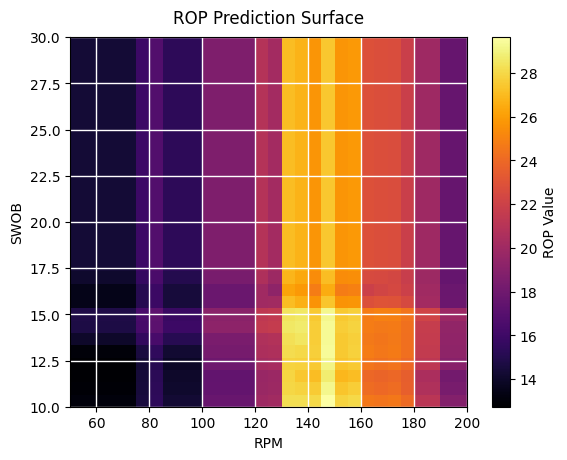

In [47]:
def predict(model, scaler, HKLA, SWOB, RPM, GR_CAL, STOR, TNPH, RHOB, DEPTH):
    """
    This function now correctly scales the input data before making a prediction.
    """
    # Define the feature order to match the training data
    feature_order = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'DEPTH', 'SPPA', 'TFLO', 'ECD', 'TNPH', 'RHOB'] 
    
    # Create a DataFrame with the raw input data
    X_raw = pd.DataFrame([[HKLA, SWOB, RPM, GR_CAL, STOR, DEPTH, 383.84, 4002.06, 1.79, TNPH, RHOB]], 
                        columns=feature_order)
    
    # Scale the data using the SAME scaler from training
    X_scaled = scaler.transform(X_raw)
    
    # Make the prediction on the scaled data
    rop_prediction = model.predict(X_scaled)[0]
    
    return rop_prediction

def plot_space(model, scaler, SWOB_vals, RPM_vals, constant_inputs):
    """
    Generates a 'clean' ROP prediction surface with smooth gradients,
    matching the new target image.
    """
    # Unpack constant values
    HKLA = constant_inputs['HKLA']
    GR_CAL = constant_inputs['GR_CAL'] 
    STOR = constant_inputs['STOR']
    TNPH = constant_inputs['TNPH']
    RHOB = constant_inputs['RHOB']
    DEPTH = constant_inputs['DEPTH']
    
    # Create the matrix to hold ROP predictions
    N_matrix = np.empty((len(SWOB_vals), len(RPM_vals)))
    
    # Loop through the grid and predict ROP for each point
    for i, swob in enumerate(SWOB_vals):
        for j, rpm in enumerate(RPM_vals):
            N_matrix[i, j] = predict(model, scaler, HKLA, swob, rpm, GR_CAL, STOR, TNPH, RHOB, DEPTH)

    # --- PLOTTING SECTION FOR A CLEAN/SMOOTH LOOK ---
    
    # Plot the heatmap. By *not* specifying interpolation, we get the default smooth look.
    plt.imshow(N_matrix, origin='lower', aspect='auto', cmap='inferno',
               extent=(min(RPM_vals), max(RPM_vals), min(SWOB_vals), max(SWOB_vals)))
    
    # Add grid lines with styling that matches the target
    plt.grid(True, color='white', linestyle='-', linewidth=1, alpha=1)
    
    # Set ticks to match the new target image (e.g., RPMs from 60-200, by 20)
    plt.xticks(np.arange(60, 201, 20))
    plt.yticks(np.arange(10, 31, 2.5))
    
    plt.xlabel('RPM')
    plt.ylabel('SWOB') 
    plt.title('ROP Prediction Surface', pad=10)    
    plt.colorbar(label='ROP Value')

    # Set axis limits to ensure the plot is framed correctly
    plt.xlim(min(RPM_vals), max(RPM_vals))
    plt.ylim(min(SWOB_vals), max(SWOB_vals))

    plt.show()

# Example usage
SWOB_range = np.linspace(10, 30, 30)
RPM_range = np.linspace(50, 200, 30) #'HKLA': 136, 'GR_CAL': 90, 'STOR': 29.5, 'TNPH': 35.89, 'RHOB': 2.47, 'DEPTH': 2500

constant_inputs = {
    'HKLA': 136,
    'GR_CAL': 90,
    'STOR': 19.5,
    'TNPH': 35.8,
    'RHOB': 2.47,
    'DEPTH': 2500
}

# Call the function with the scaler object
plot_space(rop_model, scaler, SWOB_range, RPM_range, constant_inputs)

ROP Heatmap STOR and HKLA

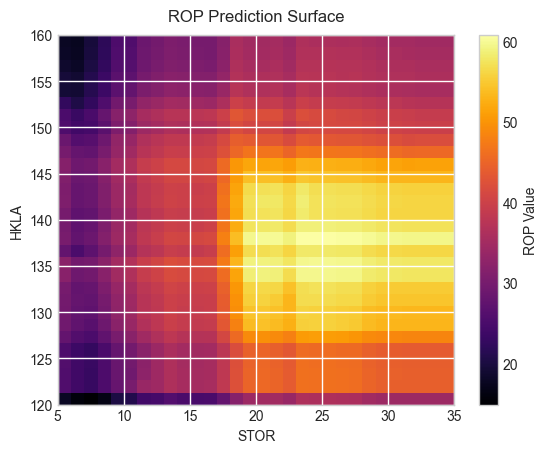

In [139]:
def predict(model, scaler, HKLA, SWOB, RPM, GR_CAL, STOR, TNPH, RHOB, DEPTH):
    """
    This function now correctly scales the input data before making a prediction.
    """
    # Define the feature order to match the training data
    feature_order = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB'] 
    
    # Create a DataFrame with the raw input data
    X_raw = pd.DataFrame([[HKLA, SWOB, RPM, GR_CAL, STOR, 350, 3100, 1.82, RHOB]], columns=feature_order)
    
    # Scale the data using the SAME scaler from training
    X_scaled = scaler.transform(X_raw)
    
    # Make the prediction on the scaled data
    rop_prediction = model.predict(X_scaled)[0]
    
    return rop_prediction

def plot_space(model, scaler, HKLA_vals, STOR_vals, constant_inputs):
    """
    Generates a 'clean' ROP prediction surface with smooth gradients,
    matching the new target image.
    """
    # Unpack constant values
    SWOB = constant_inputs['SWOB']
    RPM = constant_inputs['RPM']
    GR_CAL = constant_inputs['GR_CAL']
    TNPH = constant_inputs['TNPH']
    RHOB = constant_inputs['RHOB']
    DEPTH = constant_inputs['DEPTH']
    
    # Create the matrix to hold ROP predictions
    N_matrix = np.empty((len(HKLA_vals), len(STOR_vals)))
    
    # Loop through the grid and predict ROP for each point
    for i, hkla in enumerate(HKLA_vals):
        for j, stor in enumerate(STOR_vals):
            N_matrix[i, j] = predict(model, scaler, hkla, SWOB, RPM, GR_CAL, stor, TNPH, RHOB, DEPTH)

    # --- PLOTTING SECTION FOR A CLEAN/SMOOTH LOOK ---
    
    # Plot the heatmap. By *not* specifying interpolation, we get the default smooth look.
    plt.imshow(N_matrix, origin='lower', aspect='auto', cmap='inferno',
               extent=(min(STOR_vals), max(STOR_vals), min(HKLA_vals), max(HKLA_vals)))
    
    # Add grid lines with styling that matches the target
    plt.grid(True, color='white', linestyle='-', linewidth=1, alpha=1)
    
    # Set ticks to match the new ranges
    plt.xticks(np.arange(5, 36, 5))
    plt.yticks(np.arange(100, 161, 5))
    
    plt.xlabel('STOR')
    plt.ylabel('HKLA') 
    plt.title('ROP Prediction Surface', pad=10)    
    plt.colorbar(label='ROP Value')

    # Set axis limits to ensure the plot is framed correctly
    plt.xlim(min(STOR_vals), max(STOR_vals))
    plt.ylim(min(HKLA_vals), max(HKLA_vals))

    plt.show()

# Example usage
HKLA_range = np.linspace(120, 160, 30)
STOR_range = np.linspace(5, 35, 30)

constant_inputs = {
    'SWOB': 13,
    'RPM': 155,
    'GR_CAL': 90,
    'TNPH': 35.8,
    'RHOB': 2.47,
    'DEPTH': 3500
}

# Call the function with the scaler object
plot_space(rop_model, scaler, HKLA_range, STOR_range, constant_inputs)

MSE Heatmap

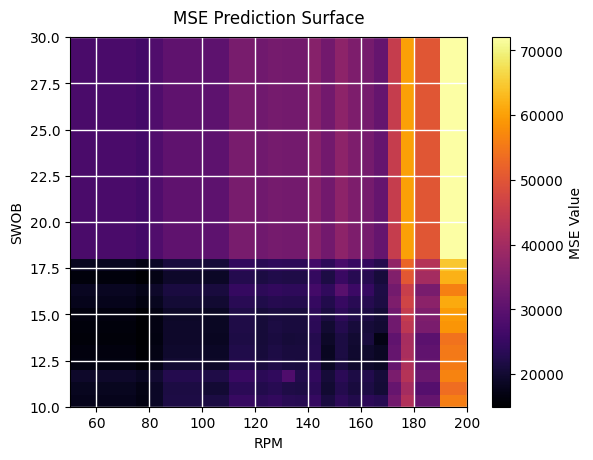

In [48]:
def predict(model, scaler, HKLA, SWOB, RPM, GR_CAL, STOR, TNPH, RHOB, DEPTH):
    """
    This function now correctly scales the input data before making a prediction.
    """
    # Define the feature order to match the training data
    feature_order = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'TNPH', 'RHOB', 'DEPTH'] 
    
    # Create a DataFrame with the raw input data
    X_raw = pd.DataFrame([[HKLA, SWOB, RPM, GR_CAL, STOR, TNPH, RHOB, DEPTH]], columns=feature_order)
    
    # Scale the data using the SAME scaler from training
    X_scaled = scaler.transform(X_raw)
    
    # Make the prediction on the scaled data
    mse_prediction = model.predict(X_scaled)[0]
    
    return mse_prediction

def plot_space(model, scaler, SWOB_vals, RPM_vals, constant_inputs):
    """
    Generates a 'clean' MSE prediction surface with smooth gradients,
    matching the new target image.
    """
    # Unpack constant values
    HKLA = constant_inputs['HKLA']
    GR_CAL = constant_inputs['GR_CAL'] 
    STOR = constant_inputs['STOR']
    TNPH = constant_inputs['TNPH']
    RHOB = constant_inputs['RHOB']
    DEPTH = constant_inputs['DEPTH']
    
    # Create the matrix to hold MSE predictions
    N_matrix = np.empty((len(SWOB_vals), len(RPM_vals)))
    
    # Loop through the grid and predict MSE for each point
    for i, swob in enumerate(SWOB_vals):
        for j, rpm in enumerate(RPM_vals):
            N_matrix[i, j] = predict(model, scaler, HKLA, swob, rpm, GR_CAL, STOR, TNPH, RHOB, DEPTH)

    # --- PLOTTING SECTION FOR A CLEAN/SMOOTH LOOK ---
    
    # Plot the heatmap. By *not* specifying interpolation, we get the default smooth look.
    plt.imshow(N_matrix, origin='lower', aspect='auto', cmap='inferno',
               extent=(min(RPM_vals), max(RPM_vals), min(SWOB_vals), max(SWOB_vals)))
    
    # Add grid lines with styling that matches the target
    plt.grid(True, color='white', linestyle='-', linewidth=1, alpha=1)
    
    # Set ticks to match the new target image (e.g., RPMs from 60-200, by 20)
    plt.xticks(np.arange(60, 201, 20))
    plt.yticks(np.arange(10, 31, 2.5))
    
    plt.xlabel('RPM')
    plt.ylabel('SWOB') 
    plt.title('MSE Prediction Surface', pad=10)    
    plt.colorbar(label='MSE Value')

    # Set axis limits to ensure the plot is framed correctly
    plt.xlim(min(RPM_vals), max(RPM_vals))
    plt.ylim(min(SWOB_vals), max(SWOB_vals))

    plt.show()

# Example usage
SWOB_range = np.linspace(10, 30, 30)
RPM_range = np.linspace(50, 200, 30)

constant_inputs = {
    'HKLA': 125,
    'GR_CAL': 90,
    'STOR': 10,
    'TNPH': 35.8,
    'RHOB': 2.47,
    'DEPTH': 2500
}

# Call the function with the scaler object
plot_space(mse_model, scaler, SWOB_range, RPM_range, constant_inputs)

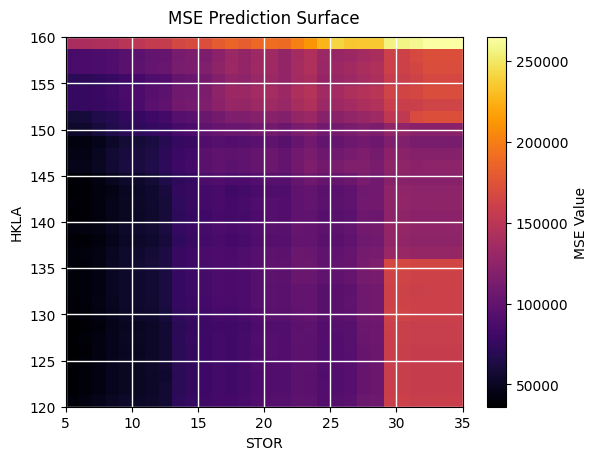

In [47]:
def predict(model, scaler, HKLA, SWOB, RPM, GR_CAL, STOR, TNPH, RHOB, DEPTH):
    """
    This function now correctly scales the input data before making a prediction.
    """
    # Define the feature order to match the training data
    feature_order = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'TNPH', 'RHOB', 'DEPTH'] 
    
    # Create a DataFrame with the raw input data
    X_raw = pd.DataFrame([[HKLA, SWOB, RPM, GR_CAL, STOR, TNPH, RHOB, DEPTH]], columns=feature_order)
    
    # Scale the data using the SAME scaler from training
    X_scaled = scaler.transform(X_raw)
    
    # Make the prediction on the scaled data
    mse_prediction = model.predict(X_scaled)[0]
    
    return mse_prediction

def plot_space(model, scaler, HKLA_vals, STOR_vals, constant_inputs):
    """
    Generates a 'clean' MSE prediction surface with smooth gradients,
    matching the new target image.
    """
    # Unpack constant values
    SWOB = constant_inputs['SWOB']
    RPM = constant_inputs['RPM']
    GR_CAL = constant_inputs['GR_CAL']
    TNPH = constant_inputs['TNPH']
    RHOB = constant_inputs['RHOB']
    DEPTH = constant_inputs['DEPTH']
    
    # Create the matrix to hold MSE predictions
    N_matrix = np.empty((len(HKLA_vals), len(STOR_vals)))
    
    # Loop through the grid and predict MSE for each point
    for i, hkla in enumerate(HKLA_vals):
        for j, stor in enumerate(STOR_vals):
            N_matrix[i, j] = predict(model, scaler, hkla, SWOB, RPM, GR_CAL, stor, TNPH, RHOB, DEPTH)

    # --- PLOTTING SECTION FOR A CLEAN/SMOOTH LOOK ---
    
    # Plot the heatmap. By *not* specifying interpolation, we get the default smooth look.
    plt.imshow(N_matrix, origin='lower', aspect='auto', cmap='inferno',
               extent=(min(STOR_vals), max(STOR_vals), min(HKLA_vals), max(HKLA_vals)))
    
    # Add grid lines with styling that matches the target
    plt.grid(True, color='white', linestyle='-', linewidth=1, alpha=1)
    
    # Set ticks to match the new ranges
    plt.xticks(np.arange(5, 36, 5))
    plt.yticks(np.arange(120, 161, 5))
    
    plt.xlabel('STOR')
    plt.ylabel('HKLA') 
    plt.title('MSE Prediction Surface', pad=10)    
    plt.colorbar(label='MSE Value')

    # Set axis limits to ensure the plot is framed correctly
    plt.xlim(min(STOR_vals), max(STOR_vals))
    plt.ylim(min(HKLA_vals), max(HKLA_vals))

    plt.show()

# Example usage
HKLA_range = np.linspace(120, 160, 30)
STOR_range = np.linspace(5, 35, 30)

constant_inputs = {
    'SWOB': 20,
    'RPM': 140,
    'GR_CAL': 45.68,
    'TNPH': 23.5,
    'RHOB': 2.56,
    'DEPTH': 2500
}

# Call the function with the scaler object
plot_space(mse_model, scaler, HKLA_range, STOR_range, constant_inputs)

MultiObjectivePSO

2025-07-16 13:35:09,043 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.5, 'c2': 0.7, 'w': 0.3}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.324
2025-07-16 13:35:18,085 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.3244721591472626, best pos: [ 159.37705001   18.22734534  143.98750263   15.28013639  236.0342059
 3422.65613409]



--- Weighted Multi-Objective PSO Results ---
Final weighted cost: 0.3245

Optimal controllable parameters:
RPM: 159.38
SWOB: 18.23
HKLA: 143.99
STOR: 15.28
SPPA: 236.03
TFLO: 3422.66

Objective Values at Optimal Solution:
Predicted ROP: 46.11
Predicted MSE: 31055.80


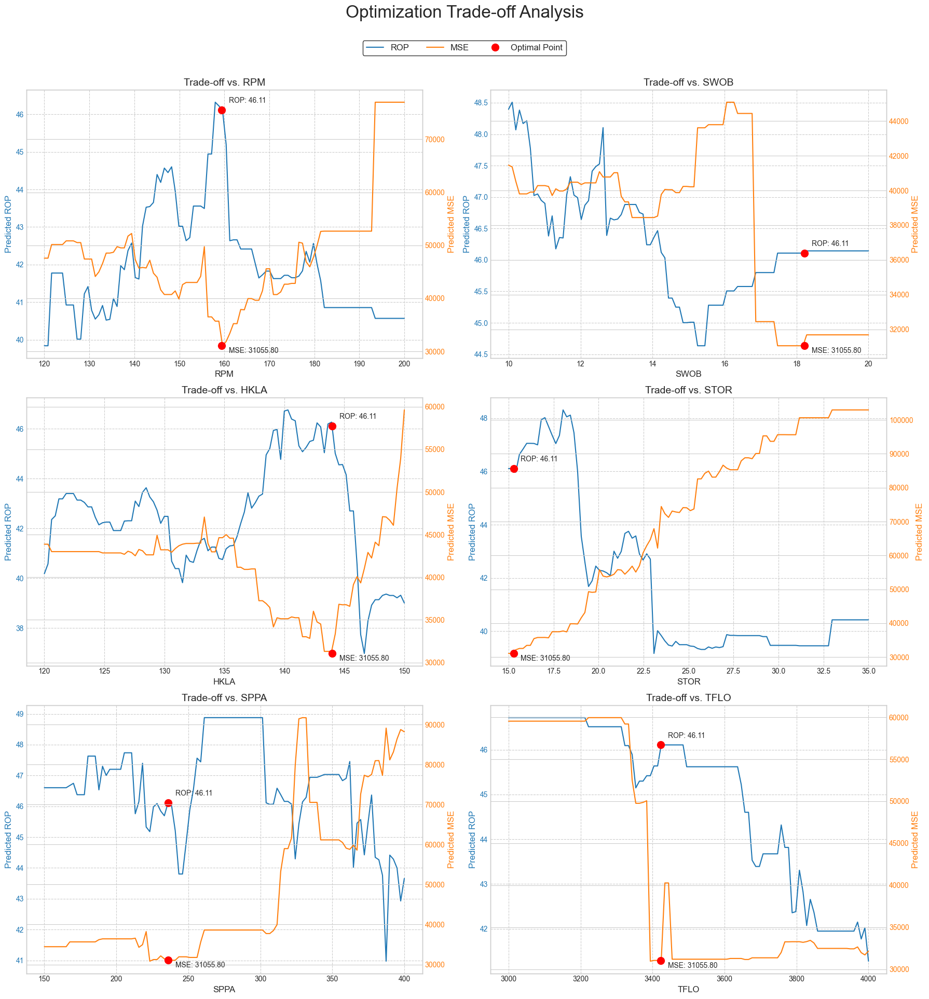

In [177]:
# === 0. FEATURE DEFINITION ===
feature_names = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB']


# === 1. DEFINE PROBLEM PARAMETERS ===

# Define the fixed, uncontrollable conditions for the optimization scenario 'GR_CAL': 45.68, 'RHOB': 2.56, 'ECD': 1.85 'GR_CAL': 90, 'RHOB': 2.47, 'ECD': 1.85
fixed_conditions = {
    'GR_CAL': 45.68, 'RHOB': 2.56, 'ECD': 1.85
}

# Define controllable features and their bounds
controllable_features = ['RPM', 'SWOB', 'HKLA', 'STOR', 'SPPA', 'TFLO']
lb_controllable = np.array([120, 10, 120, 15, 150, 3000])
ub_controllable = np.array([200, 20, 150, 35, 400, 4000])

# Define expected operational ranges for normalization
ROP_RANGE = [10, 150]
MSE_RANGE = [20000, 100000]

# Set random seed for reproducibility
np.random.seed(42)


# === 2. REVISED OBJECTIVE FUNCTION WITH NORMALIZATION ===

def weighted_objective(X, fixed_vals, feature_order, rop_m, mse_m, scaler_obj, rop_norm, mse_norm):
    """
    Calculates the weighted cost for a batch of particles (controllable parameters).
    This version normalizes ROP and MSE objectives and includes penalties for all soft constraints.

    Args:
        X (np.array): Particle positions from the optimizer (shape: [n_particles, n_controllable_vars])
        fixed_vals (dict): Dictionary of fixed feature values.
        feature_order (list): The exact order of features required by the model.
        rop_m: The trained ROP model.
        mse_m: The trained MSE model.
        scaler_obj: The fitted scaler.
        rop_norm (list): [min_rop, max_rop] for normalization.
        mse_norm (list): [min_mse, max_mse] for normalization.
    """
    n_particles = X.shape[0]

    # Reconstruct the full feature matrix for the model
    data = {key: np.full(n_particles, value) for key, value in fixed_vals.items()}
    for i, feature in enumerate(controllable_features):
        data[feature] = X[:, i]

    X_full_df = pd.DataFrame(data)[feature_order]

    # --- FIX ---
    # The original code incorrectly concatenated a dummy DataFrame, which altered the data.
    # The correct approach is to directly transform the DataFrame that has the correct
    # column names and order, which X_full_df already has.
    X_scaled = scaler_obj.transform(X_full_df)

    # --- Individual Objective Calculation & Normalization ---
    # 1. ROP Objective (Maximize, so we minimize 1 - normalized_rop)
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    # 2. MSE Objective (Minimize)
    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    # Clamp values to a [0, 1] range to handle predictions outside the expected norm range
    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # --- Soft Constraint Penalties ---
    # Penalize deviation from target ranges.
    # The penalty is normalized by the width of the target range.
    def calculate_penalty(values):
        target_width = values.max() - values.min()
        # Calculate deviation outside the bounds
        lower_deviation = np.maximum(0, values.min() - values)
        upper_deviation = np.maximum(0, values - values.max())
        deviation = lower_deviation + upper_deviation
        return deviation / target_width if target_width > 0 else 0

    # The order of X columns must match the order of controllable_features
    rpm_penalty = calculate_penalty(X[:, 0])   # RPM
    stor_penalty = calculate_penalty(X[:, 1]) # STOR
    hkla_penalty = calculate_penalty(X[:, 2]) # HKLA
    swob_penalty = calculate_penalty(X[:, 3]) # SWOB
    sppa_penalty = calculate_penalty(X[:, 4]) # SPPA
    tflo_penalty = calculate_penalty(X[:, 5]) # TFLO

    # --- Final Weighted Cost ---
    # Weights are adjusted to sum to 1.0. You can tune these as needed.
    # ROP: 40%, MSE: 20%, Soft Constraints: 40%
    penalty_weight = 0.40 / 6 # Distribute penalty weight among controllable features
    weighted_cost = (0.40 * rop_obj_normalized +
                     0.20 * mse_obj_normalized +
                     penalty_weight * rpm_penalty +
                     penalty_weight * stor_penalty +
                     penalty_weight * hkla_penalty +
                     penalty_weight * swob_penalty +
                     penalty_weight * sppa_penalty +
                     penalty_weight * tflo_penalty)

    return weighted_cost


# === 3. OPTIMIZATION EXECUTION ===

# Initialize optimizer
optimizer = GlobalBestPSO(
    n_particles=500,
    dimensions=len(controllable_features),
    options={'c1': 0.5, 'c2': 0.7, 'w': 0.3},
    bounds=(lb_controllable, ub_controllable)
)

# Create a wrapper function that matches the expected signature for the optimizer
def objective_wrapper(X):
    return weighted_objective(
        X,
        fixed_vals=fixed_conditions,
        feature_order=feature_names,
        rop_m=rop_model,
        mse_m=mse_model,
        scaler_obj=scaler,
        rop_norm=ROP_RANGE,
        mse_norm=MSE_RANGE
    )

# Run optimization
cost, pos = optimizer.optimize(objective_func=objective_wrapper, iters=100)

# Process and Display Results
print("\n--- Weighted Multi-Objective PSO Results ---")
print(f'Final weighted cost: {cost:.4f}')
print("\nOptimal controllable parameters:")
optimal_params = {feature: pos[i] for i, feature in enumerate(controllable_features)}
for name, value in optimal_params.items():
    print(f'{name}: {value:.2f}')

# Calculate individual objective values at the optimal solution
optimal_df_data = {**fixed_conditions, **optimal_params}
optimal_df = pd.DataFrame([optimal_df_data])[feature_names]
optimal_scaled = scaler.transform(optimal_df)

rop_value = rop_model.predict(optimal_scaled)[0]
mse_value = mse_model.predict(optimal_scaled)[0]

print("\nObjective Values at Optimal Solution:")
print(f'Predicted ROP: {rop_value:.2f}')
print(f'Predicted MSE: {mse_value:.2f}')


# === 4. VISUALIZATION ===

def plot_tradeoff(ax, param_name, param_range, optimal_pos_dict, fixed_vals, feature_order, rop_m, mse_m, scaler_obj):
    """
    Generates a trade-off plot for a single controllable parameter.
    """
    rop_predictions, mse_predictions = [], []

    # Calculate ROP/MSE across the parameter's range while holding others at optimal values
    for val in param_range:
        test_values = optimal_pos_dict.copy()
        test_values[param_name] = val

        test_df_data = {**fixed_vals, **test_values}
        test_df = pd.DataFrame([test_df_data])[feature_order]
        test_scaled = scaler_obj.transform(test_df)

        rop_predictions.append(rop_m.predict(test_scaled)[0])
        mse_predictions.append(mse_m.predict(test_scaled)[0])

    # Plot ROP on the primary y-axis
    ax.plot(param_range, rop_predictions, color='tab:blue', label='ROP')
    ax.set_xlabel(param_name, fontsize=12)
    ax.set_ylabel('Predicted ROP', color='tab:blue', fontsize=12)
    ax.tick_params(axis='y', labelcolor='tab:blue')
    ax.grid(True, linestyle='--')

    # Create a secondary y-axis for MSE
    ax2 = ax.twinx()
    ax2.plot(param_range, mse_predictions, color='tab:orange', label='MSE')
    ax2.set_ylabel('Predicted MSE', color='tab:orange', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='tab:orange')

    # Calculate optimal point values
    optimal_param_val = optimal_pos_dict[param_name]
    optimal_df_data = {**fixed_vals, **optimal_pos_dict}
    optimal_df = pd.DataFrame([optimal_df_data])[feature_order]
    optimal_scaled = scaler_obj.transform(optimal_df)
    optimal_rop_val = rop_m.predict(optimal_scaled)[0]
    optimal_mse_val = mse_m.predict(optimal_scaled)[0]

    # Plot optimal points with larger markers and labels
    ax.scatter(optimal_param_val, optimal_rop_val, color='red', s=100, zorder=5, label='Optimal Point')
    ax2.scatter(optimal_param_val, optimal_mse_val, color='red', s=100, zorder=5)
    
    # Add value annotations
    ax.annotate(f'ROP: {optimal_rop_val:.2f}', 
                xy=(optimal_param_val, optimal_rop_val),
                xytext=(10, 10), textcoords='offset points')
    ax2.annotate(f'MSE: {optimal_mse_val:.2f}',
                xy=(optimal_param_val, optimal_mse_val), 
                xytext=(10, -10), textcoords='offset points')

    ax.set_title(f'Trade-off vs. {param_name}', fontsize=14)

# Generate plots for all controllable features
fig, axes = plt.subplots(3, 2, figsize=(18, 20))
fig.suptitle('Optimization Trade-off Analysis', fontsize=24, y=0.96)
axes = axes.flatten()

for i, param_name in enumerate(controllable_features):
    param_plot_range = np.linspace(lb_controllable[i], ub_controllable[i], 100)
    plot_tradeoff(
        ax=axes[i],
        param_name=param_name,
        param_range=param_plot_range,
        optimal_pos_dict=optimal_params,
        fixed_vals=fixed_conditions,
        feature_order=feature_names,
        rop_m=rop_model,
        mse_m=mse_model,
        scaler_obj=scaler
    )

# Create unified legend
rop_line = axes[0].get_lines()[0]
mse_line = axes[0].get_shared_y_axes().get_siblings(axes[0])[0].get_lines()[0]
optimal_point = axes[0].collections[0]

# Create custom lines for legend with correct colors
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='tab:blue', label='ROP'),
    Line2D([0], [0], color='tab:orange', label='MSE'),
    Line2D([0], [0], marker='o', color='red', label='Optimal Point', 
           markersize=10, linestyle='None')
]

fig.legend(handles=legend_elements,
          loc='upper center',
          bbox_to_anchor=(0.5, 0.93),
          ncol=4,
          fontsize=12,
          frameon=True,
          edgecolor='black')

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

In [ ]:
def weighted_objective_v2(X, fixed_vals, feature_order, rop_m, mse_m, scaler_obj, rop_norm, mse_norm):
    """
    Calculates the weighted cost, now with soft constraint penalties on all four controllable parameters.
    """
    n_particles = X.shape[0]

    # Reconstruct the full feature matrix
    # X columns correspond to: [0:RPM, 1:STOR, 2:HKLA, 3:SWOB]
    data = {key: np.full(n_particles, value) for key, value in fixed_vals.items()}
    data['RPM'] = X[:, 0]
    data['STOR'] = X[:, 1]
    data['HKLA'] = X[:, 2]
    data['SWOB'] = X[:, 3]
    X_full_df = pd.DataFrame(data)[feature_order]

    X_scaled = scaler_obj.transform(X_full_df)

    # --- Performance Objectives ---
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # --- Soft Constraint Penalty Terms ---
    # Penalty for RPM deviation from its target range
    rpm_penalty = np.abs(X[:, 0] - np.mean(rpm_target_range)) / (rpm_target_range[1] - rpm_target_range[0])
    # Penalty for STOR deviation
    stor_penalty = np.abs(X[:, 1] - np.mean(stor_target_range)) / (stor_target_range[1] - stor_target_range[0])
    # Penalty for HKLA deviation
    hkla_penalty = np.abs(X[:, 2] - np.mean(hkla_target_range)) / (hkla_target_range[1] - hkla_target_range[0])
    # Penalty for SWOB deviation
    swob_penalty = np.abs(X[:, 3] - np.mean(swob_target_range)) / (swob_target_range[1] - swob_target_range[0])


    # --- Final Weighted Cost with New Weights ---
    # Weights: 40% ROP, 30% MSE, 7.5% for each of the 4 soft constraints
    # Total weight = 0.4 + 0.3 + 4 * 0.075 = 1.0
    weighted_cost = (0.4 * rop_obj_normalized +
                     0.3 * mse_obj_normalized +
                     0.075 * rpm_penalty +
                     0.075 * stor_penalty +
                     0.075 * hkla_penalty +
                     0.075 * swob_penalty)

    return weighted_cost

# --- To use this, you would update the objective_wrapper ---
def objective_wrapper_v2(X):
    return weighted_objective_v2(
        X,
        fixed_vals=fixed_conditions,
        feature_order=feature_names,
        rop_m=rop_model,
        mse_m=mse_model,
        scaler_obj=scaler,
        rop_norm=ROP_RANGE,
        mse_norm=MSE_RANGE
    )

### Optimization results for J31A

Running optimization for 31 depth points from 3370m to 4330m...
  Optimizing for DEPTH = 3370.00m (Lithology: c)


  Optimizing for DEPTH = 3403.00m (Lithology: c)
  Optimizing for DEPTH = 3436.00m (Lithology: c)
  Optimizing for DEPTH = 3469.00m (Lithology: c)
  Optimizing for DEPTH = 3502.00m (Lithology: c)
  Optimizing for DEPTH = 3535.00m (Lithology: c)
  Optimizing for DEPTH = 3568.00m (Lithology: c)
  Optimizing for DEPTH = 3601.00m (Lithology: c)
  Optimizing for DEPTH = 3634.00m (Lithology: c)
  Optimizing for DEPTH = 3667.00m (Lithology: c)
  Optimizing for DEPTH = 3700.00m (Lithology: c)
  Optimizing for DEPTH = 3733.00m (Lithology: c)
  Optimizing for DEPTH = 3766.00m (Lithology: c)
  Optimizing for DEPTH = 3799.00m (Lithology: c)
  Optimizing for DEPTH = 3832.00m (Lithology: c)
  Optimizing for DEPTH = 3865.00m (Lithology: c)
  Optimizing for DEPTH = 3898.00m (Lithology: c)
  Optimizing for DEPTH = 3931.00m (Lithology: c)
  Optimizing for DEPTH = 3964.00m (Lithology: c)
  Optimizing for DEPTH = 3997.00m (Lithology: c)
  Optimizing for DEPTH = 4030.00m (Lithology: c)
  Optimizing for DEP

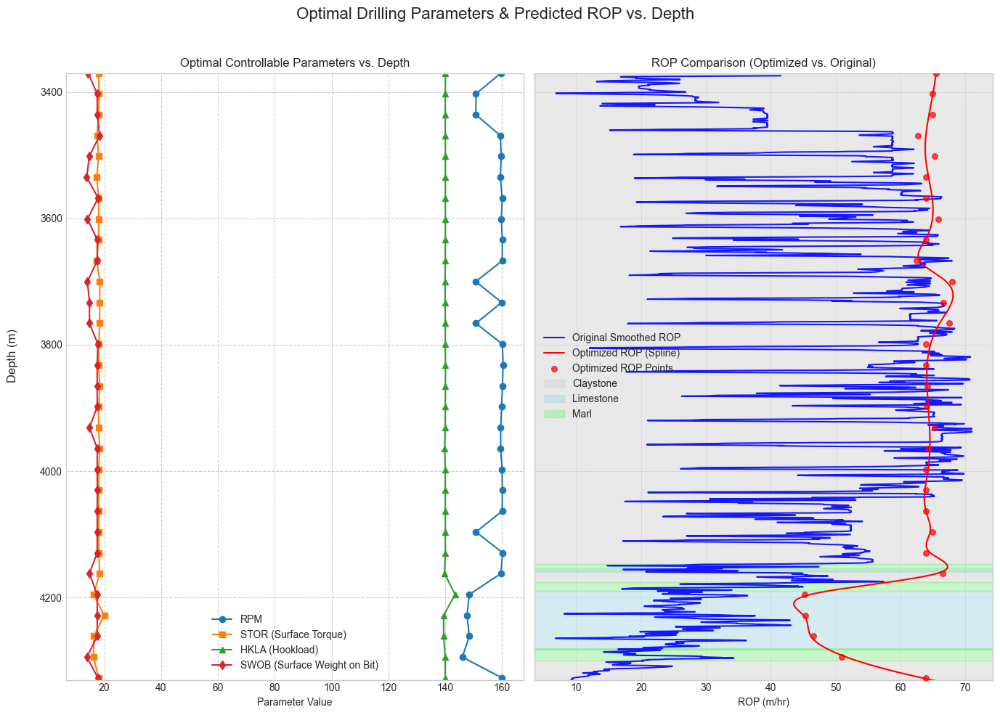

In [122]:
# Define the master list of feature names in the exact order the model expects.
ALL_FEATURE_NAMES = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB']

# Define controllable features that the optimizer will vary.
# IMPORTANT: The order here determines the order in the `bounds` and the `X` array in the objective function.
CONTROLLABLE_FEATURES = ['RPM', 'STOR', 'HKLA', 'SWOB', 'SPPA', 'TFLO']

# Define fixed features.
FIXED_FEATURES = ['GR_CAL', 'RHOB', 'ECD']

# Target ranges for specific features used in the cost function.
RPM_TARGET_RANGE = [100, 220]
SWOB_TARGET_RANGE = [10, 25]
HKLA_TARGET_RANGE = [120, 160]
STOR_TARGET_RANGE = [10, 22]
SPPA_TARGET_RANGE = [345, 360]
TFLO_TARGET_RANGE = [3000, 3250]

# Estimated min/max ranges for ROP and MSE for normalization.
ROP_NORM_RANGE = [10, 150]
MSE_NORM_RANGE = [20000, 100000]

# Define the bounds for the controllable features.
# Order MUST match CONTROLLABLE_FEATURES: [RPM, STOR, HKLA, SWOB, SPPA, TFLO]
LOWER_BOUNDS = np.array([100, 15, 120, 10, 345, 3000])
UPPER_BOUNDS = np.array([220, 25, 150, 25, 360, 3250])

# A default set of conditions in case a depth falls outside all defined ranges.
DEFAULT_FIXED_CONDITIONS = {
    'GR_CAL': 90,
    'RHOB': 2.47,
    'ECD': 1.85
}

# Define lithology mapping based on the values from the code snippet
LITHOLOGY_MAP = {
    'c': {  # Claystone
        'GR_CAL': 90.0,
        'RHOB': 2.47,
        'ECD': 1.85
    },
    'm': {  # Marl
        'GR_CAL': 67.63,
        'RHOB': 2.615,
        'ECD': 1.85
    },
    'l': {  # Limestone
        'GR_CAL': 45.68,
        'RHOB': 2.56,
        'ECD': 1.85
    },
    's': {  # Siltstone
        'GR_CAL': 90.0,
        'RHOB': 2.425,
        'ECD': 1.85
    }
}


def get_conditions_for_depth(depth, sections, mapping):
    """
    Finds the correct fixed conditions for a given depth based on lithology.

    Args:
        depth (float): The current drilling depth.
        sections (list): A list of tuples defining lithology sections.
        mapping (dict): A dictionary mapping lithology codes to parameters.

    Returns:
        dict: The dictionary of fixed parameters for that depth.
    """
    for (start, end), code in sections:
        if start <= depth <= end:
            return mapping.get(code, DEFAULT_FIXED_CONDITIONS)
    # If no section matches, return the default
    print(f"Warning: Depth {depth:.2f}m is outside defined lithology sections. Using default values.")
    return DEFAULT_FIXED_CONDITIONS


# --- 3. Pre-calculate indices for fast NumPy operations ---
CONTROLLABLE_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in CONTROLLABLE_FEATURES}
FIXED_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in FIXED_FEATURES}
OPTIMIZER_TO_FULL_FEATURE_MAP = [CONTROLLABLE_INDICES[name] for name in CONTROLLABLE_FEATURES]


# --- 4. Define the Objective Function ---
def weighted_objective(X, x_template, feature_map, rop_m, mse_m, scaler_obj, rop_norm, mse_norm):
    """
    Optimized objective function to be minimized.
    """
    num_particles = X.shape[0]
    X_full = np.tile(x_template, (num_particles, 1))
    X_full[:, feature_map] = X
    X_df = pd.DataFrame(X_full, columns=ALL_FEATURE_NAMES)
    X_scaled = scaler_obj.transform(X_df)

    # ROP Objective (Maximize -> Minimize 1 - normalized_rop)
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    # MSE Objective (Minimize)
    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    # Clamp values to handle predictions outside the norm range
    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # Penalty terms for controllable parameters
    # Optimizer X columns: [0:RPM, 1:STOR, 2:HKLA, 3:SWOB, 4:SPPA, 5:TFLO]
    rpm_penalty = np.abs(X[:, 0] - np.mean(RPM_TARGET_RANGE)) / (RPM_TARGET_RANGE[1] - RPM_TARGET_RANGE[0])
    stor_penalty = np.abs(X[:, 1] - np.mean(STOR_TARGET_RANGE)) / (STOR_TARGET_RANGE[1] - STOR_TARGET_RANGE[0])
    hkla_penalty = np.abs(X[:, 2] - np.mean(HKLA_TARGET_RANGE)) / (HKLA_TARGET_RANGE[1] - HKLA_TARGET_RANGE[0])
    swob_penalty = np.abs(X[:, 3] - np.mean(SWOB_TARGET_RANGE)) / (SWOB_TARGET_RANGE[1] - SWOB_TARGET_RANGE[0])
    sppa_penalty = np.abs(X[:, 4] - np.mean(SPPA_TARGET_RANGE)) / (SPPA_TARGET_RANGE[1] - SPPA_TARGET_RANGE[0])
    tflo_penalty = np.abs(X[:, 5] - np.mean(TFLO_TARGET_RANGE)) / (TFLO_TARGET_RANGE[1] - TFLO_TARGET_RANGE[0])

    # --- Final Weighted Cost ---
    # Weights are adjusted to sum to 1.0. You can tune these as needed.
    # ROP: 40%, MSE: 20%, Soft Constraints: 40%
    penalty_weight = 0.40 / 6 # Distribute penalty weight among controllable features
    weighted_cost = (0.40 * rop_obj_normalized +
                     0.20 * mse_obj_normalized +
                     penalty_weight * rpm_penalty +
                     penalty_weight * stor_penalty +
                     penalty_weight * hkla_penalty +
                     penalty_weight * swob_penalty +
                     penalty_weight * sppa_penalty +
                     penalty_weight * tflo_penalty)

    return weighted_cost


# --- 5. Main Optimization Loop ---

# Import required libraries
from functools import partial
from scipy.interpolate import UnivariateSpline

# Define the new depth range to test with a step of 29 meters
start_depth = 3370
end_depth = 4330
step = 33
depth_range = np.arange(start_depth, end_depth + step, step)

results_list = []
print(f"Running optimization for {len(depth_range)} depth points from {start_depth}m to {end_depth}m...")

for depth in depth_range:
    # --- DYNAMICALLY GET FIXED CONDITIONS --- This is the key change: get geology-based values for this depth.
    current_fixed_conditions = get_conditions_for_depth(depth, lithology_J31A.items(), LITHOLOGY_MAP)

    lithology_code = next((lith for (start, end), lith in lithology_J31A.items() if start <= depth <= end), "unknown")
    print(f"  Optimizing for DEPTH = {depth:.2f}m (Lithology: {lithology_code})")

    # --- Create the template array with the new dynamic fixed values ---
    X_template = np.zeros(len(ALL_FEATURE_NAMES))
    for name, index in FIXED_INDICES.items():
        X_template[index] = current_fixed_conditions[name]

    # --- Set up and Run Optimizer ---
    optimizer = GlobalBestPSO(
        n_particles=100,
        dimensions=len(CONTROLLABLE_FEATURES),
        options={'c1': 0.5, 'c2': 0.7, 'w': 0.3},
        bounds=(LOWER_BOUNDS, UPPER_BOUNDS)
    )

    objective_func = partial(
        weighted_objective,
        x_template=X_template, feature_map=OPTIMIZER_TO_FULL_FEATURE_MAP,
        rop_m=rop_model, mse_m=mse_model, scaler_obj=scaler,
        rop_norm=ROP_NORM_RANGE, mse_norm=MSE_NORM_RANGE
    )

    cost, pos = optimizer.optimize(objective_func=objective_func, iters=100, verbose=False)

    # --- Recalculate and Store Results ---
    optimal_point_full = X_template.copy()
    optimal_point_full[OPTIMIZER_TO_FULL_FEATURE_MAP] = pos
    optimal_df = pd.DataFrame([optimal_point_full], columns=ALL_FEATURE_NAMES)
    optimal_scaled = scaler.transform(optimal_df)
    rop_value = rop_model.predict(optimal_scaled)[0]
    mse_value = mse_model.predict(optimal_scaled)[0]

    result = {'DEPTH': depth, 'ROP_opt': rop_value, 'MSE_opt': mse_value, 'LITHOLOGY': lithology_code}
    for i, name in enumerate(CONTROLLABLE_FEATURES):
        result[name] = pos[i]
    results_list.append(result)


# --- 6. Process and Visualize Results ---

df_opt = pd.DataFrame(results_list)
print("\nOptimization complete.")
print(df_opt.head())

# Visualize the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10), sharey=True)
fig.suptitle('Optimal Drilling Parameters & Predicted ROP vs. Depth', fontsize=16)
fig.supylabel('Depth (m)', fontsize=12)

# --- Plot 1: Optimal Parameters vs. Depth ---
ax1.plot(df_opt['RPM'], df_opt['DEPTH'], marker='o', linestyle='-', label='RPM')
ax1.plot(df_opt['STOR'], df_opt['DEPTH'], marker='s', linestyle='-', label='STOR (Surface Torque)')
ax1.plot(df_opt['HKLA'], df_opt['DEPTH'], marker='^', linestyle='-', label='HKLA (Hookload)')
ax1.plot(df_opt['SWOB'], df_opt['DEPTH'], marker='d', linestyle='-', label='SWOB (Surface Weight on Bit)')
ax1.set_title('Optimal Controllable Parameters vs. Depth')
ax1.set_xlabel('Parameter Value')
ax1.grid(True, which='both', linestyle='--')
ax1.legend()
ax1.set_ylim(end_depth, start_depth)

# --- Plot 2: Predicted ROP vs. Depth ---
lithology_labels = {'c': 'Claystone', 's': 'Siltstone', 'l': 'Limestone', 'm': 'Marl'}
lithology_colors = {'c': 'lightgrey', 's': 'lightgoldenrodyellow', 'l': 'lightblue', 'm': 'lightgreen'}
legend_patches = []
for code, label in lithology_labels.items():
    if code in lithology_J31A.values():
        legend_patches.append(Patch(color=lithology_colors[code], alpha=0.5, label=label))
for (start, end), code in lithology_J31A.items():
    color = lithology_colors.get(code, 'white')
    ax2.axhspan(start, end, color=color, alpha=0.5, zorder=0)

depth_mask_J31A = (df_J31A['DEPTH'] >= start_depth) & (df_J31A['DEPTH'] <= end_depth)
df_filtered = df_J31A[depth_mask_J31A].copy()
df_filtered['ROP5_smoothed'] = df_filtered['ROP5'].rolling(window=10, center=True, min_periods=1).mean()
ax2.plot(df_filtered['ROP5_smoothed'], df_filtered['DEPTH'], color='blue', alpha=0.9, label='Original Smoothed ROP')

# --- Start of Corrected Spline Section ---
# Plot optimized ROP
# FIX 1: Sort by the independent variable, 'DEPTH'
df_opt_sorted = df_opt.sort_values('DEPTH').reset_index()

if len(df_opt_sorted) > 3:
    # FIX 2: Model ROP as a function of DEPTH -> spline(DEPTH, ROP)
    spline = UnivariateSpline(df_opt_sorted['DEPTH'], df_opt_sorted['ROP_opt'], s=len(df_opt_sorted)/2) # Added smoothing factor

    # FIX 3: Create a range for the independent variable, DEPTH
    depth_range_spline = np.linspace(df_opt_sorted['DEPTH'].min(), df_opt_sorted['DEPTH'].max(), 800)
    
    # FIX 4: Calculate the corresponding ROP values from the spline
    rop_spline = spline(depth_range_spline)
    
    # PLOT: Plot calculated ROP on the x-axis and the Depth range on the y-axis
    ax2.plot(rop_spline, depth_range_spline, color='red', linestyle='-', label='Optimized ROP (Spline)')
else:
    ax2.plot(df_opt_sorted['ROP_opt'], df_opt_sorted['DEPTH'], color='red', linestyle='-', label='Optimized ROP')
# --- End of Corrected Spline Section ---

ax2.scatter(df_opt['ROP_opt'], df_opt['DEPTH'], color='red', alpha=0.7, s=30, zorder=5, label='Optimized ROP Points')
ax2.set_xlabel('ROP (m/hr)')
ax2.set_title('ROP Comparison (Optimized vs. Original)')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

handles, labels = ax2.get_legend_handles_labels()
ax2.legend(handles=handles + legend_patches, loc='best')

plt.tight_layout(rect=[0.02, 0, 1, 0.96])
plt.show()

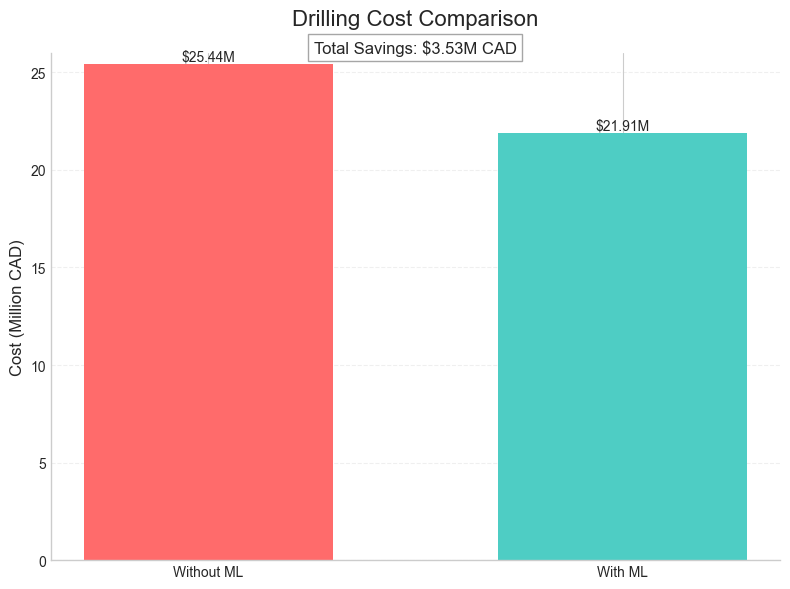

In [109]:
# Create bar chart comparing drilling costs with and without ML
fig, ax = plt.subplots(figsize=(8, 6))

# Plot data
data = {
    'Without ML': 25.44,
    'With ML': 21.91
}
bars = ax.bar(data.keys(), data.values(), 
              color=['#FF6B6B', '#4ECDC4'],  # Modern coral red and turquoise
              width=0.6)

# Styling
ax.set_title('Drilling Cost Comparison', fontsize=16, pad=20)
ax.set_ylabel('Cost (Million CAD)', fontsize=12)
ax.set_ylim(0, 26)

# Grid and spines
ax.yaxis.grid(True, linestyle='--', alpha=0.3)
ax.set_axisbelow(True)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height,
            f'${height:.2f}M',
            ha='center', va='bottom')

# Add savings callout
savings = data['Without ML'] - data['With ML']
ax.text(0.5, 26, f'Total Savings: ${savings:.2f}M CAD',
        ha='center', fontsize=12,
        bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

plt.tight_layout()
plt.show()

Running optimization for 33 depth points from 3370m to 4330m...
  Optimizing for DEPTH = 3370.00m (Lithology: c)
  Optimizing for DEPTH = 3400.00m (Lithology: c)
  Optimizing for DEPTH = 3430.00m (Lithology: c)
  Optimizing for DEPTH = 3460.00m (Lithology: c)
  Optimizing for DEPTH = 3490.00m (Lithology: c)
  Optimizing for DEPTH = 3520.00m (Lithology: c)
  Optimizing for DEPTH = 3550.00m (Lithology: c)
  Optimizing for DEPTH = 3580.00m (Lithology: c)
  Optimizing for DEPTH = 3610.00m (Lithology: c)
  Optimizing for DEPTH = 3640.00m (Lithology: c)
  Optimizing for DEPTH = 3670.00m (Lithology: c)
  Optimizing for DEPTH = 3700.00m (Lithology: c)
  Optimizing for DEPTH = 3730.00m (Lithology: c)
  Optimizing for DEPTH = 3760.00m (Lithology: c)
  Optimizing for DEPTH = 3790.00m (Lithology: c)
  Optimizing for DEPTH = 3820.00m (Lithology: c)
  Optimizing for DEPTH = 3850.00m (Lithology: c)
  Optimizing for DEPTH = 3880.00m (Lithology: c)
  Optimizing for DEPTH = 3910.00m (Lithology: c)
  Opt

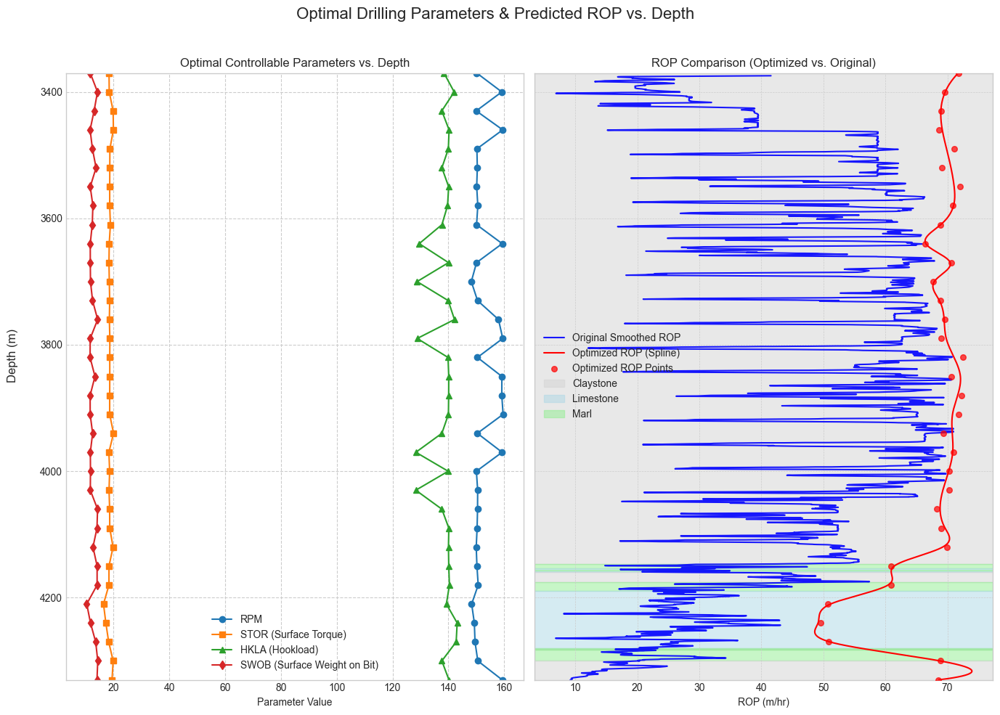

In [170]:
# Define the master list of feature names in the exact order the model expects.
ALL_FEATURE_NAMES = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB']

# Define controllable features that the optimizer will vary.
# IMPORTANT: The order here determines the order in the `bounds` and the `X` array in the objective function.
CONTROLLABLE_FEATURES = ['HKLA', 'SWOB', 'RPM', 'STOR', 'SPPA', 'TFLO']

# Define fixed features.
FIXED_FEATURES = ['GR_CAL', 'RHOB', 'ECD']

# Estimated min/max ranges for ROP and MSE for normalization.
ROP_NORM_RANGE = [10, 150]
MSE_NORM_RANGE = [20000, 100000]

# Define the bounds for the controllable features. These are the "hard" limits for the optimizer
# and also serve as the reference for the soft-constraint penalty.
# Order MUST match CONTROLLABLE_FEATURES: [HKLA, SWOB, RPM, STOR, SPPA, TFLO]
LOWER_BOUNDS = np.array([120, 10, 120, 15, 150, 3000])
UPPER_BOUNDS = np.array([150, 20, 200, 35, 400, 4000])

# A default set of conditions in case a depth falls outside all defined ranges.
DEFAULT_FIXED_CONDITIONS = {
    'GR_CAL': 90,
    'RHOB': 2.47,
    'ECD': 1.85
}

# Define lithology mapping based on the values from the code snippet
LITHOLOGY_MAP = {
    'c': {'GR_CAL': 90.0, 'RHOB': 2.47, 'ECD': 1.85},   # Claystone
    'm': {'GR_CAL': 67.63, 'RHOB': 2.615, 'ECD': 1.85}, # Marl
    'l': {'GR_CAL': 45.68, 'RHOB': 2.56, 'ECD': 1.85},   # Limestone
    's': {'GR_CAL': 90.0, 'RHOB': 2.425, 'ECD': 1.85}  # Siltstone
}

# --- 2. HELPER FUNCTIONS ---

def get_conditions_for_depth(depth, sections, mapping):
    """Finds the correct fixed conditions for a given depth based on lithology."""
    for (start, end), code in sections:
        if start <= depth <= end:
            return mapping.get(code, DEFAULT_FIXED_CONDITIONS)
    print(f"Warning: Depth {depth:.2f}m is outside defined lithology sections. Using default values.")
    return DEFAULT_FIXED_CONDITIONS

def calculate_penalty(values, lower_bound, upper_bound):
    """
    Calculates a normalized penalty for values outside the specified bounds (soft constraint).
    The penalty is 0 inside the bounds and increases linearly for values outside them.
    """
    bound_width = upper_bound - lower_bound
    if bound_width <= 0:
        return 0
    
    # Calculate deviation only for values outside the bounds
    lower_deviation = np.maximum(0, lower_bound - values)
    upper_deviation = np.maximum(0, values - upper_bound)
    total_deviation = lower_deviation + upper_deviation
    
    # Normalize by the width of the acceptable range
    return total_deviation / bound_width

# --- 3. PRE-CALCULATE INDICES ---
CONTROLLABLE_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in CONTROLLABLE_FEATURES}
FIXED_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in FIXED_FEATURES}
OPTIMIZER_TO_FULL_FEATURE_MAP = [CONTROLLABLE_INDICES[name] for name in CONTROLLABLE_FEATURES]

# --- 4. DEFINE THE OBJECTIVE FUNCTION ---
def weighted_objective(X, x_template, feature_map, rop_m, mse_m, scaler_obj, rop_norm, mse_norm, lower_bounds, upper_bounds):
    """
    Optimized objective function to be minimized, using soft-constraint penalties.
    """
    num_particles = X.shape[0]
    num_controllable = X.shape[1]
    
    # Reconstruct full feature matrix for all particles
    X_full = np.tile(x_template, (num_particles, 1))
    X_full[:, feature_map] = X
    X_df = pd.DataFrame(X_full, columns=ALL_FEATURE_NAMES)
    X_scaled = scaler_obj.transform(X_df)

    # ROP Objective (Maximize -> Minimize 1 - normalized_rop)
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    # MSE Objective (Minimize)
    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    # Clamp values to handle predictions outside the norm range
    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # --- Soft Constraint Penalties ---
    # Penalize deviation from the defined operational bounds.
    total_penalty = 0
    for i in range(num_controllable):
        # X[:, i] = values for one feature across all particles
        # lower_bounds[i] and upper_bounds[i] are the limits for that feature
        total_penalty += calculate_penalty(X[:, i], lower_bounds[i], upper_bounds[i])
    
    # Average the penalty across all controllable features
    average_penalty = total_penalty / num_controllable

    # --- Final Weighted Cost ---
    # Weights: ROP: 40%, MSE: 20%, Soft Constraints: 40%
    weighted_cost = (0.40 * rop_obj_normalized +
                     0.20 * mse_obj_normalized +
                     0.40 * average_penalty)

    return weighted_cost

# --- 5. MAIN OPTIMIZATION LOOP ---

# Define the depth range to test
start_depth = 3370
end_depth = 4330
step = 30
depth_range = np.arange(start_depth, end_depth + step, step)

results_list = []
print(f"Running optimization for {len(depth_range)} depth points from {start_depth}m to {end_depth}m...")

for depth in depth_range:
    # Get geology-based fixed values for the current depth
    current_fixed_conditions = get_conditions_for_depth(depth, lithology_J31A.items(), LITHOLOGY_MAP)
    lithology_code = next((lith for (start, end), lith in lithology_J31A.items() if start <= depth <= end), "unknown")
    print(f"  Optimizing for DEPTH = {depth:.2f}m (Lithology: {lithology_code})")

    # Create the template array with dynamic fixed values
    X_template = np.zeros(len(ALL_FEATURE_NAMES))
    for name, index in FIXED_INDICES.items():
        X_template[index] = current_fixed_conditions[name]

    # --- Set up and Run Optimizer ---
    optimizer = GlobalBestPSO(
        n_particles=300,
        dimensions=len(CONTROLLABLE_FEATURES),
        options={'c1': 0.5, 'c2': 0.7, 'w': 0.3},
        bounds=(LOWER_BOUNDS, UPPER_BOUNDS)
    )

    # Create the objective function with all necessary arguments fixed via `partial`
    objective_func = partial(
        weighted_objective,
        x_template=X_template,
        feature_map=OPTIMIZER_TO_FULL_FEATURE_MAP,
        rop_m=rop_model,
        mse_m=mse_model,
        scaler_obj=scaler,
        rop_norm=ROP_NORM_RANGE,
        mse_norm=MSE_NORM_RANGE,
        lower_bounds=LOWER_BOUNDS, # Pass the bounds for penalty calculation
        upper_bounds=UPPER_BOUNDS
    )

    cost, pos = optimizer.optimize(objective_func=objective_func, iters=100, verbose=False)

    # --- Recalculate and Store Results ---
    optimal_point_full = X_template.copy()
    optimal_point_full[OPTIMIZER_TO_FULL_FEATURE_MAP] = pos
    optimal_df = pd.DataFrame([optimal_point_full], columns=ALL_FEATURE_NAMES)
    optimal_scaled = scaler.transform(optimal_df)
    rop_value = rop_model.predict(optimal_scaled)[0]
    mse_value = mse_model.predict(optimal_scaled)[0]

    result = {'DEPTH': depth, 'ROP_opt': rop_value, 'MSE_opt': mse_value, 'LITHOLOGY': lithology_code}
    for i, name in enumerate(CONTROLLABLE_FEATURES):
        result[name] = pos[i]
    results_list.append(result)

# Convert results to a DataFrame for analysis
results_df = pd.DataFrame(results_list)
print("\n--- Optimization Complete ---")
print(results_df.head())

# --- 6. Process and Visualize Results ---

df_opt = pd.DataFrame(results_list)
print("\nOptimization complete.")
print(df_opt.head())

# Visualize the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10), sharey=True)
fig.suptitle('Optimal Drilling Parameters & Predicted ROP vs. Depth', fontsize=16)
fig.supylabel('Depth (m)', fontsize=12)

# --- Plot 1: Optimal Parameters vs. Depth ---
ax1.plot(df_opt['RPM'], df_opt['DEPTH'], marker='o', linestyle='-', label='RPM')
ax1.plot(df_opt['STOR'], df_opt['DEPTH'], marker='s', linestyle='-', label='STOR (Surface Torque)')
ax1.plot(df_opt['HKLA'], df_opt['DEPTH'], marker='^', linestyle='-', label='HKLA (Hookload)')
ax1.plot(df_opt['SWOB'], df_opt['DEPTH'], marker='d', linestyle='-', label='SWOB (Surface Weight on Bit)')
ax1.set_title('Optimal Controllable Parameters vs. Depth')
ax1.set_xlabel('Parameter Value')
ax1.grid(True, which='both', linestyle='--')
ax1.legend()
ax1.set_ylim(end_depth, start_depth)

# --- Plot 2: Predicted ROP vs. Depth ---
lithology_labels = {'c': 'Claystone', 's': 'Siltstone', 'l': 'Limestone', 'm': 'Marl'}
lithology_colors = {'c': 'lightgrey', 's': 'lightgoldenrodyellow', 'l': 'lightblue', 'm': 'lightgreen'}
legend_patches = []
for code, label in lithology_labels.items():
    if code in lithology_J31A.values():
        legend_patches.append(Patch(color=lithology_colors[code], alpha=0.5, label=label))
for (start, end), code in lithology_J31A.items():
    color = lithology_colors.get(code, 'white')
    ax2.axhspan(start, end, color=color, alpha=0.5, zorder=0)

depth_mask_J31A = (df_J31A['DEPTH'] >= start_depth) & (df_J31A['DEPTH'] <= end_depth)
df_filtered = df_J31A[depth_mask_J31A].copy()
df_filtered['ROP5_smoothed'] = df_filtered['ROP5'].rolling(window=10, center=True, min_periods=1).mean()
ax2.plot(df_filtered['ROP5_smoothed'], df_filtered['DEPTH'], color='blue', alpha=0.9, label='Original Smoothed ROP')

# --- Start of Corrected Spline Section ---
# Plot optimized ROP
# FIX 1: Sort by the independent variable, 'DEPTH'
df_opt_sorted = df_opt.sort_values('DEPTH').reset_index()

if len(df_opt_sorted) > 3:
    # FIX 2: Model ROP as a function of DEPTH -> spline(DEPTH, ROP)
    spline = UnivariateSpline(df_opt_sorted['DEPTH'], df_opt_sorted['ROP_opt'], s=len(df_opt_sorted)/2) # Added smoothing factor

    # FIX 3: Create a range for the independent variable, DEPTH
    depth_range_spline = np.linspace(df_opt_sorted['DEPTH'].min(), df_opt_sorted['DEPTH'].max(), 20000)
    
    # FIX 4: Calculate the corresponding ROP values from the spline
    rop_spline = spline(depth_range_spline)
    
    # PLOT: Plot calculated ROP on the x-axis and the Depth range on the y-axis
    ax2.plot(rop_spline, depth_range_spline, color='red', linestyle='-', label='Optimized ROP (Spline)')
else:
    ax2.plot(df_opt_sorted['ROP_opt'], df_opt_sorted['DEPTH'], color='red', linestyle='-', label='Optimized ROP')
# --- End of Corrected Spline Section ---

ax2.scatter(df_opt['ROP_opt'], df_opt['DEPTH'], color='red', alpha=0.7, s=30, zorder=5, label='Optimized ROP Points')
ax2.set_xlabel('ROP (m/hr)')
ax2.set_title('ROP Comparison (Optimized vs. Original)')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

handles, labels = ax2.get_legend_handles_labels()
ax2.legend(handles=handles + legend_patches, loc='best')

plt.tight_layout(rect=[0.02, 0, 1, 0.96])
plt.show()

### Optimization results for G_92

Running optimization for 24 depth points from 3440m to 4083m...
  Optimizing for DEPTH = 3440.00m (Lithology: c)


  Optimizing for DEPTH = 3468.00m (Lithology: c)
  Optimizing for DEPTH = 3496.00m (Lithology: c)
  Optimizing for DEPTH = 3524.00m (Lithology: c)
  Optimizing for DEPTH = 3552.00m (Lithology: c)
  Optimizing for DEPTH = 3580.00m (Lithology: c)
  Optimizing for DEPTH = 3608.00m (Lithology: c)
  Optimizing for DEPTH = 3636.00m (Lithology: c)
  Optimizing for DEPTH = 3664.00m (Lithology: c)
  Optimizing for DEPTH = 3692.00m (Lithology: c)
  Optimizing for DEPTH = 3720.00m (Lithology: c)
  Optimizing for DEPTH = 3748.00m (Lithology: c)
  Optimizing for DEPTH = 3776.00m (Lithology: m)
  Optimizing for DEPTH = 3804.00m (Lithology: l)
  Optimizing for DEPTH = 3832.00m (Lithology: l)
  Optimizing for DEPTH = 3860.00m (Lithology: l)
  Optimizing for DEPTH = 3888.00m (Lithology: m)
  Optimizing for DEPTH = 3916.00m (Lithology: c)
  Optimizing for DEPTH = 3944.00m (Lithology: c)
  Optimizing for DEPTH = 3972.00m (Lithology: c)
  Optimizing for DEPTH = 4000.00m (Lithology: c)
  Optimizing for DEP

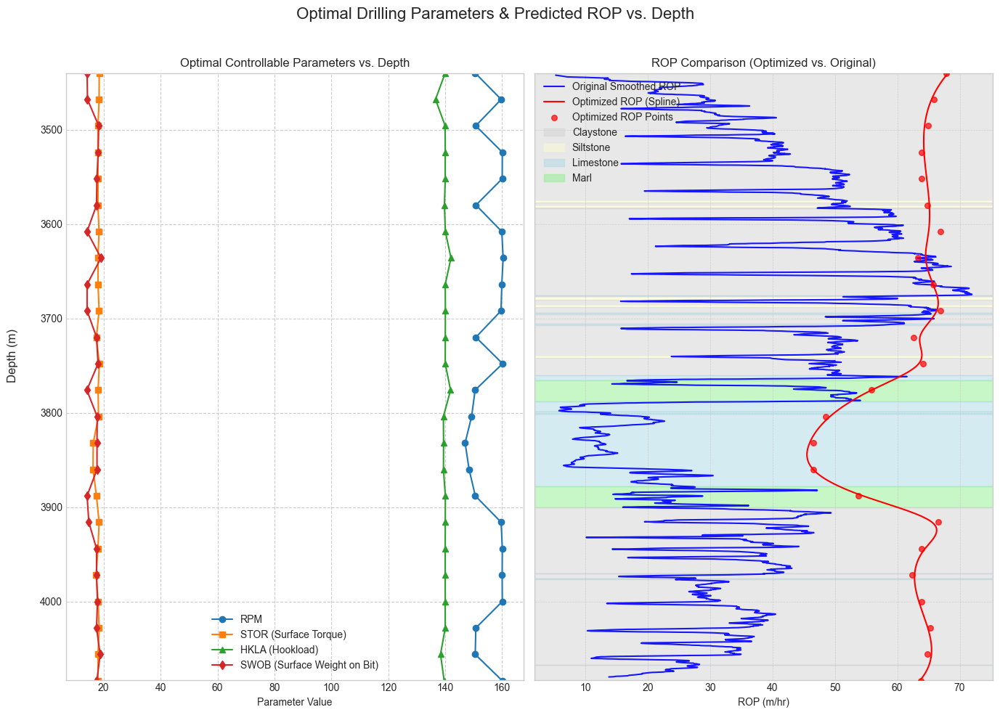

In [124]:
# Define the master list of feature names in the exact order the model expects.
ALL_FEATURE_NAMES = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB']

# Define controllable features that the optimizer will vary.
# IMPORTANT: The order here determines the order in the `bounds` and the `X` array in the objective function.
CONTROLLABLE_FEATURES = ['RPM', 'STOR', 'HKLA', 'SWOB', 'SPPA', 'TFLO']

# Define fixed features.
FIXED_FEATURES = ['GR_CAL', 'RHOB', 'ECD']

# Target ranges for specific features used in the cost function.
RPM_TARGET_RANGE = [100, 220]
SWOB_TARGET_RANGE = [10, 25]
HKLA_TARGET_RANGE = [120, 160]
STOR_TARGET_RANGE = [10, 22]
SPPA_TARGET_RANGE = [345, 360]
TFLO_TARGET_RANGE = [3000, 3250]

# Estimated min/max ranges for ROP and MSE for normalization.
ROP_NORM_RANGE = [10, 150]
MSE_NORM_RANGE = [20000, 100000]

# Define the bounds for the controllable features.
# Order MUST match CONTROLLABLE_FEATURES: [RPM, STOR, HKLA, SWOB, SPPA, TFLO]
LOWER_BOUNDS = np.array([100, 15, 120, 10, 345, 3000])
UPPER_BOUNDS = np.array([220, 25, 150, 25, 360, 3250])

# A default set of conditions in case a depth falls outside all defined ranges.
DEFAULT_FIXED_CONDITIONS = {
    'GR_CAL': 90,
    'RHOB': 2.47,
    'ECD': 1.85
}

# Define lithology mapping based on the values from the code snippet
LITHOLOGY_MAP = {
    'c': {  # Claystone
        'GR_CAL': 90.0,
        'RHOB': 2.47,
        'ECD': 1.85
    },
    'm': {  # Marl
        'GR_CAL': 67.63,
        'RHOB': 2.615,
        'ECD': 1.85
    },
    'l': {  # Limestone
        'GR_CAL': 45.68,
        'RHOB': 2.56,
        'ECD': 1.85
    },
    's': {  # Siltstone
        'GR_CAL': 90.0,
        'RHOB': 2.425,
        'ECD': 1.85
    }
}


def get_conditions_for_depth(depth, sections, mapping):
    """
    Finds the correct fixed conditions for a given depth based on lithology.

    Args:
        depth (float): The current drilling depth.
        sections (list): A list of tuples defining lithology sections.
        mapping (dict): A dictionary mapping lithology codes to parameters.

    Returns:
        dict: The dictionary of fixed parameters for that depth.
    """
    for (start, end), code in sections:
        if start <= depth <= end:
            return mapping.get(code, DEFAULT_FIXED_CONDITIONS)
    # If no section matches, return the default
    print(f"Warning: Depth {depth:.2f}m is outside defined lithology sections. Using default values.")
    return DEFAULT_FIXED_CONDITIONS


# --- 3. Pre-calculate indices for fast NumPy operations ---
CONTROLLABLE_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in CONTROLLABLE_FEATURES}
FIXED_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in FIXED_FEATURES}
OPTIMIZER_TO_FULL_FEATURE_MAP = [CONTROLLABLE_INDICES[name] for name in CONTROLLABLE_FEATURES]


# --- 4. Define the Objective Function ---
def weighted_objective(X, x_template, feature_map, rop_m, mse_m, scaler_obj, rop_norm, mse_norm):
    """
    Optimized objective function to be minimized.
    """
    num_particles = X.shape[0]
    X_full = np.tile(x_template, (num_particles, 1))
    X_full[:, feature_map] = X
    X_df = pd.DataFrame(X_full, columns=ALL_FEATURE_NAMES)
    X_scaled = scaler_obj.transform(X_df)

    # ROP Objective (Maximize -> Minimize 1 - normalized_rop)
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    # MSE Objective (Minimize)
    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    # Clamp values to handle predictions outside the norm range
    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # Penalty terms for controllable parameters
    # Optimizer X columns: [0:RPM, 1:STOR, 2:HKLA, 3:SWOB, 4:SPPA, 5:TFLO]
    rpm_penalty = np.abs(X[:, 0] - np.mean(RPM_TARGET_RANGE)) / (RPM_TARGET_RANGE[1] - RPM_TARGET_RANGE[0])
    stor_penalty = np.abs(X[:, 1] - np.mean(STOR_TARGET_RANGE)) / (STOR_TARGET_RANGE[1] - STOR_TARGET_RANGE[0])
    hkla_penalty = np.abs(X[:, 2] - np.mean(HKLA_TARGET_RANGE)) / (HKLA_TARGET_RANGE[1] - HKLA_TARGET_RANGE[0])
    swob_penalty = np.abs(X[:, 3] - np.mean(SWOB_TARGET_RANGE)) / (SWOB_TARGET_RANGE[1] - SWOB_TARGET_RANGE[0])
    sppa_penalty = np.abs(X[:, 4] - np.mean(SPPA_TARGET_RANGE)) / (SPPA_TARGET_RANGE[1] - SPPA_TARGET_RANGE[0])
    tflo_penalty = np.abs(X[:, 5] - np.mean(TFLO_TARGET_RANGE)) / (TFLO_TARGET_RANGE[1] - TFLO_TARGET_RANGE[0])

    # --- Final Weighted Cost ---
    # Weights are adjusted to sum to 1.0. You can tune these as needed.
    # ROP: 40%, MSE: 20%, Soft Constraints: 40%
    penalty_weight = 0.40 / 6 # Distribute penalty weight among controllable features
    weighted_cost = (0.40 * rop_obj_normalized +
                     0.20 * mse_obj_normalized +
                     penalty_weight * rpm_penalty +
                     penalty_weight * stor_penalty +
                     penalty_weight * hkla_penalty +
                     penalty_weight * swob_penalty +
                     penalty_weight * sppa_penalty +
                     penalty_weight * tflo_penalty)

    return weighted_cost


# --- 5. Main Optimization Loop ---

# Import required libraries
from functools import partial
from scipy.interpolate import UnivariateSpline

# Define the new depth range to test with a step of 29 meters
start_depth = 3440
end_depth = 4083
step = 28
depth_range = np.arange(start_depth, end_depth + step, step)

results_list = []
print(f"Running optimization for {len(depth_range)} depth points from {start_depth}m to {end_depth}m...")

for depth in depth_range:
    # --- DYNAMICALLY GET FIXED CONDITIONS --- This is the key change: get geology-based values for this depth.
    current_fixed_conditions = get_conditions_for_depth(depth, lithology_G92.items(), LITHOLOGY_MAP)

    lithology_code = next((lith for (start, end), lith in lithology_G92.items() if start <= depth <= end), "unknown")
    print(f"  Optimizing for DEPTH = {depth:.2f}m (Lithology: {lithology_code})")

    # --- Create the template array with the new dynamic fixed values ---
    X_template = np.zeros(len(ALL_FEATURE_NAMES))
    for name, index in FIXED_INDICES.items():
        X_template[index] = current_fixed_conditions[name]

    # --- Set up and Run Optimizer ---
    optimizer = GlobalBestPSO(
        n_particles=100,
        dimensions=len(CONTROLLABLE_FEATURES),
        options={'c1': 0.5, 'c2': 0.7, 'w': 0.3},
        bounds=(LOWER_BOUNDS, UPPER_BOUNDS)
    )

    objective_func = partial(
        weighted_objective,
        x_template=X_template, feature_map=OPTIMIZER_TO_FULL_FEATURE_MAP,
        rop_m=rop_model, mse_m=mse_model, scaler_obj=scaler,
        rop_norm=ROP_NORM_RANGE, mse_norm=MSE_NORM_RANGE
    )

    cost, pos = optimizer.optimize(objective_func=objective_func, iters=100, verbose=False)

    # --- Recalculate and Store Results ---
    optimal_point_full = X_template.copy()
    optimal_point_full[OPTIMIZER_TO_FULL_FEATURE_MAP] = pos
    optimal_df = pd.DataFrame([optimal_point_full], columns=ALL_FEATURE_NAMES)
    optimal_scaled = scaler.transform(optimal_df)
    rop_value = rop_model.predict(optimal_scaled)[0]
    mse_value = mse_model.predict(optimal_scaled)[0]

    result = {'DEPTH': depth, 'ROP_opt': rop_value, 'MSE_opt': mse_value, 'LITHOLOGY': lithology_code}
    for i, name in enumerate(CONTROLLABLE_FEATURES):
        result[name] = pos[i]
    results_list.append(result)


# --- 6. Process and Visualize Results ---

df_opt = pd.DataFrame(results_list)
print("\nOptimization complete.")
print(df_opt.head())

# Visualize the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10), sharey=True)
fig.suptitle('Optimal Drilling Parameters & Predicted ROP vs. Depth', fontsize=16)
fig.supylabel('Depth (m)', fontsize=12)

# --- Plot 1: Optimal Parameters vs. Depth ---
ax1.plot(df_opt['RPM'], df_opt['DEPTH'], marker='o', linestyle='-', label='RPM')
ax1.plot(df_opt['STOR'], df_opt['DEPTH'], marker='s', linestyle='-', label='STOR (Surface Torque)')
ax1.plot(df_opt['HKLA'], df_opt['DEPTH'], marker='^', linestyle='-', label='HKLA (Hookload)')
ax1.plot(df_opt['SWOB'], df_opt['DEPTH'], marker='d', linestyle='-', label='SWOB (Surface Weight on Bit)')
ax1.set_title('Optimal Controllable Parameters vs. Depth')
ax1.set_xlabel('Parameter Value')
ax1.grid(True, which='both', linestyle='--')
ax1.legend()
ax1.set_ylim(end_depth, start_depth)

# --- Plot 2: Predicted ROP vs. Depth ---
lithology_labels = {'c': 'Claystone', 's': 'Siltstone', 'l': 'Limestone', 'm': 'Marl'}
lithology_colors = {'c': 'lightgrey', 's': 'lightgoldenrodyellow', 'l': 'lightblue', 'm': 'lightgreen'}
legend_patches = []
for code, label in lithology_labels.items():
    if code in lithology_G92.values():
        legend_patches.append(Patch(color=lithology_colors[code], alpha=0.5, label=label))
for (start, end), code in lithology_G92.items():
    color = lithology_colors.get(code, 'white')
    ax2.axhspan(start, end, color=color, alpha=0.5, zorder=0)

depth_mask_G92 = (df_G92['DEPTH'] >= start_depth) & (df_G92['DEPTH'] <= end_depth)
df_filtered = df_G92[depth_mask_G92].copy()
df_filtered['ROP5_smoothed'] = df_filtered['ROP5'].rolling(window=10, center=True, min_periods=1).mean()
ax2.plot(df_filtered['ROP5_smoothed'], df_filtered['DEPTH'], color='blue', alpha=0.9, label='Original Smoothed ROP')

# --- Start of Corrected Spline Section ---
# Plot optimized ROP
# FIX 1: Sort by the independent variable, 'DEPTH'
df_opt_sorted = df_opt.sort_values('DEPTH').reset_index()

if len(df_opt_sorted) > 3:
    # FIX 2: Model ROP as a function of DEPTH -> spline(DEPTH, ROP)
    spline = UnivariateSpline(df_opt_sorted['DEPTH'], df_opt_sorted['ROP_opt'], s=len(df_opt_sorted)/2) # Added smoothing factor

    # FIX 3: Create a range for the independent variable, DEPTH
    depth_range_spline = np.linspace(df_opt_sorted['DEPTH'].min(), df_opt_sorted['DEPTH'].max(), 1200)
    
    # FIX 4: Calculate the corresponding ROP values from the spline
    rop_spline = spline(depth_range_spline)
    
    # PLOT: Plot calculated ROP on the x-axis and the Depth range on the y-axis
    ax2.plot(rop_spline, depth_range_spline, color='red', linestyle='-', label='Optimized ROP (Spline)')
else:
    ax2.plot(df_opt_sorted['ROP_opt'], df_opt_sorted['DEPTH'], color='red', linestyle='-', label='Optimized ROP')
# --- End of Corrected Spline Section ---

ax2.scatter(df_opt['ROP_opt'], df_opt['DEPTH'], color='red', alpha=0.7, s=30, zorder=5, label='Optimized ROP Points')
ax2.set_xlabel('ROP (m/hr)')
ax2.set_title('ROP Comparison (Optimized vs. Original)')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

handles, labels = ax2.get_legend_handles_labels()
ax2.legend(handles=handles + legend_patches, loc='best')

plt.tight_layout(rect=[0.02, 0, 1, 0.96])
plt.show()

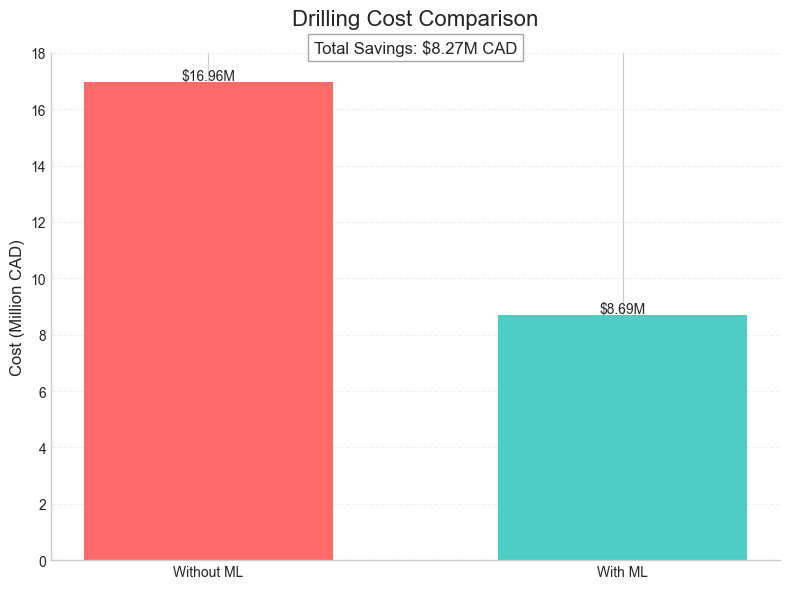

In [178]:
# Create bar chart comparing drilling costs with and without ML
fig, ax = plt.subplots(figsize=(8, 6))

# Plot data
data = {
    'Without ML': 16.96,
    'With ML': 8.69    
}
bars = ax.bar(data.keys(), data.values(), 
              color=['#FF6B6B', '#4ECDC4'],  # Modern coral red and turquoise
              width=0.6)

# Styling
ax.set_title('Drilling Cost Comparison', fontsize=16, pad=20)
ax.set_ylabel('Cost (Million CAD)', fontsize=12)
ax.set_ylim(0, 18)

# Grid and spines
ax.yaxis.grid(True, linestyle='--', alpha=0.3)
ax.set_axisbelow(True)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height,
            f'${height:.2f}M',
            ha='center', va='bottom')

# Add savings callout
savings = data['Without ML'] - data['With ML']
ax.text(0.5, 18, f'Total Savings: ${savings:.2f}M CAD',
        ha='center', fontsize=12,
        bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

plt.tight_layout()
plt.show()

Running optimization for 22 depth points from 3440m to 4083m...
  Optimizing for DEPTH = 3440.00m (Lithology: c)


  Optimizing for DEPTH = 3471.00m (Lithology: c)
  Optimizing for DEPTH = 3502.00m (Lithology: c)
  Optimizing for DEPTH = 3533.00m (Lithology: c)
  Optimizing for DEPTH = 3564.00m (Lithology: c)
  Optimizing for DEPTH = 3595.00m (Lithology: c)
  Optimizing for DEPTH = 3626.00m (Lithology: c)
  Optimizing for DEPTH = 3657.00m (Lithology: c)
  Optimizing for DEPTH = 3688.00m (Lithology: s)
  Optimizing for DEPTH = 3719.00m (Lithology: c)
  Optimizing for DEPTH = 3750.00m (Lithology: c)
  Optimizing for DEPTH = 3781.00m (Lithology: m)
  Optimizing for DEPTH = 3812.00m (Lithology: l)
  Optimizing for DEPTH = 3843.00m (Lithology: l)
  Optimizing for DEPTH = 3874.00m (Lithology: l)
  Optimizing for DEPTH = 3905.00m (Lithology: c)
  Optimizing for DEPTH = 3936.00m (Lithology: c)
  Optimizing for DEPTH = 3967.00m (Lithology: c)
  Optimizing for DEPTH = 3998.00m (Lithology: c)
  Optimizing for DEPTH = 4029.00m (Lithology: c)
  Optimizing for DEPTH = 4060.00m (Lithology: c)
  Optimizing for DEP

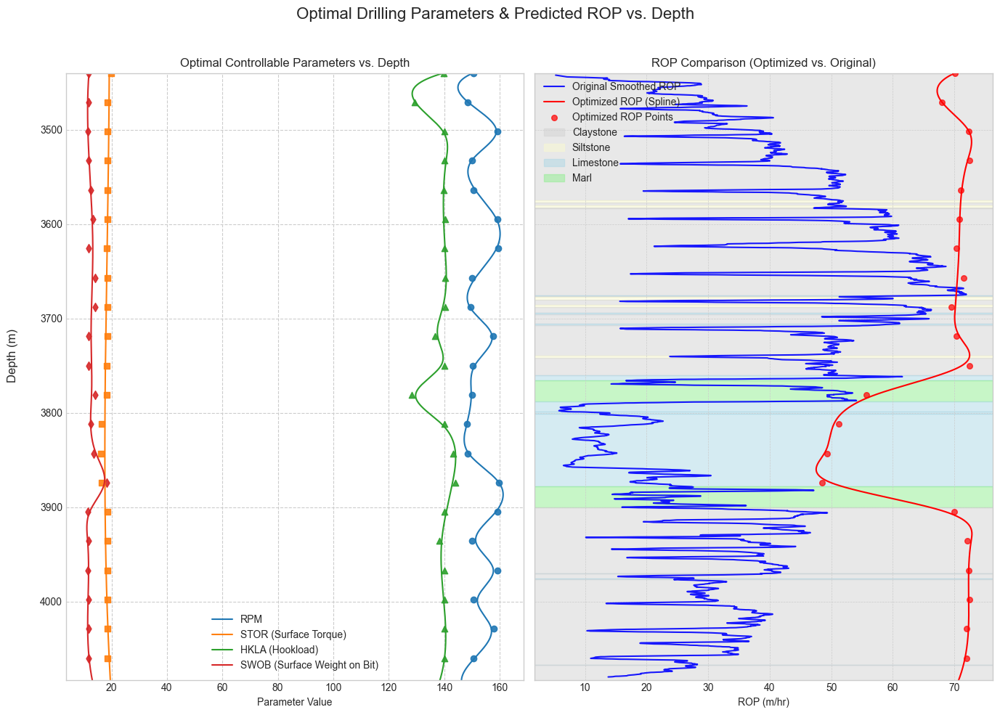

In [176]:
# Define the master list of feature names in the exact order the model expects.
ALL_FEATURE_NAMES = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB']

# Define controllable features that the optimizer will vary.
# IMPORTANT: The order here determines the order in the `bounds` and the `X` array in the objective function.
CONTROLLABLE_FEATURES = ['HKLA', 'SWOB', 'RPM', 'STOR', 'SPPA', 'TFLO']

# Define fixed features.
FIXED_FEATURES = ['GR_CAL', 'RHOB', 'ECD']

# Estimated min/max ranges for ROP and MSE for normalization.
ROP_NORM_RANGE = [10, 150]
MSE_NORM_RANGE = [20000, 100000]

# Define the bounds for the controllable features. These are the "hard" limits for the optimizer
# and also serve as the reference for the soft-constraint penalty.
# Order MUST match CONTROLLABLE_FEATURES: [HKLA, SWOB, RPM, STOR, SPPA, TFLO]
LOWER_BOUNDS = np.array([120, 10, 120, 15, 150, 3000])
UPPER_BOUNDS = np.array([150, 20, 200, 35, 400, 4000])

# A default set of conditions in case a depth falls outside all defined ranges.
DEFAULT_FIXED_CONDITIONS = {
    'GR_CAL': 90,
    'RHOB': 2.47,
    'ECD': 1.85
}

# Define lithology mapping based on the values from the code snippet
LITHOLOGY_MAP = {
    'c': {'GR_CAL': 90.0, 'RHOB': 2.47, 'ECD': 1.85},   # Claystone
    'm': {'GR_CAL': 67.63, 'RHOB': 2.615, 'ECD': 1.85}, # Marl
    'l': {'GR_CAL': 45.68, 'RHOB': 2.56, 'ECD': 1.85},   # Limestone
    's': {'GR_CAL': 90.0, 'RHOB': 2.425, 'ECD': 1.85}  # Siltstone
}

# --- 2. HELPER FUNCTIONS ---

def get_conditions_for_depth(depth, sections, mapping):
    """Finds the correct fixed conditions for a given depth based on lithology."""
    for (start, end), code in sections:
        if start <= depth <= end:
            return mapping.get(code, DEFAULT_FIXED_CONDITIONS)
    print(f"Warning: Depth {depth:.2f}m is outside defined lithology sections. Using default values.")
    return DEFAULT_FIXED_CONDITIONS

def calculate_penalty(values, lower_bound, upper_bound):
    """
    Calculates a normalized penalty for values outside the specified bounds (soft constraint).
    The penalty is 0 inside the bounds and increases linearly for values outside them.
    """
    bound_width = upper_bound - lower_bound
    if bound_width <= 0:
        return 0
    
    # Calculate deviation only for values outside the bounds
    lower_deviation = np.maximum(0, lower_bound - values)
    upper_deviation = np.maximum(0, values - upper_bound)
    total_deviation = lower_deviation + upper_deviation
    
    # Normalize by the width of the acceptable range
    return total_deviation / bound_width

# --- 3. PRE-CALCULATE INDICES ---
CONTROLLABLE_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in CONTROLLABLE_FEATURES}
FIXED_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in FIXED_FEATURES}
OPTIMIZER_TO_FULL_FEATURE_MAP = [CONTROLLABLE_INDICES[name] for name in CONTROLLABLE_FEATURES]

# --- 4. DEFINE THE OBJECTIVE FUNCTION ---
def weighted_objective(X, x_template, feature_map, rop_m, mse_m, scaler_obj, rop_norm, mse_norm, lower_bounds, upper_bounds):
    """
    Optimized objective function to be minimized, using soft-constraint penalties.
    """
    num_particles = X.shape[0]
    num_controllable = X.shape[1]
    
    # Reconstruct full feature matrix for all particles
    X_full = np.tile(x_template, (num_particles, 1))
    X_full[:, feature_map] = X
    X_df = pd.DataFrame(X_full, columns=ALL_FEATURE_NAMES)
    X_scaled = scaler_obj.transform(X_df)

    # ROP Objective (Maximize -> Minimize 1 - normalized_rop)
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    # MSE Objective (Minimize)
    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    # Clamp values to handle predictions outside the norm range
    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # --- Soft Constraint Penalties ---
    # Penalize deviation from the defined operational bounds.
    total_penalty = 0
    for i in range(num_controllable):
        # X[:, i] = values for one feature across all particles
        # lower_bounds[i] and upper_bounds[i] are the limits for that feature
        total_penalty += calculate_penalty(X[:, i], lower_bounds[i], upper_bounds[i])
    
    # Average the penalty across all controllable features
    average_penalty = total_penalty / num_controllable

    # --- Final Weighted Cost ---
    # Weights: ROP: 40%, MSE: 20%, Soft Constraints: 40%
    weighted_cost = (0.40 * rop_obj_normalized +
                     0.20 * mse_obj_normalized +
                     0.40 * average_penalty)

    return weighted_cost

# --- 5. MAIN OPTIMIZATION LOOP ---

# Define the depth range to test
start_depth = 3440
end_depth = 4083
step = 31
depth_range = np.arange(start_depth, end_depth + step, step)

results_list = []
print(f"Running optimization for {len(depth_range)} depth points from {start_depth}m to {end_depth}m...")

for depth in depth_range:
    # Get geology-based fixed values for the current depth
    current_fixed_conditions = get_conditions_for_depth(depth, lithology_G92.items(), LITHOLOGY_MAP)
    lithology_code = next((lith for (start, end), lith in lithology_G92.items() if start <= depth <= end), "unknown")
    print(f"  Optimizing for DEPTH = {depth:.2f}m (Lithology: {lithology_code})")

    # Create the template array with dynamic fixed values
    X_template = np.zeros(len(ALL_FEATURE_NAMES))
    for name, index in FIXED_INDICES.items():
        X_template[index] = current_fixed_conditions[name]

    # --- Set up and Run Optimizer ---
    optimizer = GlobalBestPSO(
        n_particles=300,
        dimensions=len(CONTROLLABLE_FEATURES),
        options={'c1': 0.5, 'c2': 0.7, 'w': 0.3},
        bounds=(LOWER_BOUNDS, UPPER_BOUNDS)
    )

    # Create the objective function with all necessary arguments fixed via `partial`
    objective_func = partial(
        weighted_objective,
        x_template=X_template,
        feature_map=OPTIMIZER_TO_FULL_FEATURE_MAP,
        rop_m=rop_model,
        mse_m=mse_model,
        scaler_obj=scaler,
        rop_norm=ROP_NORM_RANGE,
        mse_norm=MSE_NORM_RANGE,
        lower_bounds=LOWER_BOUNDS, # Pass the bounds for penalty calculation
        upper_bounds=UPPER_BOUNDS
    )

    cost, pos = optimizer.optimize(objective_func=objective_func, iters=100, verbose=False)

    # --- Recalculate and Store Results ---
    optimal_point_full = X_template.copy()
    optimal_point_full[OPTIMIZER_TO_FULL_FEATURE_MAP] = pos
    optimal_df = pd.DataFrame([optimal_point_full], columns=ALL_FEATURE_NAMES)
    optimal_scaled = scaler.transform(optimal_df)
    rop_value = rop_model.predict(optimal_scaled)[0]
    mse_value = mse_model.predict(optimal_scaled)[0]

    result = {'DEPTH': depth, 'ROP_opt': rop_value, 'MSE_opt': mse_value, 'LITHOLOGY': lithology_code}
    for i, name in enumerate(CONTROLLABLE_FEATURES):
        result[name] = pos[i]
    results_list.append(result)

# Convert results to a DataFrame for analysis
results_df = pd.DataFrame(results_list)
print("\n--- Optimization Complete ---")
print(results_df.head())

# --- 6. Process and Visualize Results ---

df_opt = pd.DataFrame(results_list)
print("\nOptimization complete.")
print(df_opt.head())

# Visualize the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10), sharey=True)
fig.suptitle('Optimal Drilling Parameters & Predicted ROP vs. Depth', fontsize=16)
fig.supylabel('Depth (m)', fontsize=12)

# --- Plot 1: Optimal Parameters vs. Depth ---
# Sort data by depth
df_opt_sorted = df_opt.sort_values('DEPTH').reset_index()

# Create depth range for splines
depth_range = np.linspace(df_opt_sorted['DEPTH'].min(), df_opt_sorted['DEPTH'].max(), 10000)

# Create and plot splines for each parameter
for param, marker, label in [
    ('RPM', 'o', 'RPM'),
    ('STOR', 's', 'STOR (Surface Torque)'),
    ('HKLA', '^', 'HKLA (Hookload)'),
    ('SWOB', 'd', 'SWOB (Surface Weight on Bit)')
]:
    spline = UnivariateSpline(df_opt_sorted['DEPTH'], df_opt_sorted[param], s=len(df_opt_sorted)/2)
    param_spline = spline(depth_range)
    ax1.plot(param_spline, depth_range, linestyle='-', label=label)
    ax1.scatter(df_opt_sorted[param], df_opt_sorted['DEPTH'], marker=marker, alpha=0.9)

ax1.set_title('Optimal Controllable Parameters vs. Depth')
ax1.set_xlabel('Parameter Value')
ax1.grid(True, which='both', linestyle='--')
ax1.legend()
ax1.set_ylim(end_depth, start_depth)

# --- Plot 2: Predicted ROP vs. Depth ---
lithology_labels = {'c': 'Claystone', 's': 'Siltstone', 'l': 'Limestone', 'm': 'Marl'}
lithology_colors = {'c': 'lightgrey', 's': 'lightgoldenrodyellow', 'l': 'lightblue', 'm': 'lightgreen'}
legend_patches = []
for code, label in lithology_labels.items():
    if code in lithology_G92.values():
        legend_patches.append(Patch(color=lithology_colors[code], alpha=0.5, label=label))
for (start, end), code in lithology_G92.items():
    color = lithology_colors.get(code, 'white')
    ax2.axhspan(start, end, color=color, alpha=0.5, zorder=0)

depth_mask_G92 = (df_G92['DEPTH'] >= start_depth) & (df_G92['DEPTH'] <= end_depth)
df_filtered = df_G92[depth_mask_G92].copy()
df_filtered['ROP5_smoothed'] = df_filtered['ROP5'].rolling(window=10, center=True, min_periods=1).mean()
ax2.plot(df_filtered['ROP5_smoothed'], df_filtered['DEPTH'], color='blue', alpha=0.9, label='Original Smoothed ROP')

# --- Start of Corrected Spline Section ---
# Plot optimized ROP
# FIX 1: Sort by the independent variable, 'DEPTH'
df_opt_sorted = df_opt.sort_values('DEPTH').reset_index()

if len(df_opt_sorted) > 3:
    # FIX 2: Model ROP as a function of DEPTH -> spline(DEPTH, ROP)
    spline = UnivariateSpline(df_opt_sorted['DEPTH'], df_opt_sorted['ROP_opt'], s=len(df_opt_sorted)/2) # Added smoothing factor

    # FIX 3: Create a range for the independent variable, DEPTH
    depth_range_spline = np.linspace(df_opt_sorted['DEPTH'].min(), df_opt_sorted['DEPTH'].max(), 20000)
    
    # FIX 4: Calculate the corresponding ROP values from the spline
    rop_spline = spline(depth_range_spline)
    
    # PLOT: Plot calculated ROP on the x-axis and the Depth range on the y-axis
    ax2.plot(rop_spline, depth_range_spline, color='red', linestyle='-', label='Optimized ROP (Spline)')
else:
    ax2.plot(df_opt_sorted['ROP_opt'], df_opt_sorted['DEPTH'], color='red', linestyle='-', label='Optimized ROP')
# --- End of Corrected Spline Section ---

ax2.scatter(df_opt['ROP_opt'], df_opt['DEPTH'], color='red', alpha=0.7, s=30, zorder=5, label='Optimized ROP Points')
ax2.set_xlabel('ROP (m/hr)')
ax2.set_title('ROP Comparison (Optimized vs. Original)')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

handles, labels = ax2.get_legend_handles_labels()
ax2.legend(handles=handles + legend_patches, loc='best')

plt.tight_layout(rect=[0.02, 0, 1, 0.96])
plt.show()

### Optimization results for K67Z

Running optimization for 32 depth points from 2093m to 3155m...
  Optimizing for DEPTH = 2093.00m (Lithology: c)


  Optimizing for DEPTH = 2128.00m (Lithology: c)
  Optimizing for DEPTH = 2163.00m (Lithology: c)
  Optimizing for DEPTH = 2198.00m (Lithology: c)
  Optimizing for DEPTH = 2233.00m (Lithology: c)
  Optimizing for DEPTH = 2268.00m (Lithology: c)
  Optimizing for DEPTH = 2303.00m (Lithology: c)
  Optimizing for DEPTH = 2338.00m (Lithology: c)
  Optimizing for DEPTH = 2373.00m (Lithology: c)
  Optimizing for DEPTH = 2408.00m (Lithology: c)
  Optimizing for DEPTH = 2443.00m (Lithology: c)
  Optimizing for DEPTH = 2478.00m (Lithology: c)
  Optimizing for DEPTH = 2513.00m (Lithology: c)
  Optimizing for DEPTH = 2548.00m (Lithology: c)
  Optimizing for DEPTH = 2583.00m (Lithology: c)
  Optimizing for DEPTH = 2618.00m (Lithology: c)
  Optimizing for DEPTH = 2653.00m (Lithology: c)
  Optimizing for DEPTH = 2688.00m (Lithology: c)
  Optimizing for DEPTH = 2723.00m (Lithology: c)
  Optimizing for DEPTH = 2758.00m (Lithology: c)
  Optimizing for DEPTH = 2793.00m (Lithology: c)
  Optimizing for DEP

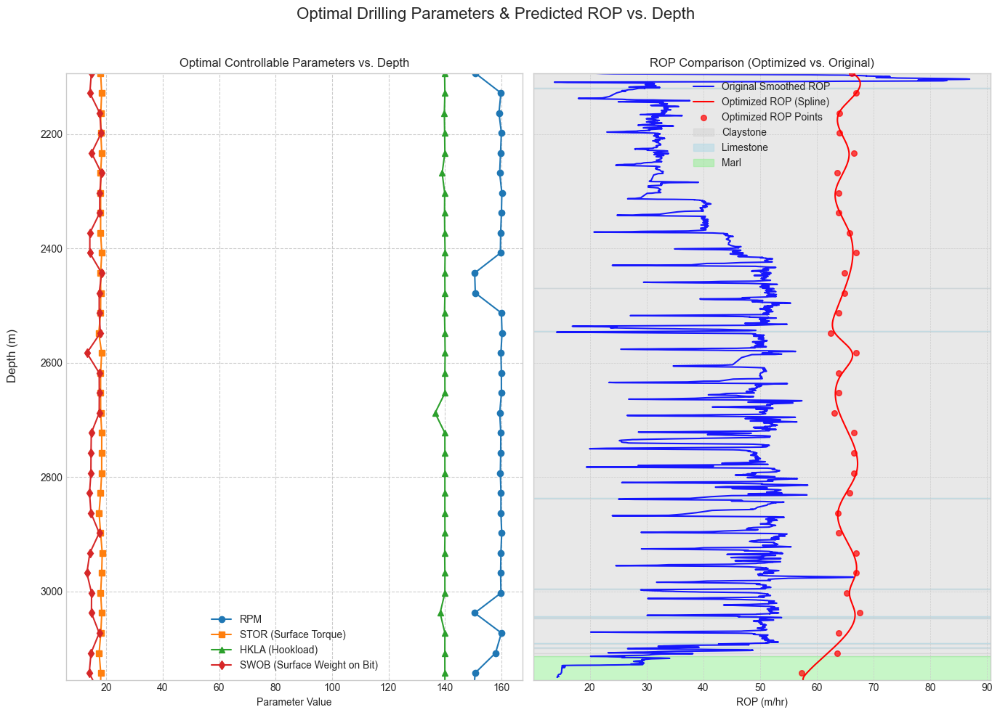

In [132]:
# Define the master list of feature names in the exact order the model expects.
ALL_FEATURE_NAMES = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB']

# Define controllable features that the optimizer will vary.
# IMPORTANT: The order here determines the order in the `bounds` and the `X` array in the objective function.
CONTROLLABLE_FEATURES = ['RPM', 'STOR', 'HKLA', 'SWOB', 'SPPA', 'TFLO']

# Define fixed features.
FIXED_FEATURES = ['GR_CAL', 'RHOB', 'ECD']

# Target ranges for specific features used in the cost function.
RPM_TARGET_RANGE = [100, 220]
SWOB_TARGET_RANGE = [10, 25]
HKLA_TARGET_RANGE = [120, 160]
STOR_TARGET_RANGE = [10, 22]
SPPA_TARGET_RANGE = [345, 360]
TFLO_TARGET_RANGE = [3000, 3250]

# Estimated min/max ranges for ROP and MSE for normalization.
ROP_NORM_RANGE = [10, 150]
MSE_NORM_RANGE = [20000, 100000]

# Define the bounds for the controllable features.
# Order MUST match CONTROLLABLE_FEATURES: [RPM, STOR, HKLA, SWOB, SPPA, TFLO]
LOWER_BOUNDS = np.array([100, 15, 120, 10, 345, 3000])
UPPER_BOUNDS = np.array([220, 25, 150, 25, 360, 3250])

# A default set of conditions in case a depth falls outside all defined ranges.
DEFAULT_FIXED_CONDITIONS = {
    'GR_CAL': 90,
    'RHOB': 2.47,
    'ECD': 1.85
}

# Define lithology mapping based on the values from the code snippet
LITHOLOGY_MAP = {
    'c': {  # Claystone
        'GR_CAL': 90.0,
        'RHOB': 2.47,
        'ECD': 1.85
    },
    'm': {  # Marl
        'GR_CAL': 67.63,
        'RHOB': 2.615,
        'ECD': 1.85
    },
    'l': {  # Limestone
        'GR_CAL': 45.68,
        'RHOB': 2.56,
        'ECD': 1.85
    },
    's': {  # Siltstone
        'GR_CAL': 90.0,
        'RHOB': 2.425,
        'ECD': 1.85
    }
}


def get_conditions_for_depth(depth, sections, mapping):
    """
    Finds the correct fixed conditions for a given depth based on lithology.

    Args:
        depth (float): The current drilling depth.
        sections (list): A list of tuples defining lithology sections.
        mapping (dict): A dictionary mapping lithology codes to parameters.

    Returns:
        dict: The dictionary of fixed parameters for that depth.
    """
    for (start, end), code in sections:
        if start <= depth <= end:
            return mapping.get(code, DEFAULT_FIXED_CONDITIONS)
    # If no section matches, return the default
    print(f"Warning: Depth {depth:.2f}m is outside defined lithology sections. Using default values.")
    return DEFAULT_FIXED_CONDITIONS


# --- 3. Pre-calculate indices for fast NumPy operations ---
CONTROLLABLE_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in CONTROLLABLE_FEATURES}
FIXED_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in FIXED_FEATURES}
OPTIMIZER_TO_FULL_FEATURE_MAP = [CONTROLLABLE_INDICES[name] for name in CONTROLLABLE_FEATURES]


# --- 4. Define the Objective Function ---
def weighted_objective(X, x_template, feature_map, rop_m, mse_m, scaler_obj, rop_norm, mse_norm):
    """
    Optimized objective function to be minimized.
    """
    num_particles = X.shape[0]
    X_full = np.tile(x_template, (num_particles, 1))
    X_full[:, feature_map] = X
    X_df = pd.DataFrame(X_full, columns=ALL_FEATURE_NAMES)
    X_scaled = scaler_obj.transform(X_df)

    # ROP Objective (Maximize -> Minimize 1 - normalized_rop)
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    # MSE Objective (Minimize)
    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    # Clamp values to handle predictions outside the norm range
    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # Penalty terms for controllable parameters
    # Optimizer X columns: [0:RPM, 1:STOR, 2:HKLA, 3:SWOB, 4:SPPA, 5:TFLO]
    rpm_penalty = np.abs(X[:, 0] - np.mean(RPM_TARGET_RANGE)) / (RPM_TARGET_RANGE[1] - RPM_TARGET_RANGE[0])
    stor_penalty = np.abs(X[:, 1] - np.mean(STOR_TARGET_RANGE)) / (STOR_TARGET_RANGE[1] - STOR_TARGET_RANGE[0])
    hkla_penalty = np.abs(X[:, 2] - np.mean(HKLA_TARGET_RANGE)) / (HKLA_TARGET_RANGE[1] - HKLA_TARGET_RANGE[0])
    swob_penalty = np.abs(X[:, 3] - np.mean(SWOB_TARGET_RANGE)) / (SWOB_TARGET_RANGE[1] - SWOB_TARGET_RANGE[0])
    sppa_penalty = np.abs(X[:, 4] - np.mean(SPPA_TARGET_RANGE)) / (SPPA_TARGET_RANGE[1] - SPPA_TARGET_RANGE[0])
    tflo_penalty = np.abs(X[:, 5] - np.mean(TFLO_TARGET_RANGE)) / (TFLO_TARGET_RANGE[1] - TFLO_TARGET_RANGE[0])

    # --- Final Weighted Cost ---
    # Weights are adjusted to sum to 1.0. You can tune these as needed.
    # ROP: 40%, MSE: 20%, Soft Constraints: 40%
    penalty_weight = 0.40 / 6 # Distribute penalty weight among controllable features
    weighted_cost = (0.40 * rop_obj_normalized +
                     0.20 * mse_obj_normalized +
                     penalty_weight * rpm_penalty +
                     penalty_weight * stor_penalty +
                     penalty_weight * hkla_penalty +
                     penalty_weight * swob_penalty +
                     penalty_weight * sppa_penalty +
                     penalty_weight * tflo_penalty)

    return weighted_cost


# --- 5. Main Optimization Loop ---

# Import required libraries
from functools import partial
from scipy.interpolate import UnivariateSpline

# Define the new depth range to test with a step of 29 meters
start_depth = 2093  # Updated for K67Z
end_depth = 3155    # Updated for K67Z
step = 35
depth_range = np.arange(start_depth, end_depth + step, step)

results_list = []
print(f"Running optimization for {len(depth_range)} depth points from {start_depth}m to {end_depth}m...")

for depth in depth_range:
    # --- DYNAMICALLY GET FIXED CONDITIONS --- This is the key change: get geology-based values for this depth.
    current_fixed_conditions = get_conditions_for_depth(depth, lithology_K67Z.items(), LITHOLOGY_MAP)

    lithology_code = next((lith for (start, end), lith in lithology_K67Z.items() if start <= depth <= end), "unknown")
    print(f"  Optimizing for DEPTH = {depth:.2f}m (Lithology: {lithology_code})")

    # --- Create the template array with the new dynamic fixed values ---
    X_template = np.zeros(len(ALL_FEATURE_NAMES))
    for name, index in FIXED_INDICES.items():
        X_template[index] = current_fixed_conditions[name]

    # --- Set up and Run Optimizer ---
    optimizer = GlobalBestPSO(
        n_particles=100,
        dimensions=len(CONTROLLABLE_FEATURES),
        options={'c1': 0.5, 'c2': 0.7, 'w': 0.3},
        bounds=(LOWER_BOUNDS, UPPER_BOUNDS)
    )

    objective_func = partial(
        weighted_objective,
        x_template=X_template, feature_map=OPTIMIZER_TO_FULL_FEATURE_MAP,
        rop_m=rop_model, mse_m=mse_model, scaler_obj=scaler,
        rop_norm=ROP_NORM_RANGE, mse_norm=MSE_NORM_RANGE
    )

    cost, pos = optimizer.optimize(objective_func=objective_func, iters=100, verbose=False)

    # --- Recalculate and Store Results ---
    optimal_point_full = X_template.copy()
    optimal_point_full[OPTIMIZER_TO_FULL_FEATURE_MAP] = pos
    optimal_df = pd.DataFrame([optimal_point_full], columns=ALL_FEATURE_NAMES)
    optimal_scaled = scaler.transform(optimal_df)
    rop_value = rop_model.predict(optimal_scaled)[0]
    mse_value = mse_model.predict(optimal_scaled)[0]

    result = {'DEPTH': depth, 'ROP_opt': rop_value, 'MSE_opt': mse_value, 'LITHOLOGY': lithology_code}
    for i, name in enumerate(CONTROLLABLE_FEATURES):
        result[name] = pos[i]
    results_list.append(result)


# --- 6. Process and Visualize Results ---

df_opt = pd.DataFrame(results_list)
print("\nOptimization complete.")
print(df_opt.head())

# Visualize the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10), sharey=True)
fig.suptitle('Optimal Drilling Parameters & Predicted ROP vs. Depth', fontsize=16)
fig.supylabel('Depth (m)', fontsize=12)

# --- Plot 1: Optimal Parameters vs. Depth ---
ax1.plot(df_opt['RPM'], df_opt['DEPTH'], marker='o', linestyle='-', label='RPM')
ax1.plot(df_opt['STOR'], df_opt['DEPTH'], marker='s', linestyle='-', label='STOR (Surface Torque)')
ax1.plot(df_opt['HKLA'], df_opt['DEPTH'], marker='^', linestyle='-', label='HKLA (Hookload)')
ax1.plot(df_opt['SWOB'], df_opt['DEPTH'], marker='d', linestyle='-', label='SWOB (Surface Weight on Bit)')
ax1.set_title('Optimal Controllable Parameters vs. Depth')
ax1.set_xlabel('Parameter Value')
ax1.grid(True, which='both', linestyle='--')
ax1.legend()
ax1.set_ylim(end_depth, start_depth)

# --- Plot 2: Predicted ROP vs. Depth ---
lithology_labels = {'c': 'Claystone', 's': 'Siltstone', 'l': 'Limestone', 'm': 'Marl'}
lithology_colors = {'c': 'lightgrey', 's': 'lightgoldenrodyellow', 'l': 'lightblue', 'm': 'lightgreen'}
legend_patches = []
for code, label in lithology_labels.items():
    if code in lithology_K67Z.values():
        legend_patches.append(Patch(color=lithology_colors[code], alpha=0.5, label=label))
for (start, end), code in lithology_K67Z.items():
    color = lithology_colors.get(code, 'white')
    ax2.axhspan(start, end, color=color, alpha=0.5, zorder=0)

depth_mask_K67Z = (df_K67Z['DEPTH'] >= start_depth) & (df_K67Z['DEPTH'] <= end_depth)
df_filtered = df_K67Z[depth_mask_K67Z].copy()
df_filtered['ROP5_smoothed'] = df_filtered['ROP5'].rolling(window=10, center=True, min_periods=1).mean()
ax2.plot(df_filtered['ROP5_smoothed'], df_filtered['DEPTH'], color='blue', alpha=0.9, label='Original Smoothed ROP')

# --- Start of Corrected Spline Section ---
# Plot optimized ROP
# FIX 1: Sort by the independent variable, 'DEPTH'
df_opt_sorted = df_opt.sort_values('DEPTH').reset_index()

if len(df_opt_sorted) > 3:
    # FIX 2: Model ROP as a function of DEPTH -> spline(DEPTH, ROP)
    spline = UnivariateSpline(df_opt_sorted['DEPTH'], df_opt_sorted['ROP_opt'], s=len(df_opt_sorted)/2) # Added smoothing factor

    # FIX 3: Create a range for the independent variable, DEPTH
    depth_range_spline = np.linspace(df_opt_sorted['DEPTH'].min(), df_opt_sorted['DEPTH'].max(), 20000)
    
    # FIX 4: Calculate the corresponding ROP values from the spline
    rop_spline = spline(depth_range_spline)
    
    # PLOT: Plot calculated ROP on the x-axis and the Depth range on the y-axis
    ax2.plot(rop_spline, depth_range_spline, color='red', linestyle='-', label='Optimized ROP (Spline)')
else:
    ax2.plot(df_opt_sorted['ROP_opt'], df_opt_sorted['DEPTH'], color='red', linestyle='-', label='Optimized ROP')
# --- End of Corrected Spline Section ---

ax2.scatter(df_opt['ROP_opt'], df_opt['DEPTH'], color='red', alpha=0.7, s=30, zorder=5, label='Optimized ROP Points')
ax2.set_xlabel('ROP (m/hr)')
ax2.set_title('ROP Comparison (Optimized vs. Original)')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

handles, labels = ax2.get_legend_handles_labels()
ax2.legend(handles=handles + legend_patches, loc='best')

plt.tight_layout(rect=[0.02, 0, 1, 0.96])
plt.show()

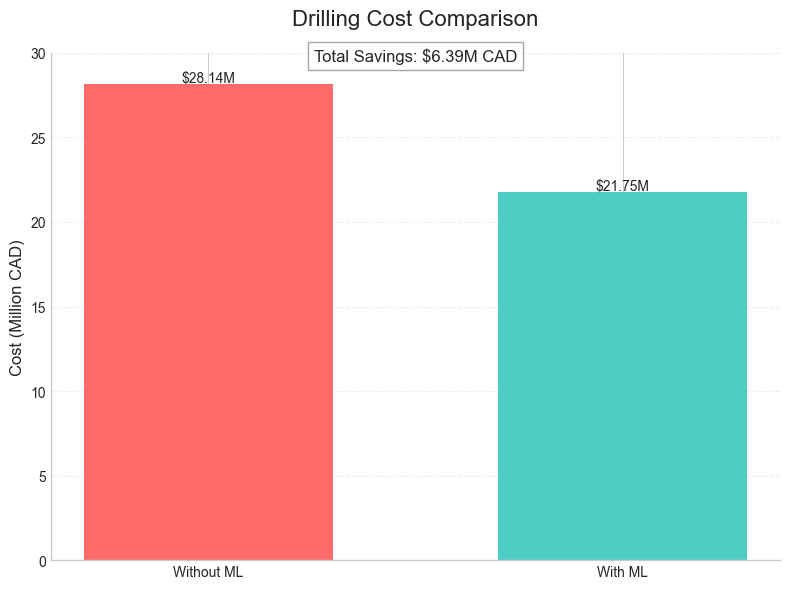

In [103]:
# Create bar chart comparing drilling costs with and without ML
fig, ax = plt.subplots(figsize=(8, 6))

# Plot data
data = {
    'Without ML': 28.14,
    'With ML': 21.75
}
bars = ax.bar(data.keys(), data.values(), 
              color=['#FF6B6B', '#4ECDC4'],  # Modern coral red and turquoise
              width=0.6)

# Styling
ax.set_title('Drilling Cost Comparison', fontsize=16, pad=20)
ax.set_ylabel('Cost (Million CAD)', fontsize=12)
ax.set_ylim(0, 30)

# Grid and spines
ax.yaxis.grid(True, linestyle='--', alpha=0.3)
ax.set_axisbelow(True)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height,
            f'${height:.2f}M',
            ha='center', va='bottom')

# Add savings callout
savings = data['Without ML'] - data['With ML']
ax.text(0.5, 29.5, f'Total Savings: ${savings:.2f}M CAD',
        ha='center', fontsize=12,
        bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

plt.tight_layout()
plt.show()

Running optimization for 19 depth points from 2093m to 3150m...
  Optimizing for DEPTH = 2093.00m (Lithology: c)


  Optimizing for DEPTH = 2153.00m (Lithology: c)
  Optimizing for DEPTH = 2213.00m (Lithology: c)
  Optimizing for DEPTH = 2273.00m (Lithology: c)
  Optimizing for DEPTH = 2333.00m (Lithology: c)
  Optimizing for DEPTH = 2393.00m (Lithology: c)
  Optimizing for DEPTH = 2453.00m (Lithology: c)
  Optimizing for DEPTH = 2513.00m (Lithology: c)
  Optimizing for DEPTH = 2573.00m (Lithology: c)
  Optimizing for DEPTH = 2633.00m (Lithology: c)
  Optimizing for DEPTH = 2693.00m (Lithology: c)
  Optimizing for DEPTH = 2753.00m (Lithology: c)
  Optimizing for DEPTH = 2813.00m (Lithology: c)
  Optimizing for DEPTH = 2873.00m (Lithology: c)
  Optimizing for DEPTH = 2933.00m (Lithology: c)
  Optimizing for DEPTH = 2993.00m (Lithology: c)
  Optimizing for DEPTH = 3053.00m (Lithology: c)
  Optimizing for DEPTH = 3113.00m (Lithology: c)
  Optimizing for DEPTH = 3173.00m (Lithology: unknown)

--- Optimization Complete ---
   DEPTH    ROP_opt       MSE_opt LITHOLOGY        HKLA       SWOB  \
0   2093  6

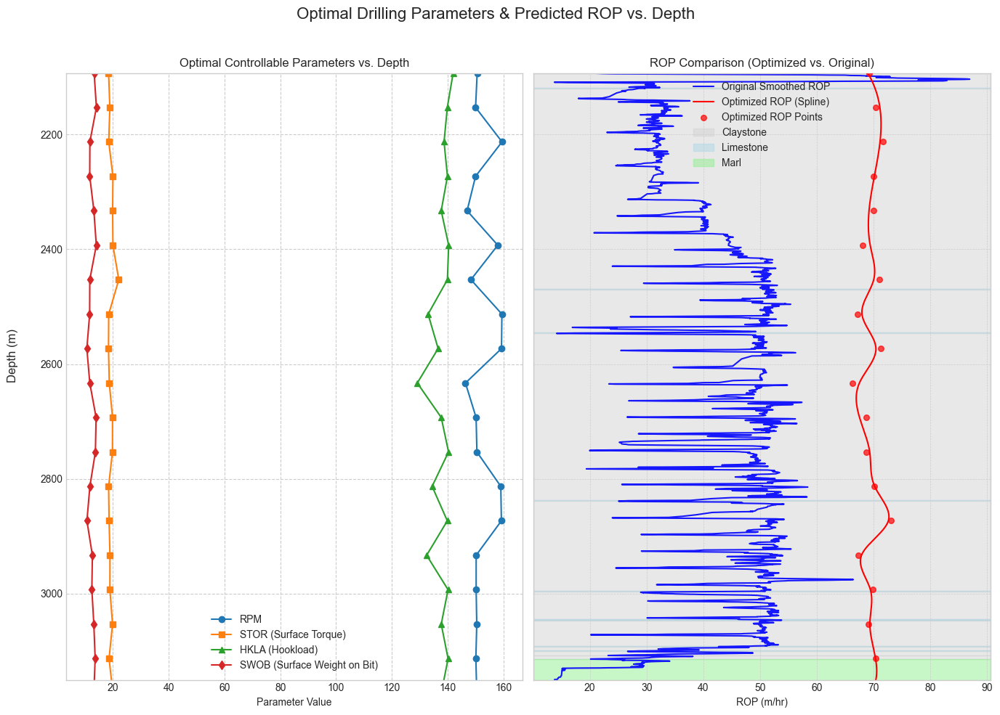

In [168]:
# Define the master list of feature names in the exact order the model expects.
ALL_FEATURE_NAMES = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB']

# Define controllable features that the optimizer will vary.
# IMPORTANT: The order here determines the order in the `bounds` and the `X` array in the objective function.
CONTROLLABLE_FEATURES = ['HKLA', 'SWOB', 'RPM', 'STOR', 'SPPA', 'TFLO']

# Define fixed features.
FIXED_FEATURES = ['GR_CAL', 'RHOB', 'ECD']

# Estimated min/max ranges for ROP and MSE for normalization.
ROP_NORM_RANGE = [10, 150]
MSE_NORM_RANGE = [20000, 100000]

# Define the bounds for the controllable features. These are the "hard" limits for the optimizer
# and also serve as the reference for the soft-constraint penalty.
# Order MUST match CONTROLLABLE_FEATURES: [HKLA, SWOB, RPM, STOR, SPPA, TFLO]
LOWER_BOUNDS = np.array([120, 10, 120, 15, 150, 3000])
UPPER_BOUNDS = np.array([150, 20, 200, 35, 400, 4000])

# A default set of conditions in case a depth falls outside all defined ranges.
DEFAULT_FIXED_CONDITIONS = {
    'GR_CAL': 90,
    'RHOB': 2.47,
    'ECD': 1.85
}

# Define lithology mapping based on the values from the code snippet
LITHOLOGY_MAP = {
    'c': {'GR_CAL': 90.0, 'RHOB': 2.47, 'ECD': 1.85},   # Claystone
    'm': {'GR_CAL': 67.63, 'RHOB': 2.615, 'ECD': 1.85}, # Marl
    'l': {'GR_CAL': 45.68, 'RHOB': 2.56, 'ECD': 1.85},   # Limestone
    's': {'GR_CAL': 90.0, 'RHOB': 2.425, 'ECD': 1.85}  # Siltstone
}

# --- 2. HELPER FUNCTIONS ---

def get_conditions_for_depth(depth, sections, mapping):
    """Finds the correct fixed conditions for a given depth based on lithology."""
    for (start, end), code in sections:
        if start <= depth <= end:
            return mapping.get(code, DEFAULT_FIXED_CONDITIONS)
    print(f"Warning: Depth {depth:.2f}m is outside defined lithology sections. Using default values.")
    return DEFAULT_FIXED_CONDITIONS

def calculate_penalty(values, lower_bound, upper_bound):
    """
    Calculates a normalized penalty for values outside the specified bounds (soft constraint).
    The penalty is 0 inside the bounds and increases linearly for values outside them.
    """
    bound_width = upper_bound - lower_bound
    if bound_width <= 0:
        return 0
    
    # Calculate deviation only for values outside the bounds
    lower_deviation = np.maximum(0, lower_bound - values)
    upper_deviation = np.maximum(0, values - upper_bound)
    total_deviation = lower_deviation + upper_deviation
    
    # Normalize by the width of the acceptable range
    return total_deviation / bound_width

# --- 3. PRE-CALCULATE INDICES ---
CONTROLLABLE_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in CONTROLLABLE_FEATURES}
FIXED_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in FIXED_FEATURES}
OPTIMIZER_TO_FULL_FEATURE_MAP = [CONTROLLABLE_INDICES[name] for name in CONTROLLABLE_FEATURES]

# --- 4. DEFINE THE OBJECTIVE FUNCTION ---
def weighted_objective(X, x_template, feature_map, rop_m, mse_m, scaler_obj, rop_norm, mse_norm, lower_bounds, upper_bounds):
    """
    Optimized objective function to be minimized, using soft-constraint penalties.
    """
    num_particles = X.shape[0]
    num_controllable = X.shape[1]
    
    # Reconstruct full feature matrix for all particles
    X_full = np.tile(x_template, (num_particles, 1))
    X_full[:, feature_map] = X
    X_df = pd.DataFrame(X_full, columns=ALL_FEATURE_NAMES)
    X_scaled = scaler_obj.transform(X_df)

    # ROP Objective (Maximize -> Minimize 1 - normalized_rop)
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    # MSE Objective (Minimize)
    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    # Clamp values to handle predictions outside the norm range
    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # --- Soft Constraint Penalties ---
    # Penalize deviation from the defined operational bounds.
    total_penalty = 0
    for i in range(num_controllable):
        # X[:, i] = values for one feature across all particles
        # lower_bounds[i] and upper_bounds[i] are the limits for that feature
        total_penalty += calculate_penalty(X[:, i], lower_bounds[i], upper_bounds[i])
    
    # Average the penalty across all controllable features
    average_penalty = total_penalty / num_controllable

    # --- Final Weighted Cost ---
    # Weights: ROP: 40%, MSE: 20%, Soft Constraints: 40%
    weighted_cost = (0.40 * rop_obj_normalized +
                     0.20 * mse_obj_normalized +
                     0.40 * average_penalty)

    return weighted_cost

# --- 5. MAIN OPTIMIZATION LOOP ---

# Define the depth range to test
start_depth = 2093
end_depth = 3150
step = 60
depth_range = np.arange(start_depth, end_depth + step, step)

results_list = []
print(f"Running optimization for {len(depth_range)} depth points from {start_depth}m to {end_depth}m...")

for depth in depth_range:
    # Get geology-based fixed values for the current depth
    current_fixed_conditions = get_conditions_for_depth(depth, lithology_K67Z.items(), LITHOLOGY_MAP)
    lithology_code = next((lith for (start, end), lith in lithology_K67Z.items() if start <= depth <= end), "unknown")
    print(f"  Optimizing for DEPTH = {depth:.2f}m (Lithology: {lithology_code})")

    # Create the template array with dynamic fixed values
    X_template = np.zeros(len(ALL_FEATURE_NAMES))
    for name, index in FIXED_INDICES.items():
        X_template[index] = current_fixed_conditions[name]

    # --- Set up and Run Optimizer ---
    optimizer = GlobalBestPSO(
        n_particles=100,
        dimensions=len(CONTROLLABLE_FEATURES),
        options={'c1': 0.5, 'c2': 0.7, 'w': 0.3},
        bounds=(LOWER_BOUNDS, UPPER_BOUNDS)
    )

    # Create the objective function with all necessary arguments fixed via `partial`
    objective_func = partial(
        weighted_objective,
        x_template=X_template,
        feature_map=OPTIMIZER_TO_FULL_FEATURE_MAP,
        rop_m=rop_model,
        mse_m=mse_model,
        scaler_obj=scaler,
        rop_norm=ROP_NORM_RANGE,
        mse_norm=MSE_NORM_RANGE,
        lower_bounds=LOWER_BOUNDS, # Pass the bounds for penalty calculation
        upper_bounds=UPPER_BOUNDS
    )

    cost, pos = optimizer.optimize(objective_func=objective_func, iters=100, verbose=False)

    # --- Recalculate and Store Results ---
    optimal_point_full = X_template.copy()
    optimal_point_full[OPTIMIZER_TO_FULL_FEATURE_MAP] = pos
    optimal_df = pd.DataFrame([optimal_point_full], columns=ALL_FEATURE_NAMES)
    optimal_scaled = scaler.transform(optimal_df)
    rop_value = rop_model.predict(optimal_scaled)[0]
    mse_value = mse_model.predict(optimal_scaled)[0]

    result = {'DEPTH': depth, 'ROP_opt': rop_value, 'MSE_opt': mse_value, 'LITHOLOGY': lithology_code}
    for i, name in enumerate(CONTROLLABLE_FEATURES):
        result[name] = pos[i]
    results_list.append(result)

# Convert results to a DataFrame for analysis
results_df = pd.DataFrame(results_list)
print("\n--- Optimization Complete ---")
print(results_df.head())

# --- 6. Process and Visualize Results ---

df_opt = pd.DataFrame(results_list)
print("\nOptimization complete.")
print(df_opt.head())

# Visualize the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10), sharey=True)
fig.suptitle('Optimal Drilling Parameters & Predicted ROP vs. Depth', fontsize=16)
fig.supylabel('Depth (m)', fontsize=12)

# --- Plot 1: Optimal Parameters vs. Depth ---
ax1.plot(df_opt['RPM'], df_opt['DEPTH'], marker='o', linestyle='-', label='RPM')
ax1.plot(df_opt['STOR'], df_opt['DEPTH'], marker='s', linestyle='-', label='STOR (Surface Torque)')
ax1.plot(df_opt['HKLA'], df_opt['DEPTH'], marker='^', linestyle='-', label='HKLA (Hookload)')
ax1.plot(df_opt['SWOB'], df_opt['DEPTH'], marker='d', linestyle='-', label='SWOB (Surface Weight on Bit)')
ax1.set_title('Optimal Controllable Parameters vs. Depth')
ax1.set_xlabel('Parameter Value')
ax1.grid(True, which='both', linestyle='--')
ax1.legend()
ax1.set_ylim(end_depth, start_depth)

# --- Plot 2: Predicted ROP vs. Depth ---
lithology_labels = {'c': 'Claystone', 's': 'Siltstone', 'l': 'Limestone', 'm': 'Marl'}
lithology_colors = {'c': 'lightgrey', 's': 'lightgoldenrodyellow', 'l': 'lightblue', 'm': 'lightgreen'}
legend_patches = []
for code, label in lithology_labels.items():
    if code in lithology_K67Z.values():
        legend_patches.append(Patch(color=lithology_colors[code], alpha=0.5, label=label))
for (start, end), code in lithology_K67Z.items():
    color = lithology_colors.get(code, 'white')
    ax2.axhspan(start, end, color=color, alpha=0.5, zorder=0)

depth_mask_K67Z = (df_K67Z['DEPTH'] >= start_depth) & (df_K67Z['DEPTH'] <= end_depth)
df_filtered = df_K67Z[depth_mask_K67Z].copy()
df_filtered['ROP5_smoothed'] = df_filtered['ROP5'].rolling(window=10, center=True, min_periods=1).mean()
ax2.plot(df_filtered['ROP5_smoothed'], df_filtered['DEPTH'], color='blue', alpha=0.9, label='Original Smoothed ROP')

# --- Start of Corrected Spline Section ---
# Plot optimized ROP
# FIX 1: Sort by the independent variable, 'DEPTH'
df_opt_sorted = df_opt.sort_values('DEPTH').reset_index()

if len(df_opt_sorted) > 3:
    # FIX 2: Model ROP as a function of DEPTH -> spline(DEPTH, ROP)
    spline = UnivariateSpline(df_opt_sorted['DEPTH'], df_opt_sorted['ROP_opt'], s=len(df_opt_sorted)/2) # Added smoothing factor

    # FIX 3: Create a range for the independent variable, DEPTH
    depth_range_spline = np.linspace(df_opt_sorted['DEPTH'].min(), df_opt_sorted['DEPTH'].max(), 1200)
    
    # FIX 4: Calculate the corresponding ROP values from the spline
    rop_spline = spline(depth_range_spline)
    
    # PLOT: Plot calculated ROP on the x-axis and the Depth range on the y-axis
    ax2.plot(rop_spline, depth_range_spline, color='red', linestyle='-', label='Optimized ROP (Spline)')
else:
    ax2.plot(df_opt_sorted['ROP_opt'], df_opt_sorted['DEPTH'], color='red', linestyle='-', label='Optimized ROP')
# --- End of Corrected Spline Section ---

ax2.scatter(df_opt['ROP_opt'], df_opt['DEPTH'], color='red', alpha=0.7, s=30, zorder=5, label='Optimized ROP Points')
ax2.set_xlabel('ROP (m/hr)')
ax2.set_title('ROP Comparison (Optimized vs. Original)')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

handles, labels = ax2.get_legend_handles_labels()
ax2.legend(handles=handles + legend_patches, loc='best')

plt.tight_layout(rect=[0.02, 0, 1, 0.96])
plt.show()

### Optimization results for C78

Running optimization for 29 depth points from 1900m to 2844m...
  Optimizing for DEPTH = 1900.00m (Lithology: unknown)


  Optimizing for DEPTH = 1934.00m (Lithology: c)
  Optimizing for DEPTH = 1968.00m (Lithology: s)
  Optimizing for DEPTH = 2002.00m (Lithology: c)
  Optimizing for DEPTH = 2036.00m (Lithology: c)
  Optimizing for DEPTH = 2070.00m (Lithology: c)
  Optimizing for DEPTH = 2104.00m (Lithology: c)
  Optimizing for DEPTH = 2138.00m (Lithology: c)
  Optimizing for DEPTH = 2172.00m (Lithology: c)
  Optimizing for DEPTH = 2206.00m (Lithology: c)
  Optimizing for DEPTH = 2240.00m (Lithology: c)
  Optimizing for DEPTH = 2274.00m (Lithology: c)
  Optimizing for DEPTH = 2308.00m (Lithology: c)
  Optimizing for DEPTH = 2342.00m (Lithology: l)
  Optimizing for DEPTH = 2376.00m (Lithology: l)
  Optimizing for DEPTH = 2410.00m (Lithology: l)
  Optimizing for DEPTH = 2444.00m (Lithology: l)
  Optimizing for DEPTH = 2478.00m (Lithology: l)
  Optimizing for DEPTH = 2512.00m (Lithology: c)
  Optimizing for DEPTH = 2546.00m (Lithology: c)
  Optimizing for DEPTH = 2580.00m (Lithology: c)
  Optimizing for DEP

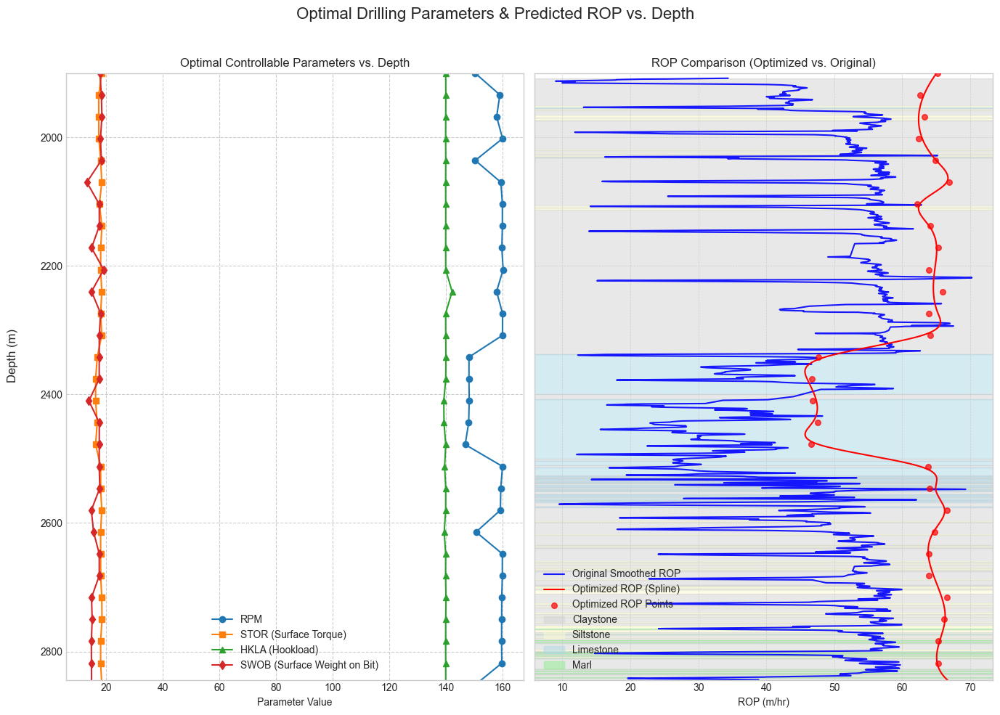

In [134]:
# Define the master list of feature names in the exact order the model expects.
ALL_FEATURE_NAMES = ['HKLA', 'SWOB', 'RPM', 'GR_CAL', 'STOR', 'SPPA', 'TFLO', 'ECD', 'RHOB']

# Define controllable features that the optimizer will vary.
# IMPORTANT: The order here determines the order in the `bounds` and the `X` array in the objective function.
CONTROLLABLE_FEATURES = ['RPM', 'STOR', 'HKLA', 'SWOB', 'SPPA', 'TFLO']

# Define fixed features.
FIXED_FEATURES = ['GR_CAL', 'RHOB', 'ECD']

# Target ranges for specific features used in the cost function.
RPM_TARGET_RANGE = [100, 220]
SWOB_TARGET_RANGE = [10, 25]
HKLA_TARGET_RANGE = [120, 160]
STOR_TARGET_RANGE = [10, 22]
SPPA_TARGET_RANGE = [345, 360]
TFLO_TARGET_RANGE = [3000, 3250]

# Estimated min/max ranges for ROP and MSE for normalization.
ROP_NORM_RANGE = [10, 150]
MSE_NORM_RANGE = [20000, 100000]

# Define the bounds for the controllable features.
# Order MUST match CONTROLLABLE_FEATURES: [RPM, STOR, HKLA, SWOB, SPPA, TFLO]
LOWER_BOUNDS = np.array([100, 15, 120, 10, 345, 3000])
UPPER_BOUNDS = np.array([220, 25, 150, 25, 360, 3250])

# A default set of conditions in case a depth falls outside all defined ranges.
DEFAULT_FIXED_CONDITIONS = {
    'GR_CAL': 90,
    'RHOB': 2.47,
    'ECD': 1.85
}

# Define lithology mapping based on the values from the code snippet
LITHOLOGY_MAP = {
    'c': {  # Claystone
        'GR_CAL': 90.0,
        'RHOB': 2.47,
        'ECD': 1.85
    },
    'm': {  # Marl
        'GR_CAL': 67.63,
        'RHOB': 2.615,
        'ECD': 1.85
    },
    'l': {  # Limestone
        'GR_CAL': 45.68,
        'RHOB': 2.56,
        'ECD': 1.85
    },
    's': {  # Siltstone
        'GR_CAL': 90.0,
        'RHOB': 2.425,
        'ECD': 1.85
    }
}


def get_conditions_for_depth(depth, sections, mapping):
    """
    Finds the correct fixed conditions for a given depth based on lithology.

    Args:
        depth (float): The current drilling depth.
        sections (list): A list of tuples defining lithology sections.
        mapping (dict): A dictionary mapping lithology codes to parameters.

    Returns:
        dict: The dictionary of fixed parameters for that depth.
    """
    for (start, end), code in sections:
        if start <= depth <= end:
            return mapping.get(code, DEFAULT_FIXED_CONDITIONS)
    # If no section matches, return the default
    print(f"Warning: Depth {depth:.2f}m is outside defined lithology sections. Using default values.")
    return DEFAULT_FIXED_CONDITIONS


# --- 3. Pre-calculate indices for fast NumPy operations ---
CONTROLLABLE_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in CONTROLLABLE_FEATURES}
FIXED_INDICES = {name: ALL_FEATURE_NAMES.index(name) for name in FIXED_FEATURES}
OPTIMIZER_TO_FULL_FEATURE_MAP = [CONTROLLABLE_INDICES[name] for name in CONTROLLABLE_FEATURES]


# --- 4. Define the Objective Function ---
def weighted_objective(X, x_template, feature_map, rop_m, mse_m, scaler_obj, rop_norm, mse_norm):
    """
    Optimized objective function to be minimized.
    """
    num_particles = X.shape[0]
    X_full = np.tile(x_template, (num_particles, 1))
    X_full[:, feature_map] = X
    X_df = pd.DataFrame(X_full, columns=ALL_FEATURE_NAMES)
    X_scaled = scaler_obj.transform(X_df)

    # ROP Objective (Maximize -> Minimize 1 - normalized_rop)
    rop_pred = rop_m.predict(X_scaled)
    rop_obj_normalized = 1 - (rop_pred - rop_norm[0]) / (rop_norm[1] - rop_norm[0])

    # MSE Objective (Minimize)
    mse_pred = mse_m.predict(X_scaled)
    mse_obj_normalized = (mse_pred - mse_norm[0]) / (mse_norm[1] - mse_norm[0])

    # Clamp values to handle predictions outside the norm range
    rop_obj_normalized = np.clip(rop_obj_normalized, 0, 1)
    mse_obj_normalized = np.clip(mse_obj_normalized, 0, 1)

    # Penalty terms for controllable parameters
    # Optimizer X columns: [0:RPM, 1:STOR, 2:HKLA, 3:SWOB, 4:SPPA, 5:TFLO]
    rpm_penalty = np.abs(X[:, 0] - np.mean(RPM_TARGET_RANGE)) / (RPM_TARGET_RANGE[1] - RPM_TARGET_RANGE[0])
    stor_penalty = np.abs(X[:, 1] - np.mean(STOR_TARGET_RANGE)) / (STOR_TARGET_RANGE[1] - STOR_TARGET_RANGE[0])
    hkla_penalty = np.abs(X[:, 2] - np.mean(HKLA_TARGET_RANGE)) / (HKLA_TARGET_RANGE[1] - HKLA_TARGET_RANGE[0])
    swob_penalty = np.abs(X[:, 3] - np.mean(SWOB_TARGET_RANGE)) / (SWOB_TARGET_RANGE[1] - SWOB_TARGET_RANGE[0])
    sppa_penalty = np.abs(X[:, 4] - np.mean(SPPA_TARGET_RANGE)) / (SPPA_TARGET_RANGE[1] - SPPA_TARGET_RANGE[0])
    tflo_penalty = np.abs(X[:, 5] - np.mean(TFLO_TARGET_RANGE)) / (TFLO_TARGET_RANGE[1] - TFLO_TARGET_RANGE[0])

    # --- Final Weighted Cost ---
    # Weights are adjusted to sum to 1.0. You can tune these as needed.
    # ROP: 40%, MSE: 20%, Soft Constraints: 40%
    penalty_weight = 0.40 / 6 # Distribute penalty weight among controllable features
    weighted_cost = (0.40 * rop_obj_normalized +
                     0.20 * mse_obj_normalized +
                     penalty_weight * rpm_penalty +
                     penalty_weight * stor_penalty +
                     penalty_weight * hkla_penalty +
                     penalty_weight * swob_penalty +
                     penalty_weight * sppa_penalty +
                     penalty_weight * tflo_penalty)

    return weighted_cost


# --- 5. Main Optimization Loop ---

# Import required libraries
from functools import partial
from scipy.interpolate import UnivariateSpline

# Import required libraries
from functools import partial
from scipy.interpolate import UnivariateSpline

# Define the new depth range to test with a step of 29 meters
start_depth = 1900
end_depth = 2844
step = 34
depth_range = np.arange(start_depth, end_depth + step, step)

results_list = []
print(f"Running optimization for {len(depth_range)} depth points from {start_depth}m to {end_depth}m...")

for depth in depth_range:
    # --- DYNAMICALLY GET FIXED CONDITIONS --- This is the key change: get geology-based values for this depth.
    current_fixed_conditions = get_conditions_for_depth(depth, lithology_C78.items(), LITHOLOGY_MAP)

    lithology_code = next((lith for (start, end), lith in lithology_C78.items() if start <= depth <= end), "unknown")
    print(f"  Optimizing for DEPTH = {depth:.2f}m (Lithology: {lithology_code})")

    # --- Create the template array with the new dynamic fixed values ---
    X_template = np.zeros(len(ALL_FEATURE_NAMES))
    for name, index in FIXED_INDICES.items():
        X_template[index] = current_fixed_conditions[name]

    # --- Set up and Run Optimizer ---
    optimizer = GlobalBestPSO(
        n_particles=100,
        dimensions=len(CONTROLLABLE_FEATURES),
        options={'c1': 0.5, 'c2': 0.7, 'w': 0.3},
        bounds=(LOWER_BOUNDS, UPPER_BOUNDS)
    )

    objective_func = partial(
        weighted_objective,
        x_template=X_template, feature_map=OPTIMIZER_TO_FULL_FEATURE_MAP,
        rop_m=rop_model, mse_m=mse_model, scaler_obj=scaler,
        rop_norm=ROP_NORM_RANGE, mse_norm=MSE_NORM_RANGE
    )

    cost, pos = optimizer.optimize(objective_func=objective_func, iters=100, verbose=False)

    # --- Recalculate and Store Results ---
    optimal_point_full = X_template.copy()
    optimal_point_full[OPTIMIZER_TO_FULL_FEATURE_MAP] = pos
    optimal_df = pd.DataFrame([optimal_point_full], columns=ALL_FEATURE_NAMES)
    optimal_scaled = scaler.transform(optimal_df)
    rop_value = rop_model.predict(optimal_scaled)[0]
    mse_value = mse_model.predict(optimal_scaled)[0]

    result = {'DEPTH': depth, 'ROP_opt': rop_value, 'MSE_opt': mse_value, 'LITHOLOGY': lithology_code}
    for i, name in enumerate(CONTROLLABLE_FEATURES):
        result[name] = pos[i]
    results_list.append(result)


# --- 6. Process and Visualize Results ---
from matplotlib.patches import Patch 

df_opt = pd.DataFrame(results_list)
print("\nOptimization complete.")
print(df_opt.head())

# Visualize the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10), sharey=True)
fig.suptitle('Optimal Drilling Parameters & Predicted ROP vs. Depth', fontsize=16)
fig.supylabel('Depth (m)', fontsize=12)

# --- Plot 1: Optimal Parameters vs. Depth ---
ax1.plot(df_opt['RPM'], df_opt['DEPTH'], marker='o', linestyle='-', label='RPM')
ax1.plot(df_opt['STOR'], df_opt['DEPTH'], marker='s', linestyle='-', label='STOR (Surface Torque)')
ax1.plot(df_opt['HKLA'], df_opt['DEPTH'], marker='^', linestyle='-', label='HKLA (Hookload)')
ax1.plot(df_opt['SWOB'], df_opt['DEPTH'], marker='d', linestyle='-', label='SWOB (Surface Weight on Bit)')
ax1.set_title('Optimal Controllable Parameters vs. Depth')
ax1.set_xlabel('Parameter Value')
ax1.grid(True, which='both', linestyle='--')
ax1.legend()
ax1.set_ylim(end_depth, start_depth)

# --- Plot 2: Predicted ROP vs. Depth ---
lithology_labels = {'c': 'Claystone', 's': 'Siltstone', 'l': 'Limestone', 'm': 'Marl'}
lithology_colors = {'c': 'lightgrey', 's': 'lightgoldenrodyellow', 'l': 'lightblue', 'm': 'lightgreen'}
legend_patches = []
for code, label in lithology_labels.items():
    if code in lithology_C78.values():
        legend_patches.append(Patch(color=lithology_colors[code], alpha=0.5, label=label))
for (start, end), code in lithology_C78.items():
    color = lithology_colors.get(code, 'white')
    ax2.axhspan(start, end, color=color, alpha=0.5, zorder=0)

depth_mask_C78 = (df_C78['DEPTH'] >= start_depth) & (df_C78['DEPTH'] <= end_depth)
df_filtered = df_C78[depth_mask_C78].copy()
df_filtered['ROP5_smoothed'] = df_filtered['ROP5'].rolling(window=10, center=True, min_periods=1).mean()
ax2.plot(df_filtered['ROP5_smoothed'], df_filtered['DEPTH'], color='blue', alpha=0.9, label='Original Smoothed ROP')

# --- Start of Corrected Spline Section ---
# Plot optimized ROP
# FIX 1: Sort by the independent variable, 'DEPTH'
df_opt_sorted = df_opt.sort_values('DEPTH').reset_index()

if len(df_opt_sorted) > 3:
    # FIX 2: Model ROP as a function of DEPTH -> spline(DEPTH, ROP)
    spline = UnivariateSpline(df_opt_sorted['DEPTH'], df_opt_sorted['ROP_opt'], s=len(df_opt_sorted)/2) # Added smoothing factor

    # FIX 3: Create a range for the independent variable, DEPTH
    depth_range_spline = np.linspace(df_opt_sorted['DEPTH'].min(), df_opt_sorted['DEPTH'].max(), 20000)
    
    # FIX 4: Calculate the corresponding ROP values from the spline
    rop_spline = spline(depth_range_spline)
    
    # PLOT: Plot calculated ROP on the x-axis and the Depth range on the y-axis
    ax2.plot(rop_spline, depth_range_spline, color='red', linestyle='-', label='Optimized ROP (Spline)')
else:
    ax2.plot(df_opt_sorted['ROP_opt'], df_opt_sorted['DEPTH'], color='red', linestyle='-', label='Optimized ROP')
# --- End of Corrected Spline Section ---

ax2.scatter(df_opt['ROP_opt'], df_opt['DEPTH'], color='red', alpha=0.7, s=30, zorder=5, label='Optimized ROP Points')
ax2.set_xlabel('ROP (m/hr)')
ax2.set_title('ROP Comparison (Optimized vs. Original)')
ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

handles, labels = ax2.get_legend_handles_labels()
ax2.legend(handles=handles + legend_patches, loc='best')

plt.tight_layout(rect=[0.02, 0, 1, 0.96])
plt.show()

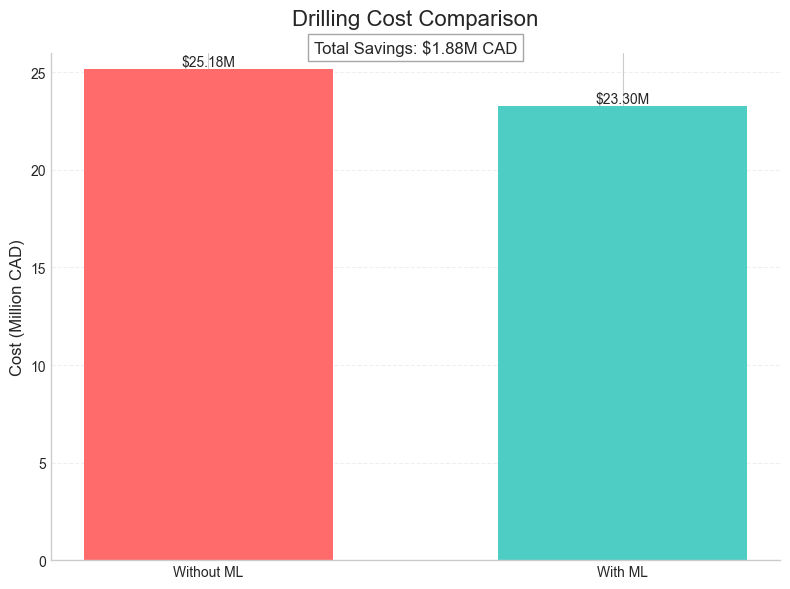

In [110]:
# Create bar chart comparing drilling costs with and without ML
fig, ax = plt.subplots(figsize=(8, 6))

# Plot data
data = {
    'Without ML': 25.18,
    'With ML': 23.30
}
bars = ax.bar(data.keys(), data.values(), 
              color=['#FF6B6B', '#4ECDC4'],  # Modern coral red and turquoise
              width=0.6)

# Styling
ax.set_title('Drilling Cost Comparison', fontsize=16, pad=20)
ax.set_ylabel('Cost (Million CAD)', fontsize=12)
ax.set_ylim(0, 26)

# Grid and spines
ax.yaxis.grid(True, linestyle='--', alpha=0.3)
ax.set_axisbelow(True)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height,
            f'${height:.2f}M',
            ha='center', va='bottom')

# Add savings callout
savings = data['Without ML'] - data['With ML']
ax.text(0.5, 26, f'Total Savings: ${savings:.2f}M CAD',
        ha='center', fontsize=12,
        bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

plt.tight_layout()
plt.show()

### Plots and other data for comparison

In [18]:
# Compile statistics for all wells
print("Statistics by Well:")
print("-" * 50)

for well_name, df in [('J31A', df_J31A), ('G92', df_G92), ('K67Z', df_K67Z), ('C78', df_C78)]:
    print(f"\nWell {well_name}:")
    print(f"Number of data points: {len(df)}")
    
    print("\nDepth Statistics (m):")
    depth_stats = df['DEPTH'].describe()
    print(f"Min: {depth_stats['min']:.2f}")
    print(f"Max: {depth_stats['max']:.2f}")
    print(f"Range: {depth_stats['max'] - depth_stats['min']:.2f}")
    
    print("\nROP5 Statistics:")
    rop_stats = df['ROP5'].describe()
    print(f"Mean: {rop_stats['mean']:.2f}")
    print(f"Std Dev: {rop_stats['std']:.2f}") 
    print(f"Min: {rop_stats['min']:.2f}")
    print(f"25%: {rop_stats['25%']:.2f}")
    print(f"Median: {rop_stats['50%']:.2f}")
    print(f"75%: {rop_stats['75%']:.2f}")
    print(f"Max: {rop_stats['max']:.2f}")
    
    print("\nMSE Statistics:")
    mse_stats = df['MSE'].describe()
    print(f"Mean: {mse_stats['mean']:.2f}")
    print(f"Std Dev: {mse_stats['std']:.2f}")
    print(f"Min: {mse_stats['min']:.2f}")
    print(f"25%: {mse_stats['25%']:.2f}")
    print(f"Median: {mse_stats['50%']:.2f}")
    print(f"75%: {mse_stats['75%']:.2f}")
    print(f"Max: {mse_stats['max']:.2f}")



Statistics by Well:
--------------------------------------------------

Well J31A:
Number of data points: 5670

Depth Statistics (m):
Min: 3374.40
Max: 4330.39
Range: 955.99

ROP5 Statistics:
Mean: 46.55
Std Dev: 17.54
Min: 5.08
25%: 30.09
Median: 52.28
75%: 61.59
Max: 83.48

MSE Statistics:
Mean: 65738.82
Std Dev: 46291.80
Min: 6647.90
25%: 38679.29
Median: 46147.15
75%: 70492.04
Max: 555822.31

Well G92:
Number of data points: 3964

Depth Statistics (m):
Min: 3442.30
Max: 4079.91
Range: 637.61

ROP5 Statistics:
Mean: 36.03
Std Dev: 16.28
Min: 5.00
25%: 22.97
Median: 36.19
75%: 49.07
Max: 75.41

MSE Statistics:
Mean: 84545.07
Std Dev: 59249.77
Min: 22948.94
25%: 36790.69
Median: 67491.88
75%: 113118.24
Max: 394750.86

Well K67Z:
Number of data points: 5220

Depth Statistics (m):
Min: 2093.02
Max: 3150.51
Range: 1057.49

ROP5 Statistics:
Mean: 43.79
Std Dev: 10.79
Min: 9.02
25%: 33.69
Median: 48.58
75%: 51.26
Max: 98.70

MSE Statistics:
Mean: 22621.59
Std Dev: 8959.87
Min: 5688.83
25%:

In [29]:
# Find the row(s) where ROP5 is closest to 70 in the already loaded data
target_rop = 70
closest_row = df_J31A.iloc[(df_J31A['ROP5'] - target_rop).abs().argsort()[:1]]

# Extract the parameters for that specific point
params = {
    'ROP5': closest_row['ROP5'].values[0],
    'HKLA': closest_row['HKLA'].values[0],
    'SWOB': closest_row['SWOB'].values[0],
    'RPM': closest_row['RPM'].values[0], 
    'GR_CAL': closest_row['GR_CAL'].values[0],
    'STOR': closest_row['STOR'].values[0],
    'TNPH': closest_row['TNPH'].values[0],
    'RHOB': closest_row['RHOB'].values[0]
}

print("\nJ31A Well Parameters where ROP5 ≈ 70:")
for param, value in params.items():
    print(f"{param}: {value:.2f}")






J31A Well Parameters where ROP5 ≈ 70:
ROP5: 70.03
HKLA: 144.18
SWOB: 14.03
RPM: 159.00
GR_CAL: 90.74
STOR: 22.45
TNPH: 38.10
RHOB: 2.45


ROP Plots

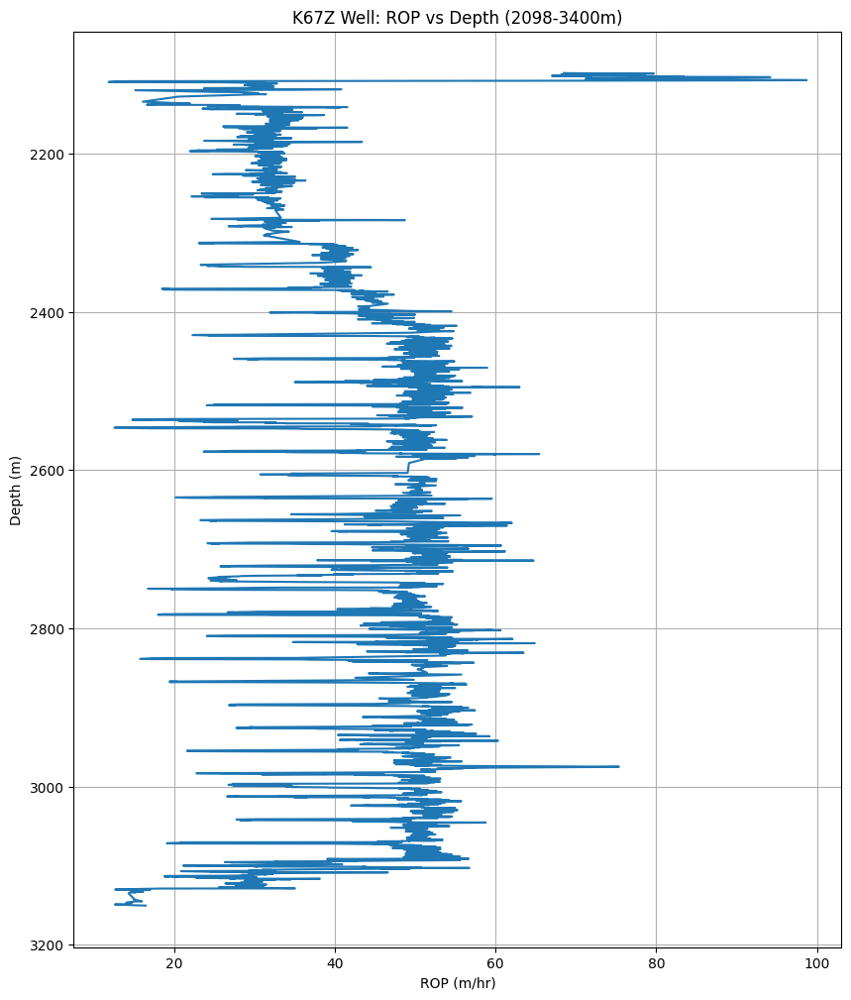


K67Z Well - Depths where ROP5 < 17 m/hr:
Depth: 2093.02m
Depth: 2093.67m
Depth: 2108.25m
Depth: 2108.36m
Depth: 2108.57m
Depth: 2108.77m
Depth: 2108.84m
Depth: 2109.09m
Depth: 2109.14m
Depth: 2109.49m
Depth: 2109.61m
Depth: 2109.65m
Depth: 2119.62m
Depth: 2119.76m
Depth: 2134.26m
Depth: 2136.93m
Depth: 2137.00m
Depth: 2137.27m
Depth: 2137.36m
Depth: 2137.42m
Depth: 2137.74m
Depth: 2137.90m
Depth: 2138.04m
Depth: 2138.26m
Depth: 2370.76m
Depth: 2370.91m
Depth: 2371.13m
Depth: 2371.24m
Depth: 2371.38m
Depth: 2371.43m
Depth: 2371.71m
Depth: 2371.86m
Depth: 2535.47m
Depth: 2535.59m
Depth: 2535.78m
Depth: 2535.93m
Depth: 2536.07m
Depth: 2536.25m
Depth: 2536.33m
Depth: 2536.53m
Depth: 2536.71m
Depth: 2545.87m
Depth: 2546.01m
Depth: 2546.26m
Depth: 2546.30m
Depth: 2546.46m
Depth: 2546.57m
Depth: 2546.75m
Depth: 2546.90m
Depth: 2547.02m
Depth: 2547.24m
Depth: 2749.95m
Depth: 2750.05m
Depth: 2750.18m
Depth: 2750.36m
Depth: 2750.57m
Depth: 2750.71m
Depth: 2782.07m
Depth: 2782.18m
Depth: 2782.30

In [ ]:
# Plot ROP vs depth for K67Z well in specified depth range
plt.figure(figsize=(10,12))
plt.plot(df_K67Z.loc[(df_K67Z['DEPTH'] >= 2098) & (df_K67Z['DEPTH'] <= 3155), 'ROP5'],
         df_K67Z.loc[(df_K67Z['DEPTH'] >= 2098) & (df_K67Z['DEPTH'] <= 3155), 'DEPTH'])

plt.gca().invert_yaxis() # Invert y-axis since depth increases downward
plt.xlabel('ROP (m/hr)')
plt.ylabel('Depth (m)')
plt.title('K67Z Well: ROP vs Depth (2098-3400m)')
plt.grid(True)
plt.show()
# Find depths where ROP5 is less than 17 in K67Z well
low_rop_depths_K67Z = df_K67Z[df_K67Z['ROP5'] < 20]['DEPTH'].values

print("\nK67Z Well - Depths where ROP5 < 20 m/hr:")
for depth in low_rop_depths_K67Z:
    print(f"Depth: {depth:.2f}m")


MSE Plots

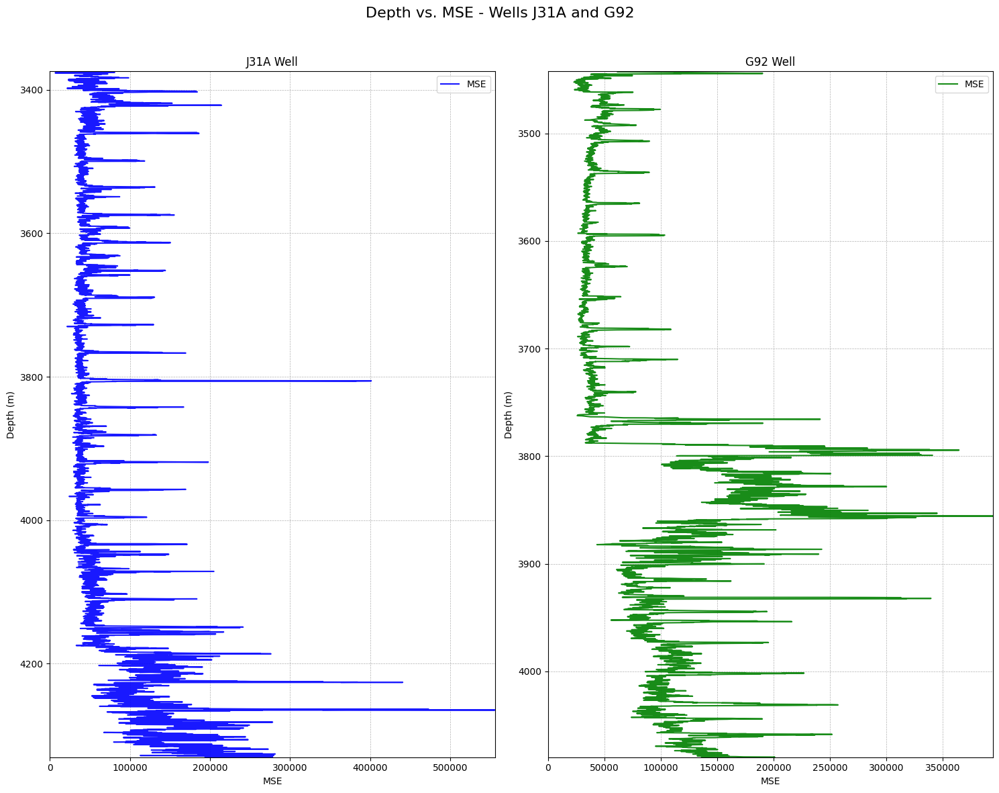

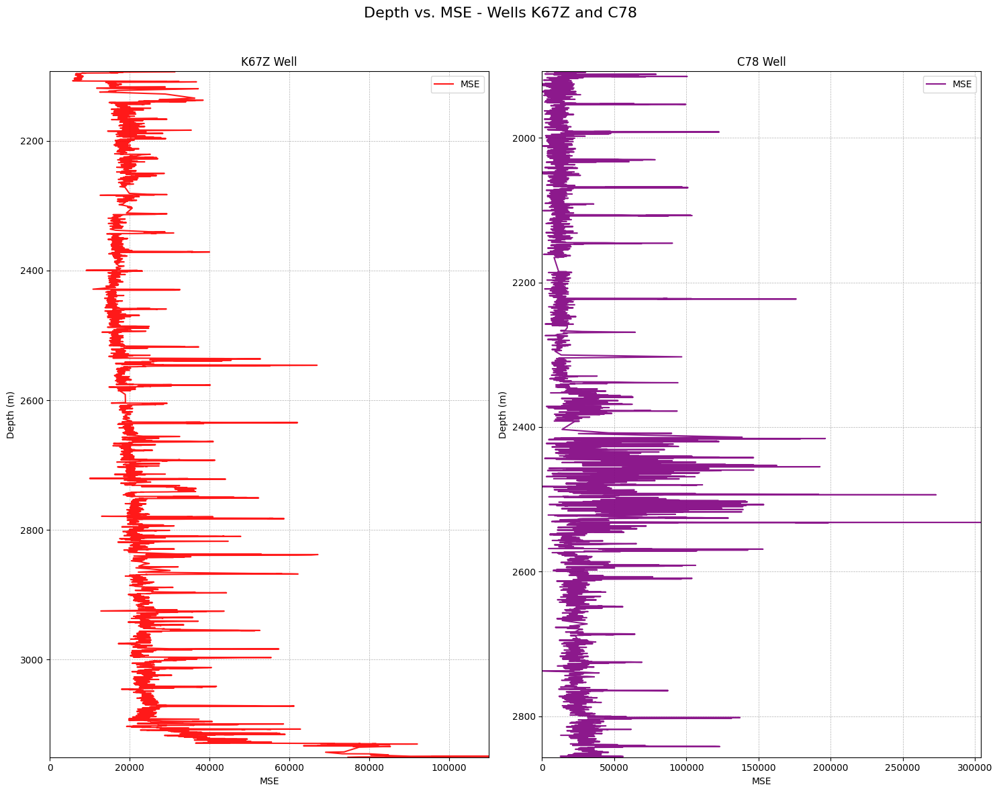

In [25]:
# Create first plot with J31A and G92
fig1, axes1 = plt.subplots(1, 2, figsize=(15, 12))
fig1.suptitle('Depth vs. MSE - Wells J31A and G92', fontsize=16)

wells_data1 = [
    (df_J31A, 'J31A Well', 'blue'),
    (df_G92, 'G92 Well', 'green')
]

for ax, (df, title, color) in zip(axes1, wells_data1):
    ax.plot(df['MSE'], df['DEPTH'], color=color, alpha=0.9, label='MSE')
    ax.set_xlim(0, df['MSE'].max())  # Use each well's own MSE max
    ax.set_ylim(df['DEPTH'].min(), df['DEPTH'].max())
    ax.invert_yaxis()
    ax.set_title(title)
    ax.set_xlabel('MSE')
    ax.set_ylabel('Depth (m)')
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Create second plot with K67Z and C78
fig2, axes2 = plt.subplots(1, 2, figsize=(15, 12))
fig2.suptitle('Depth vs. MSE - Wells K67Z and C78', fontsize=16)

wells_data2 = [
    (df_K67Z, 'K67Z Well', 'red'),
    (df_C78, 'C78 Well', 'purple')
]

for ax, (df, title, color) in zip(axes2, wells_data2):
    ax.plot(df['MSE'], df['DEPTH'], color=color, alpha=0.9, label='MSE')
    ax.set_xlim(0, df['MSE'].max())  # Use each well's own MSE max
    ax.set_ylim(df['DEPTH'].min(), df['DEPTH'].max())
    ax.invert_yaxis()
    ax.set_title(title)
    ax.set_xlabel('MSE')
    ax.set_ylabel('Depth (m)')
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



In [23]:
# Calculate and display MSE statistics for each well
print("\nMSE Statistics (MPa):")
print("\nJ31A Well:")
print(f"Mean: {df_J31A['MSE'].mean():.2f}")
print(f"Median: {df_J31A['MSE'].median():.2f}")
print(f"Std Dev: {df_J31A['MSE'].std():.2f}")
print(f"Min: {df_J31A['MSE'].min():.2f}")
print(f"Max: {df_J31A['MSE'].max():.2f}")

print("\nG92 Well:")
print(f"Mean: {df_G92['MSE'].mean():.2f}")
print(f"Median: {df_G92['MSE'].median():.2f}")
print(f"Std Dev: {df_G92['MSE'].std():.2f}")
print(f"Min: {df_G92['MSE'].min():.2f}")
print(f"Max: {df_G92['MSE'].max():.2f}")

print("\nK67Z Well:")
print(f"Mean: {df_K67Z['MSE'].mean():.2f}")
print(f"Median: {df_K67Z['MSE'].median():.2f}")
print(f"Std Dev: {df_K67Z['MSE'].std():.2f}")
print(f"Min: {df_K67Z['MSE'].min():.2f}")
print(f"Max: {df_K67Z['MSE'].max():.2f}")

print("\nC78 Well:")
print(f"Mean: {df_C78['MSE'].mean():.2f}")
print(f"Median: {df_C78['MSE'].median():.2f}")
print(f"Std Dev: {df_C78['MSE'].std():.2f}")
print(f"Min: {df_C78['MSE'].min():.2f}")
print(f"Max: {df_C78['MSE'].max():.2f}")



MSE Statistics (MPa):

J31A Well:
Mean: 65738.82
Median: 46147.15
Std Dev: 46291.80
Min: 6647.90
Max: 555822.31

G92 Well:
Mean: 84545.07
Median: 67491.88
Std Dev: 59249.77
Min: 22948.94
Max: 394750.86

K67Z Well:
Mean: 22621.59
Median: 20714.22
Std Dev: 8959.87
Min: 5688.83
Max: 109876.68

C78 Well:
Mean: 26312.28
Median: 19194.14
Std Dev: 24205.32
Min: 196.01
Max: 304171.89


In [74]:
# Display ROP5 values from J31A and ROP_opt from df_optROP
print("\nJ31A Well ROP5 Values:")
print(df_J31A[['DEPTH', 'ROP5']].to_string())

print("\nOptimized ROP Values:")
print(df_optROP[['DEPTH', 'ROP_opt']].to_string())




J31A Well ROP5 Values:
            DEPTH      ROP5
5178   3374.39990  57.61843
5181   3374.60010  53.93931
5187   3374.73999  41.18455
5192   3374.88013  31.22192
5196   3375.07983  23.77828
5201   3375.23999  22.83862
5203   3375.37012  19.36961
5207   3375.53003  18.70962
5209   3375.67017  16.89450
5212   3375.82007  15.82215
5213   3375.87988  15.02059
5218   3376.11987  14.44629
5220   3376.27002  15.27091
5223   3376.43994  16.38896
5225   3376.55005  18.45707
5228   3376.71997  17.94344
5231   3376.88989  19.61207
5235   3377.05981  18.96786
5237   3377.16992  19.93351
5241   3377.34009  20.25587
5244   3377.46997  19.30274
5247   3377.63989  19.47538
5251   3377.89014  19.17056
5252   3377.89990  19.03595
5254   3377.95996  18.97874
5259   3378.25000  18.33476
5262   3378.41016  18.80712
5263   3378.47998  19.40518
5266   3378.71021  19.23449
5268   3378.86987  19.69176
5270   3379.03003  21.49542
5272   3379.18994  22.32515
5274   3379.33984  22.98052
5279   3379.50000  23.56

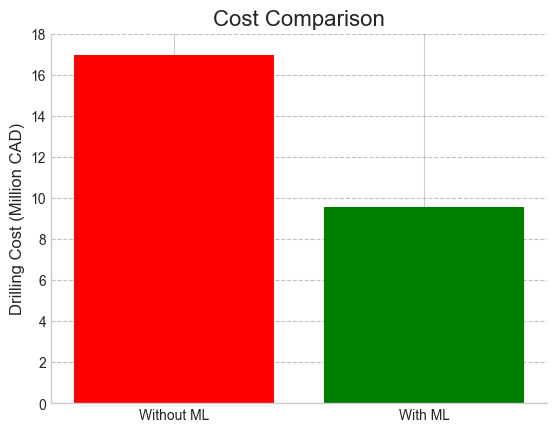

In [87]:
# Data for the plot
labels = ['Without ML', 'With ML']
costs = [16.96, 9.54] # Costs in Million CAD
colors = ['red', 'green']

# Create the figure and axes objects
fig, ax = plt.subplots()

# Create the bar chart
ax.bar(labels, costs, color=colors)

# Set the title and labels
ax.set_title('Cost Comparison', fontsize=16)
ax.set_ylabel('Drilling Cost (Million CAD)', fontsize=12)

# Set the y-axis limits
ax.set_ylim(0, 18)

# Add a dashed grid on the y-axis
ax.yaxis.grid(True, linestyle='--', which='both', color='gray', alpha=0.5)
ax.set_axisbelow(True) # Puts grid behind the bars

# Remove the top and right spines for a cleaner look
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Display the plot
plt.show()
